In [161]:
from oauthlib.oauth2 import BackendApplicationClient
from requests_oauthlib import OAuth2Session
from PIL import Image
import io
import numpy as np
import matplotlib.pyplot as plt

In [162]:
CLIENT_ID = '7b4a1dab-5812-4a59-8dcb-288c6ff85f4d'
CLIENT_SECRET = 'p%DXOx8I(JPf@-&KK*}M_1}n:zbSv0X7BeTrEyJ/'

In [163]:
# set up credentials
client = BackendApplicationClient(client_id=CLIENT_ID)
oauth = OAuth2Session(client=client)

# get an authentication token
token = oauth.fetch_token(token_url='https://services.sentinel-hub.com/oauth/token',
                          client_id=CLIENT_ID, client_secret=CLIENT_SECRET)

In [164]:
bbox=[-88.340432, 32.991199, -87.836596, 33.534008]
geometry={"type":"Polygon","coordinates":[[[-88.297059,33.349083],[-88.296279,33.355508],[-88.296245,33.355793],[-88.295859,33.358945],[-88.295836,33.359137],[-88.294867,33.367103],[-88.293953,33.375121],[-88.293233,33.381083],[-88.293217,33.381216],[-88.293006,33.382962],[-88.292573,33.386522],[-88.292575,33.386537],[-88.292202,33.389628],[-88.292192,33.38971],[-88.291063,33.399053],[-88.291062,33.399065],[-88.290796,33.401264],[-88.290057,33.407386],[-88.289705,33.410302],[-88.289683,33.410484],[-88.287695,33.42694],[-88.286467,33.437116],[-88.286239,33.439006],[-88.285921,33.44164],[-88.285602,33.44428],[-88.285586,33.444411],[-88.28485,33.450508],[-88.283877,33.45857],[-88.283369,33.462778],[-88.283348,33.462949],[-88.283184,33.464306],[-88.283151,33.464582],[-88.283126,33.46479],[-88.282753,33.467874],[-88.282441,33.470454],[-88.282106,33.473236],[-88.281851,33.475341],[-88.281748,33.476197],[-88.28165,33.47701],[-88.281636,33.477122],[-88.280789,33.484131],[-88.280787,33.484153],[-88.280076,33.490042],[-88.280065,33.490136],[-88.279585,33.494115],[-88.279551,33.494397],[-88.279128,33.497895],[-88.27886,33.500117],[-88.278765,33.5005],[-88.278712,33.500714],[-88.278267,33.50475],[-88.277388,33.512479],[-88.277367,33.512666],[-88.277364,33.512696],[-88.277227,33.51372],[-88.277156,33.5142],[-88.277001,33.515179],[-88.276944,33.515616],[-88.276802,33.516585],[-88.275675,33.525532],[-88.275646,33.525767],[-88.274619,33.534008],[-88.273833,33.533958],[-88.271563,33.53392],[-88.268316,33.533865],[-88.258761,33.533704],[-88.253182,33.533619],[-88.25301,33.533613],[-88.252996,33.533616],[-88.250034,33.533558],[-88.246291,33.533054],[-88.23857,33.532994],[-88.22858,33.532915],[-88.218159,33.532832],[-88.210862,33.532759],[-88.206555,33.532739],[-88.20648,33.532739],[-88.20642,33.532739],[-88.201368,33.53259],[-88.17692,33.531867],[-88.16504,33.531514],[-88.161403,33.531405],[-88.161223,33.531398],[-88.161206,33.531397],[-88.158264,33.531267],[-88.147675,33.530969],[-88.14476,33.530887],[-88.144726,33.530886],[-88.135555,33.530628],[-88.130419,33.530434],[-88.125028,33.530332],[-88.124304,33.530234],[-88.115109,33.529974],[-88.095518,33.52942],[-88.092284,33.529297],[-88.085736,33.529072],[-88.085583,33.529068],[-88.083806,33.529004],[-88.081787,33.528923],[-88.081763,33.528922],[-88.081266,33.528874],[-88.076516,33.52866],[-88.074973,33.528588],[-88.070349,33.528371],[-88.070195,33.528385],[-88.069994,33.528365],[-88.069933,33.528362],[-88.069839,33.528357],[-88.063939,33.528077],[-88.063757,33.528067],[-88.058724,33.527803],[-88.058711,33.527802],[-88.058075,33.527769],[-88.05803,33.527766],[-88.051595,33.52743],[-88.050873,33.527467],[-88.050575,33.527451],[-88.048533,33.527344],[-88.044343,33.527254],[-88.04037,33.527168],[-88.036644,33.527174],[-88.03315,33.527126],[-88.026464,33.527034],[-88.026447,33.527034],[-88.02445,33.527008],[-88.023975,33.527002],[-88.023911,33.527001],[-88.023892,33.527],[-88.023877,33.527],[-88.023863,33.527],[-88.01484,33.526764],[-88.01004,33.52664],[-88.010006,33.526639],[-88.009872,33.526637],[-88.007172,33.526567],[-88.001548,33.526423],[-88.001326,33.526417],[-88.000022,33.52623],[-87.996227,33.526069],[-87.990435,33.525827],[-87.990151,33.525814],[-87.990133,33.525813],[-87.978576,33.525329],[-87.966146,33.524808],[-87.946519,33.523987],[-87.946519,33.524065],[-87.937553,33.524181],[-87.933144,33.524237],[-87.932844,33.524242],[-87.932801,33.524243],[-87.921388,33.524389],[-87.921368,33.524389],[-87.909377,33.524546],[-87.908804,33.524552],[-87.900786,33.524658],[-87.898831,33.524683],[-87.898612,33.524686],[-87.891365,33.52478],[-87.885318,33.524859],[-87.878684,33.524945],[-87.875018,33.524993],[-87.870726,33.525077],[-87.866272,33.525181],[-87.861862,33.525242],[-87.860685,33.525259],[-87.85856,33.525326],[-87.854916,33.52523],[-87.8503,33.525157],[-87.845271,33.524985],[-87.840683,33.524839],[-87.840687,33.51756],[-87.84071,33.514443],[-87.840711,33.514288],[-87.840657,33.511539],[-87.840429,33.507382],[-87.840282,33.505108],[-87.840192,33.503391],[-87.83999,33.500855],[-87.839879,33.500114],[-87.839789,33.499553],[-87.839766,33.499406],[-87.839695,33.496114],[-87.839691,33.495877],[-87.839639,33.4916],[-87.839583,33.488805],[-87.839387,33.47732],[-87.839139,33.462799],[-87.839137,33.462659],[-87.839137,33.462643],[-87.839028,33.456282],[-87.838784,33.442002],[-87.838475,33.438744],[-87.838607,33.437831],[-87.838835,33.436264],[-87.838608,33.431877],[-87.838605,33.431783],[-87.838605,33.431767],[-87.838605,33.431738],[-87.838604,33.431691],[-87.838604,33.431671],[-87.838487,33.424706],[-87.838356,33.414009],[-87.838228,33.409267],[-87.838406,33.391883],[-87.83844,33.388531],[-87.838191,33.377439],[-87.838179,33.375116],[-87.838209,33.370336],[-87.838234,33.364748],[-87.838264,33.361238],[-87.838279,33.359505],[-87.838406,33.346915],[-87.838463,33.341383],[-87.838426,33.336799],[-87.838377,33.330767],[-87.838359,33.328362],[-87.838175,33.323406],[-87.8381,33.321382],[-87.838105,33.32115],[-87.838106,33.321123],[-87.838181,33.318164],[-87.838159,33.314771],[-87.838048,33.297373],[-87.838035,33.295364],[-87.838027,33.294091],[-87.838021,33.292994],[-87.838442,33.284309],[-87.838447,33.284193],[-87.838572,33.281621],[-87.838572,33.281604],[-87.838571,33.281568],[-87.838547,33.280656],[-87.838489,33.278454],[-87.838482,33.278207],[-87.838298,33.271236],[-87.837982,33.25916],[-87.838091,33.258862],[-87.838036,33.256822],[-87.838254,33.256044],[-87.838279,33.2539],[-87.838281,33.253822],[-87.838243,33.250118],[-87.837895,33.248925],[-87.837893,33.24888],[-87.837892,33.248857],[-87.837729,33.243294],[-87.837598,33.238838],[-87.837384,33.231564],[-87.837208,33.225544],[-87.836955,33.21689],[-87.836954,33.216828],[-87.836893,33.211696],[-87.83674,33.200966],[-87.836726,33.199527],[-87.836715,33.198459],[-87.836695,33.196438],[-87.836693,33.196243],[-87.836628,33.189604],[-87.836596,33.186317],[-87.836631,33.184899],[-87.836661,33.183664],[-87.836803,33.177959],[-87.83707,33.167203],[-87.837071,33.167173],[-87.837325,33.159529],[-87.837521,33.153637],[-87.837842,33.153657],[-87.83825,33.15345],[-87.838359,33.152535],[-87.838522,33.152192],[-87.83874,33.152054],[-87.839666,33.152146],[-87.839857,33.151871],[-87.839884,33.151206],[-87.839639,33.150495],[-87.839638,33.150199],[-87.839938,33.150084],[-87.840728,33.150404],[-87.8413,33.150793],[-87.841654,33.150908],[-87.841926,33.150817],[-87.841981,33.150702],[-87.84209,33.150335],[-87.842661,33.149213],[-87.843097,33.148983],[-87.843833,33.148868],[-87.844623,33.148983],[-87.845358,33.148615],[-87.84563,33.148341],[-87.845875,33.147768],[-87.846011,33.147677],[-87.846338,33.147654],[-87.846855,33.147745],[-87.847182,33.147516],[-87.847291,33.147309],[-87.847645,33.147149],[-87.848571,33.147056],[-87.849007,33.146943],[-87.850259,33.147033],[-87.850586,33.146897],[-87.851675,33.146759],[-87.852084,33.146507],[-87.852329,33.146071],[-87.852328,33.145728],[-87.852247,33.145521],[-87.851892,33.145108],[-87.851892,33.144123],[-87.852001,33.143918],[-87.852219,33.143757],[-87.852845,33.14362],[-87.853853,33.143963],[-87.853989,33.143711],[-87.85377,33.142909],[-87.853797,33.142428],[-87.854369,33.141947],[-87.85494,33.14119],[-87.856057,33.140824],[-87.85641,33.140182],[-87.85671,33.140158],[-87.856846,33.140273],[-87.857064,33.140709],[-87.857391,33.14096],[-87.858426,33.141303],[-87.858753,33.141601],[-87.859162,33.141692],[-87.859515,33.141166],[-87.859951,33.141143],[-87.860251,33.141349],[-87.860251,33.141692],[-87.859951,33.142105],[-87.859897,33.142494],[-87.860033,33.142654],[-87.861068,33.142906],[-87.861177,33.143067],[-87.861178,33.143388],[-87.86096,33.143639],[-87.860878,33.143938],[-87.861042,33.144098],[-87.861641,33.144098],[-87.86224,33.143662],[-87.862784,33.143662],[-87.863247,33.143569],[-87.863764,33.143065],[-87.864146,33.143065],[-87.864391,33.143363],[-87.864827,33.143431],[-87.86499,33.14311],[-87.864989,33.141759],[-87.86567,33.141713],[-87.865915,33.141553],[-87.865942,33.141049],[-87.867493,33.140292],[-87.868283,33.140292],[-87.869018,33.14052],[-87.869699,33.140909],[-87.869945,33.140909],[-87.869917,33.140039],[-87.870189,33.139695],[-87.870733,33.139603],[-87.871087,33.139809],[-87.871415,33.140267],[-87.871905,33.140335],[-87.871931,33.139418],[-87.872013,33.139305],[-87.87362,33.139006],[-87.874356,33.139304],[-87.874558,33.139304],[-87.874626,33.139212],[-87.874626,33.138502],[-87.875016,33.138342],[-87.875595,33.138457],[-87.875812,33.138641],[-87.876003,33.139076],[-87.87622,33.139237],[-87.876602,33.13926],[-87.876792,33.13919],[-87.877855,33.13729],[-87.878237,33.137107],[-87.878863,33.136969],[-87.879544,33.137222],[-87.879898,33.137175],[-87.880116,33.136924],[-87.880171,33.13626],[-87.881178,33.135688],[-87.881995,33.135551],[-87.88224,33.135734],[-87.883003,33.135666],[-87.883656,33.135849],[-87.883901,33.135711],[-87.88401,33.135506],[-87.883929,33.135047],[-87.883385,33.134406],[-87.883167,33.134314],[-87.883113,33.133626],[-87.883358,33.133192],[-87.883985,33.132711],[-87.884747,33.132688],[-87.884856,33.13262],[-87.884802,33.132047],[-87.885102,33.131794],[-87.885592,33.131771],[-87.886136,33.131956],[-87.886463,33.131979],[-87.886627,33.131818],[-87.886926,33.131704],[-87.887062,33.131796],[-87.887225,33.132139],[-87.88777,33.132047],[-87.887988,33.132392],[-87.888587,33.132506],[-87.888886,33.132323],[-87.888914,33.131566],[-87.889377,33.130789],[-87.890058,33.129964],[-87.890194,33.129964],[-87.890276,33.129827],[-87.89112,33.129644],[-87.891556,33.129713],[-87.892182,33.129942],[-87.8924,33.130125],[-87.892427,33.130491],[-87.891555,33.130536],[-87.891201,33.130698],[-87.890902,33.131064],[-87.890956,33.131338],[-87.891174,33.131453],[-87.891609,33.131476],[-87.892372,33.131271],[-87.89259,33.131019],[-87.892808,33.130881],[-87.892808,33.130721],[-87.89357,33.130629],[-87.893706,33.130538],[-87.893979,33.130515],[-87.894877,33.130035],[-87.895368,33.129942],[-87.896702,33.129966],[-87.89711,33.129897],[-87.897655,33.129554],[-87.897737,33.129257],[-87.898036,33.128959],[-87.898445,33.128959],[-87.898771,33.128844],[-87.898853,33.128638],[-87.899153,33.128386],[-87.899534,33.128295],[-87.900106,33.128386],[-87.900705,33.128089],[-87.901222,33.127952],[-87.901658,33.128158],[-87.902202,33.128203],[-87.902447,33.128135],[-87.902393,33.127929],[-87.902366,33.127563],[-87.902121,33.127356],[-87.902094,33.126944],[-87.902312,33.126738],[-87.903047,33.126807],[-87.903319,33.126897],[-87.903674,33.12683],[-87.903892,33.126418],[-87.903755,33.12621],[-87.903319,33.125936],[-87.903374,33.125492],[-87.903798,33.125121],[-87.905311,33.124671],[-87.90561,33.124423],[-87.905638,33.123987],[-87.905529,33.123736],[-87.905257,33.123551],[-87.904821,33.12346],[-87.904767,33.12314],[-87.905012,33.122842],[-87.905393,33.122659],[-87.905774,33.122636],[-87.90621,33.122751],[-87.906618,33.122751],[-87.906754,33.122613],[-87.906754,33.122383],[-87.906673,33.122293],[-87.905965,33.12204],[-87.905911,33.121581],[-87.906028,33.121457],[-87.906128,33.121353],[-87.906918,33.121101],[-87.907953,33.121124],[-87.908742,33.121285],[-87.908933,33.1214],[-87.909069,33.121674],[-87.909041,33.121995],[-87.908742,33.122453],[-87.908578,33.122889],[-87.908687,33.123278],[-87.909068,33.12353],[-87.909531,33.123691],[-87.910184,33.123668],[-87.91062,33.12337],[-87.910756,33.123072],[-87.910811,33.122521],[-87.910675,33.12211],[-87.910675,33.121651],[-87.910947,33.121536],[-87.911655,33.12156],[-87.911982,33.121721],[-87.912444,33.12211],[-87.912499,33.122408],[-87.912172,33.122866],[-87.91209,33.123347],[-87.912172,33.123531],[-87.912471,33.123621],[-87.91307,33.123531],[-87.913778,33.123187],[-87.914894,33.123027],[-87.915385,33.12289],[-87.915793,33.1225],[-87.915984,33.121927],[-87.91631,33.121767],[-87.9168,33.121699],[-87.917781,33.12147],[-87.917971,33.121285],[-87.917971,33.120621],[-87.918162,33.12037],[-87.918434,33.120323],[-87.918979,33.121012],[-87.919441,33.121057],[-87.919659,33.120874],[-87.919686,33.120645],[-87.919986,33.120508],[-87.920204,33.120668],[-87.92034,33.120989],[-87.920694,33.121125],[-87.920939,33.121125],[-87.921184,33.120966],[-87.921293,33.120691],[-87.921347,33.120095],[-87.921592,33.1195],[-87.921892,33.119225],[-87.922926,33.118767],[-87.922954,33.118468],[-87.9226,33.117987],[-87.922518,33.117644],[-87.922627,33.117324],[-87.922818,33.117162],[-87.923417,33.117049],[-87.924016,33.117255],[-87.924261,33.117507],[-87.92426,33.118767],[-87.92407,33.11934],[-87.923607,33.120027],[-87.923688,33.120302],[-87.923906,33.120417],[-87.924178,33.120393],[-87.924968,33.119752],[-87.92524,33.119317],[-87.925295,33.118698],[-87.925404,33.118606],[-87.925758,33.118584],[-87.925921,33.118698],[-87.926356,33.119774],[-87.926329,33.1206],[-87.926248,33.120714],[-87.926275,33.121195],[-87.926411,33.121333],[-87.926683,33.121402],[-87.927146,33.121104],[-87.927364,33.120623],[-87.927473,33.119912],[-87.928072,33.118011],[-87.928507,33.11737],[-87.928671,33.116683],[-87.929052,33.116498],[-87.929923,33.116408],[-87.930413,33.116545],[-87.930985,33.116293],[-87.930767,33.115743],[-87.930849,33.115537],[-87.931529,33.11517],[-87.931801,33.114415],[-87.932319,33.114277],[-87.932618,33.114071],[-87.932645,33.113864],[-87.932945,33.11359],[-87.932972,33.113475],[-87.933353,33.113177],[-87.93368,33.1132],[-87.933898,33.113338],[-87.934006,33.113613],[-87.933979,33.114277],[-87.933843,33.114644],[-87.933544,33.115125],[-87.933516,33.11533],[-87.933653,33.11556],[-87.934088,33.11556],[-87.934579,33.1154],[-87.934906,33.115125],[-87.935015,33.114827],[-87.93496,33.114666],[-87.935178,33.113979],[-87.935532,33.11375],[-87.937029,33.113428],[-87.937982,33.113338],[-87.938118,33.113452],[-87.938145,33.11375],[-87.937927,33.114207],[-87.937955,33.114575],[-87.938091,33.114666],[-87.938309,33.114666],[-87.938799,33.114002],[-87.939506,33.113269],[-87.939534,33.112857],[-87.939425,33.112605],[-87.939452,33.112146],[-87.939806,33.111345],[-87.940323,33.111322],[-87.940541,33.111505],[-87.940731,33.112032],[-87.940895,33.112192],[-87.941194,33.11226],[-87.941602,33.112169],[-87.942228,33.111871],[-87.942528,33.111482],[-87.942555,33.11123],[-87.942392,33.111069],[-87.941602,33.110954],[-87.941167,33.110588],[-87.940976,33.109993],[-87.941112,33.109741],[-87.941575,33.109443],[-87.942038,33.10935],[-87.942092,33.109603],[-87.942446,33.109947],[-87.942745,33.110016],[-87.943344,33.109718],[-87.943589,33.109327],[-87.943589,33.108916],[-87.942636,33.108595],[-87.942772,33.107839],[-87.943099,33.107633],[-87.943616,33.10761],[-87.944052,33.107839],[-87.944106,33.108342],[-87.944188,33.108412],[-87.944079,33.108916],[-87.944406,33.108893],[-87.94476,33.108893],[-87.94574,33.108342],[-87.946366,33.10832],[-87.94691,33.108137],[-87.946937,33.107747],[-87.94691,33.107472],[-87.947073,33.107014],[-87.947481,33.106212],[-87.947726,33.106166],[-87.948216,33.105731],[-87.948488,33.105364],[-87.949169,33.104768],[-87.949414,33.104677],[-87.949414,33.104517],[-87.949795,33.104149],[-87.94998,33.103915],[-87.950121,33.103738],[-87.950339,33.103439],[-87.950405,33.1032],[-87.950502,33.102843],[-87.950584,33.102224],[-87.950447,33.10078],[-87.950257,33.100301],[-87.950229,33.099614],[-87.950637,33.098377],[-87.950855,33.097987],[-87.9511,33.09778],[-87.951808,33.097529],[-87.95227,33.097139],[-87.952978,33.096359],[-87.953223,33.095833],[-87.953222,33.095191],[-87.954147,33.093747],[-87.954229,33.09313],[-87.954229,33.092627],[-87.95431,33.092581],[-87.954337,33.091549],[-87.954473,33.09116],[-87.954882,33.090885],[-87.955453,33.09084],[-87.955834,33.091023],[-87.956624,33.09171],[-87.957168,33.09187],[-87.95744,33.091687],[-87.95744,33.091023],[-87.957086,33.090358],[-87.957167,33.09006],[-87.957331,33.089877],[-87.958365,33.089212],[-87.958392,33.088869],[-87.958201,33.088707],[-87.957984,33.088662],[-87.957602,33.088273],[-87.957493,33.087884],[-87.957493,33.087218],[-87.957575,33.087035],[-87.95782,33.08683],[-87.957983,33.086807],[-87.958391,33.086807],[-87.959181,33.087494],[-87.960487,33.088181],[-87.961086,33.088112],[-87.961358,33.087905],[-87.962038,33.086944],[-87.962119,33.086531],[-87.962419,33.086073],[-87.962636,33.085912],[-87.962909,33.086027],[-87.962909,33.086577],[-87.963208,33.086989],[-87.96348,33.08708],[-87.96378,33.086875],[-87.963807,33.08614],[-87.963453,33.085659],[-87.963453,33.085385],[-87.964378,33.085293],[-87.964732,33.085133],[-87.964949,33.084881],[-87.964976,33.084308],[-87.965139,33.084102],[-87.96552,33.084032],[-87.966146,33.084423],[-87.966555,33.0844],[-87.966963,33.084102],[-87.96718,33.083804],[-87.967207,33.083437],[-87.966744,33.082865],[-87.9662,33.082566],[-87.966173,33.082268],[-87.966254,33.082062],[-87.966581,33.081902],[-87.967533,33.081856],[-87.968023,33.081742],[-87.968241,33.081604],[-87.968241,33.081443],[-87.968132,33.081328],[-87.967669,33.081145],[-87.967451,33.080962],[-87.967478,33.080619],[-87.968322,33.080458],[-87.968485,33.079932],[-87.967777,33.079451],[-87.967723,33.079107],[-87.967804,33.078924],[-87.968321,33.078809],[-87.968457,33.078924],[-87.96873,33.079152],[-87.969247,33.079244],[-87.969491,33.079015],[-87.969546,33.07874],[-87.969165,33.078442],[-87.968348,33.078235],[-87.968267,33.078167],[-87.968403,33.077847],[-87.968838,33.077641],[-87.969709,33.077572],[-87.971151,33.078007],[-87.971722,33.078006],[-87.972185,33.077869],[-87.974281,33.077868],[-87.97439,33.078006],[-87.975397,33.078325],[-87.975996,33.078165],[-87.976839,33.077753],[-87.977574,33.077753],[-87.977819,33.077844],[-87.978254,33.07837],[-87.978064,33.079493],[-87.9782,33.079631],[-87.979343,33.079814],[-87.979779,33.080043],[-87.980704,33.080982],[-87.98114,33.080913],[-87.981493,33.080615],[-87.981548,33.080019],[-87.981357,33.079469],[-87.981275,33.079424],[-87.98103,33.078598],[-87.981084,33.078209],[-87.981247,33.078094],[-87.981791,33.077934],[-87.98288,33.077888],[-87.983206,33.078094],[-87.983207,33.07885],[-87.98337,33.078919],[-87.983778,33.078919],[-87.984159,33.078643],[-87.984349,33.078392],[-87.984431,33.078024],[-87.984403,33.077818],[-87.983804,33.077132],[-87.983831,33.076765],[-87.984294,33.076673],[-87.984838,33.076994],[-87.985274,33.077565],[-87.98522,33.078162],[-87.985411,33.078391],[-87.985683,33.078367],[-87.985982,33.078207],[-87.986934,33.077129],[-87.98726,33.07697],[-87.987233,33.07681],[-87.987613,33.076121],[-87.98881,33.075572],[-87.989028,33.075297],[-87.989,33.074999],[-87.988755,33.074816],[-87.988701,33.074633],[-87.989435,33.074449],[-87.989735,33.074266],[-87.989898,33.073922],[-87.989544,33.073394],[-87.989516,33.073143],[-87.990006,33.072868],[-87.990822,33.072799],[-87.99104,33.072845],[-87.991475,33.073165],[-87.991775,33.073211],[-87.992183,33.073096],[-87.992264,33.073003],[-87.993026,33.07282],[-87.993516,33.073186],[-87.993788,33.073301],[-87.994768,33.073141],[-87.995339,33.073438],[-87.996183,33.073461],[-87.996591,33.0733],[-87.996591,33.073002],[-87.996373,33.072772],[-87.996291,33.072498],[-87.996345,33.072269],[-87.996318,33.071925],[-87.996127,33.071697],[-87.996127,33.071353],[-87.996562,33.071101],[-87.997269,33.071008],[-87.998113,33.071421],[-87.998494,33.071466],[-87.998793,33.071329],[-87.999564,33.070549],[-88.000019,33.070503],[-88.00014,33.070667],[-88.000366,33.070711],[-88.000393,33.070872],[-88.000434,33.070963],[-88.000449,33.071084],[-88.000483,33.071357],[-88.000549,33.071883],[-88.000592,33.072224],[-88.000836,33.072398],[-88.001136,33.072612],[-88.001517,33.072727],[-88.002523,33.072682],[-88.002577,33.072646],[-88.002823,33.072477],[-88.00285,33.072362],[-88.002905,33.072316],[-88.002959,33.071789],[-88.003205,33.071606],[-88.003532,33.071697],[-88.003994,33.072201],[-88.004347,33.072684],[-88.004347,33.072842],[-88.004347,33.073003],[-88.003912,33.073348],[-88.003912,33.073577],[-88.004075,33.073645],[-88.004736,33.073475],[-88.004782,33.073462],[-88.00481,33.073324],[-88.005066,33.072977],[-88.005164,33.072844],[-88.005599,33.072203],[-88.005683,33.072108],[-88.005844,33.071928],[-88.006035,33.071814],[-88.006293,33.071759],[-88.00647,33.071722],[-88.006715,33.071814],[-88.007041,33.072135],[-88.007341,33.072135],[-88.007559,33.071998],[-88.00757,33.071925],[-88.007613,33.071654],[-88.00752,33.071458],[-88.007396,33.071196],[-88.007396,33.071098],[-88.007396,33.070738],[-88.007587,33.070646],[-88.008113,33.070622],[-88.008566,33.070601],[-88.009333,33.070422],[-88.009355,33.070417],[-88.009573,33.070532],[-88.009573,33.07067],[-88.009627,33.070739],[-88.009659,33.070901],[-88.009681,33.071013],[-88.00975,33.071083],[-88.009817,33.071151],[-88.01014,33.071151],[-88.010606,33.071151],[-88.010933,33.071266],[-88.011395,33.071289],[-88.011668,33.071174],[-88.011809,33.071075],[-88.011994,33.070946],[-88.012066,33.070839],[-88.012103,33.070785],[-88.012158,33.07051],[-88.012103,33.070349],[-88.01203,33.070265],[-88.011967,33.070189],[-88.011287,33.069913],[-88.01107,33.0698],[-88.01107,33.069685],[-88.011102,33.069649],[-88.011151,33.069594],[-88.011832,33.069571],[-88.012757,33.069823],[-88.012947,33.069868],[-88.01302,33.069823],[-88.013165,33.069732],[-88.01315,33.069628],[-88.013138,33.069549],[-88.012866,33.06909],[-88.012908,33.068998],[-88.013193,33.068379],[-88.013189,33.068354],[-88.013171,33.068225],[-88.013138,33.067991],[-88.012975,33.067807],[-88.013003,33.067555],[-88.013166,33.067372],[-88.013765,33.067304],[-88.014118,33.067464],[-88.014553,33.067831],[-88.014825,33.068013],[-88.015043,33.06806],[-88.01537,33.067877],[-88.015506,33.067648],[-88.015587,33.067349],[-88.015696,33.067144],[-88.01605,33.067098],[-88.016522,33.067529],[-88.016703,33.067694],[-88.017138,33.06767],[-88.017289,33.067608],[-88.017465,33.067534],[-88.017554,33.067389],[-88.017873,33.06687],[-88.017982,33.066755],[-88.018308,33.066546],[-88.018344,33.066522],[-88.018554,33.066389],[-88.01909,33.066389],[-88.019696,33.066389],[-88.020131,33.066642],[-88.020675,33.066871],[-88.020752,33.066856],[-88.021138,33.066778],[-88.021274,33.066665],[-88.021383,33.066459],[-88.021302,33.066184],[-88.021152,33.066062],[-88.019833,33.064991],[-88.019588,33.06474],[-88.01967,33.064557],[-88.019764,33.064451],[-88.019833,33.064373],[-88.019931,33.064368],[-88.020241,33.064352],[-88.021166,33.06481],[-88.021574,33.064833],[-88.0222,33.064742],[-88.022363,33.06481],[-88.022826,33.065269],[-88.023206,33.065406],[-88.023478,33.065452],[-88.023696,33.065384],[-88.023768,33.0653],[-88.024186,33.064811],[-88.024593,33.064436],[-88.024758,33.064284],[-88.025084,33.064078],[-88.025383,33.064055],[-88.026282,33.064307],[-88.026398,33.064314],[-88.026437,33.064315],[-88.026717,33.064331],[-88.02675,33.06416],[-88.026826,33.063758],[-88.026956,33.063618],[-88.026971,33.063602],[-88.027507,33.063025],[-88.027697,33.06291],[-88.028024,33.062888],[-88.028269,33.062934],[-88.028591,33.06299],[-88.02865,33.063001],[-88.02884,33.062911],[-88.028926,33.062809],[-88.028976,33.06275],[-88.029058,33.062086],[-88.029018,33.061951],[-88.029005,33.061908],[-88.028949,33.061718],[-88.028841,33.061605],[-88.028698,33.061583],[-88.028242,33.061512],[-88.028106,33.061467],[-88.028188,33.061307],[-88.02846,33.061147],[-88.029194,33.061124],[-88.030092,33.061216],[-88.030282,33.061352],[-88.030446,33.061559],[-88.030745,33.06172],[-88.030963,33.061697],[-88.031044,33.061697],[-88.031235,33.061624],[-88.031321,33.061591],[-88.031343,33.061583],[-88.03148,33.061284],[-88.031344,33.060918],[-88.030909,33.060322],[-88.030855,33.060139],[-88.0308,33.059956],[-88.030882,33.059544],[-88.030991,33.059314],[-88.031045,33.05881],[-88.030909,33.058421],[-88.030229,33.057825],[-88.029876,33.05755],[-88.029386,33.057491],[-88.029114,33.057457],[-88.028998,33.057378],[-88.028592,33.057099],[-88.028516,33.057046],[-88.028118,33.057046],[-88.027591,33.057046],[-88.027558,33.057024],[-88.027455,33.056953],[-88.027373,33.056655],[-88.027319,33.056587],[-88.027319,33.055946],[-88.027434,33.055636],[-88.027455,33.055579],[-88.027556,33.055433],[-88.027679,33.055255],[-88.027755,33.055144],[-88.027837,33.055065],[-88.028136,33.054778],[-88.029115,33.053998],[-88.029605,33.05377],[-88.031537,33.053266],[-88.032298,33.052877],[-88.032706,33.052809],[-88.032951,33.052968],[-88.032951,33.053129],[-88.033005,33.054755],[-88.033223,33.055168],[-88.033685,33.055672],[-88.033903,33.055764],[-88.034063,33.055766],[-88.034285,33.055768],[-88.035508,33.055787],[-88.035734,33.055858],[-88.036024,33.055948],[-88.036106,33.056131],[-88.036106,33.056544],[-88.03578,33.056986],[-88.035752,33.057025],[-88.035752,33.057116],[-88.035643,33.057254],[-88.035628,33.057502],[-88.035621,33.057623],[-88.035616,33.057712],[-88.035779,33.057848],[-88.036034,33.057934],[-88.037846,33.058537],[-88.038227,33.058812],[-88.038717,33.059018],[-88.039043,33.059064],[-88.039342,33.058973],[-88.039386,33.058923],[-88.039587,33.058698],[-88.039588,33.058124],[-88.039479,33.057713],[-88.039452,33.057392],[-88.03937,33.057299],[-88.039343,33.057001],[-88.039234,33.056773],[-88.039232,33.056747],[-88.039207,33.056337],[-88.039098,33.056223],[-88.039098,33.055695],[-88.039289,33.055238],[-88.039425,33.054826],[-88.039452,33.054116],[-88.039433,33.054077],[-88.039398,33.054001],[-88.039371,33.053635],[-88.039289,33.053589],[-88.039262,33.053451],[-88.039235,33.053382],[-88.039208,33.053314],[-88.039045,33.053016],[-88.038936,33.052718],[-88.038555,33.052214],[-88.038119,33.051316],[-88.038066,33.051206],[-88.037984,33.050977],[-88.03793,33.050908],[-88.03793,33.050839],[-88.037848,33.050748],[-88.037848,33.050632],[-88.03725,33.049602],[-88.037005,33.049281],[-88.036672,33.048949],[-88.036407,33.048685],[-88.034851,33.047041],[-88.034803,33.04699],[-88.034422,33.046439],[-88.034368,33.046211],[-88.034232,33.046028],[-88.034014,33.045982],[-88.033987,33.046463],[-88.034096,33.046692],[-88.034014,33.04715],[-88.03366,33.047402],[-88.033632,33.047407],[-88.033198,33.047494],[-88.03298,33.047356],[-88.032885,33.046971],[-88.032817,33.046692],[-88.032736,33.046463],[-88.032342,33.046104],[-88.032029,33.04582],[-88.032029,33.045752],[-88.032002,33.045682],[-88.031947,33.045523],[-88.031893,33.045431],[-88.031893,33.044446],[-88.031812,33.044193],[-88.031404,33.043461],[-88.031398,33.043255],[-88.031377,33.042544],[-88.031486,33.04243],[-88.031526,33.042295],[-88.031568,33.042155],[-88.031773,33.042122],[-88.032873,33.041949],[-88.033299,33.042068],[-88.033363,33.042087],[-88.033536,33.042316],[-88.033553,33.042339],[-88.033798,33.042293],[-88.034016,33.042087],[-88.034124,33.041857],[-88.034124,33.041621],[-88.034125,33.041354],[-88.033825,33.041125],[-88.033825,33.041027],[-88.033825,33.040895],[-88.034451,33.040827],[-88.03484,33.04087],[-88.035077,33.040895],[-88.035477,33.040909],[-88.035729,33.040919],[-88.036165,33.040827],[-88.036763,33.040895],[-88.037715,33.041034],[-88.038912,33.040988],[-88.039837,33.040827],[-88.04019,33.040851],[-88.04038,33.040989],[-88.040462,33.041286],[-88.040544,33.041401],[-88.040571,33.041584],[-88.041142,33.041607],[-88.04136,33.041446],[-88.041468,33.041172],[-88.041441,33.040622],[-88.04136,33.038812],[-88.041333,33.03801],[-88.041524,33.037712],[-88.041796,33.037529],[-88.04192,33.037526],[-88.042584,33.037506],[-88.043155,33.037759],[-88.043699,33.037919],[-88.043991,33.037914],[-88.044792,33.0379],[-88.044978,33.037897],[-88.045168,33.037805],[-88.045206,33.037762],[-88.045413,33.037529],[-88.045685,33.037301],[-88.046501,33.03698],[-88.046637,33.036682],[-88.046555,33.036338],[-88.046448,33.036157],[-88.046311,33.035926],[-88.04574,33.035468],[-88.044733,33.034895],[-88.043956,33.034644],[-88.043865,33.034615],[-88.043102,33.034368],[-88.042857,33.034115],[-88.042857,33.033704],[-88.042966,33.03352],[-88.04302,33.033108],[-88.043184,33.033017],[-88.043265,33.032764],[-88.043428,33.032626],[-88.043891,33.032719],[-88.045402,33.034032],[-88.045631,33.034231],[-88.045957,33.034712],[-88.046246,33.035156],[-88.046284,33.035216],[-88.046335,33.035276],[-88.046773,33.035789],[-88.047344,33.036361],[-88.047411,33.036442],[-88.04758,33.036642],[-88.047649,33.036724],[-88.047898,33.037018],[-88.048214,33.037393],[-88.048867,33.038469],[-88.049112,33.038767],[-88.049143,33.038846],[-88.049166,33.038905],[-88.049384,33.039111],[-88.04971,33.039271],[-88.049818,33.039256],[-88.050336,33.03918],[-88.050569,33.039091],[-88.051124,33.038882],[-88.051588,33.038493],[-88.051833,33.037874],[-88.05186,33.037622],[-88.052077,33.037278],[-88.052377,33.037073],[-88.052893,33.03705],[-88.053791,33.037301],[-88.054335,33.037622],[-88.055151,33.038263],[-88.057055,33.039707],[-88.057109,33.040349],[-88.05719,33.040532],[-88.057972,33.041173],[-88.058251,33.041403],[-88.058284,33.041486],[-88.05836,33.041677],[-88.058414,33.041953],[-88.058469,33.041998],[-88.058496,33.042205],[-88.058605,33.042364],[-88.058686,33.042709],[-88.058822,33.043075],[-88.059124,33.043329],[-88.059149,33.043349],[-88.060645,33.044381],[-88.061053,33.044748],[-88.061406,33.045229],[-88.062005,33.046168],[-88.064262,33.047925],[-88.064507,33.048115],[-88.064616,33.048412],[-88.064616,33.049031],[-88.064591,33.049408],[-88.064542,33.050156],[-88.064535,33.050382],[-88.064698,33.050978],[-88.064997,33.051344],[-88.065458,33.05136],[-88.065704,33.051367],[-88.066901,33.050978],[-88.068941,33.051001],[-88.069786,33.050727],[-88.07033,33.050727],[-88.070562,33.050764],[-88.071104,33.050851],[-88.071472,33.05091],[-88.072451,33.051276],[-88.073567,33.051918],[-88.073837,33.052169],[-88.074329,33.052628],[-88.074873,33.052765],[-88.077076,33.052742],[-88.077783,33.052695],[-88.07811,33.052536],[-88.078382,33.052169],[-88.078545,33.051757],[-88.078762,33.051321],[-88.078795,33.051288],[-88.07911,33.050975],[-88.079301,33.050784],[-88.079542,33.050545],[-88.07966,33.050427],[-88.079777,33.050269],[-88.079932,33.050061],[-88.080095,33.049695],[-88.080122,33.049511],[-88.080231,33.049351],[-88.080176,33.048687],[-88.079986,33.048022],[-88.079904,33.047815],[-88.079578,33.047449],[-88.079033,33.047221],[-88.0782,33.047136],[-88.078136,33.047129],[-88.077864,33.047198],[-88.077293,33.047427],[-88.076178,33.04816],[-88.07531,33.048946],[-88.07509,33.049145],[-88.074818,33.049259],[-88.074274,33.049259],[-88.074234,33.049224],[-88.074033,33.049044],[-88.073866,33.048893],[-88.073829,33.048766],[-88.073702,33.048321],[-88.073784,33.046923],[-88.073729,33.046557],[-88.073702,33.046053],[-88.073593,33.045502],[-88.073593,33.044544],[-88.073593,33.044517],[-88.073605,33.044497],[-88.073783,33.044174],[-88.074028,33.043853],[-88.074273,33.043624],[-88.074518,33.043394],[-88.074953,33.04312],[-88.075418,33.042955],[-88.076177,33.042685],[-88.076699,33.042569],[-88.077428,33.042409],[-88.077623,33.042395],[-88.080501,33.04218],[-88.080828,33.042249],[-88.081127,33.042386],[-88.081589,33.042776],[-88.081693,33.042898],[-88.081725,33.042935],[-88.081729,33.042988],[-88.081753,33.043303],[-88.081861,33.043577],[-88.08197,33.044265],[-88.081971,33.045502],[-88.082134,33.045754],[-88.082705,33.045914],[-88.083276,33.045983],[-88.083576,33.045868],[-88.084038,33.045616],[-88.084068,33.045586],[-88.084473,33.045181],[-88.084962,33.044081],[-88.08518,33.043027],[-88.085207,33.041814],[-88.085125,33.041493],[-88.084962,33.041241],[-88.084554,33.040898],[-88.084009,33.040692],[-88.082437,33.04063],[-88.082269,33.040622],[-88.08185,33.040481],[-88.081506,33.040366],[-88.081317,33.040303],[-88.081297,33.040294],[-88.08083,33.04007],[-88.080174,33.039661],[-88.079929,33.039295],[-88.079957,33.039133],[-88.079848,33.039066],[-88.079848,33.038629],[-88.07992,33.038615],[-88.079956,33.038607],[-88.079929,33.038493],[-88.080038,33.038424],[-88.080038,33.038252],[-88.080038,33.038195],[-88.080174,33.037965],[-88.080663,33.037553],[-88.081059,33.037456],[-88.081506,33.037346],[-88.082159,33.037072],[-88.082649,33.036797],[-88.083464,33.036385],[-88.084892,33.036084],[-88.084987,33.036064],[-88.085477,33.036109],[-88.086075,33.036247],[-88.086347,33.036384],[-88.087027,33.036819],[-88.089285,33.038629],[-88.090101,33.039018],[-88.090451,33.039096],[-88.090509,33.039109],[-88.091271,33.038995],[-88.091625,33.038857],[-88.091952,33.038559],[-88.092218,33.038235],[-88.092387,33.038032],[-88.092443,33.037933],[-88.092657,33.037559],[-88.09274,33.037414],[-88.092849,33.037322],[-88.09293,33.037139],[-88.093556,33.036382],[-88.093991,33.036039],[-88.094671,33.035787],[-88.094937,33.035725],[-88.095459,33.035603],[-88.095529,33.035598],[-88.096601,33.035534],[-88.097499,33.035556],[-88.099131,33.035739],[-88.100137,33.035967],[-88.100654,33.036197],[-88.101416,33.036793],[-88.102749,33.037342],[-88.102885,33.037478],[-88.10313,33.037525],[-88.10361,33.037446],[-88.103973,33.037387],[-88.104734,33.037089],[-88.10555,33.036562],[-88.106148,33.036035],[-88.106284,33.035852],[-88.106338,33.035623],[-88.106338,33.035187],[-88.106147,33.034934],[-88.10544,33.034317],[-88.105412,33.034225],[-88.105385,33.034134],[-88.105412,33.033721],[-88.105575,33.033468],[-88.105739,33.033423],[-88.106255,33.033538],[-88.107488,33.033613],[-88.107751,33.033628],[-88.107979,33.033724],[-88.108186,33.033811],[-88.10835,33.033972],[-88.108459,33.03443],[-88.108623,33.036332],[-88.108814,33.036813],[-88.109031,33.037134],[-88.109548,33.037546],[-88.110528,33.038141],[-88.111045,33.038324],[-88.111758,33.038693],[-88.112596,33.039125],[-88.113358,33.039789],[-88.113712,33.040156],[-88.113957,33.040568],[-88.113984,33.040728],[-88.115209,33.041804],[-88.116134,33.042171],[-88.116923,33.042285],[-88.117397,33.042259],[-88.118373,33.042206],[-88.119071,33.042169],[-88.120159,33.042031],[-88.120839,33.041779],[-88.121736,33.041342],[-88.122144,33.041044],[-88.122661,33.040931],[-88.123885,33.040884],[-88.125025,33.040701],[-88.125866,33.040588],[-88.126084,33.040495],[-88.126328,33.040474],[-88.126709,33.040245],[-88.126925,33.039955],[-88.126982,33.039878],[-88.126982,33.039626],[-88.1269,33.039397],[-88.126262,33.03888],[-88.126221,33.038846],[-88.126221,33.038818],[-88.126221,33.038458],[-88.126303,33.038342],[-88.12652,33.038252],[-88.12681,33.038224],[-88.127744,33.038137],[-88.127874,33.038092],[-88.128071,33.038023],[-88.128316,33.03784],[-88.128506,33.037519],[-88.128697,33.036924],[-88.128915,33.036763],[-88.129135,33.036724],[-88.130106,33.036552],[-88.130465,33.036489],[-88.131035,33.036427],[-88.131308,33.036398],[-88.132233,33.036513],[-88.132369,33.036513],[-88.13324,33.036788],[-88.134029,33.036808],[-88.134192,33.036811],[-88.134287,33.036765],[-88.134654,33.036583],[-88.134736,33.03649],[-88.135072,33.03649],[-88.135226,33.03649],[-88.135579,33.03656],[-88.136476,33.036996],[-88.137319,33.037523],[-88.137374,33.037706],[-88.137209,33.039378],[-88.137318,33.039425],[-88.137318,33.039631],[-88.137563,33.040066],[-88.137671,33.040387],[-88.137698,33.040501],[-88.137916,33.040754],[-88.138133,33.040844],[-88.138596,33.040868],[-88.138664,33.040849],[-88.138922,33.040777],[-88.13914,33.040456],[-88.139184,33.040318],[-88.139222,33.040204],[-88.139358,33.040112],[-88.139847,33.040067],[-88.140065,33.040295],[-88.140119,33.040709],[-88.140255,33.040892],[-88.140472,33.041097],[-88.140907,33.041235],[-88.141348,33.041251],[-88.141587,33.041258],[-88.141832,33.04119],[-88.142485,33.040892],[-88.142812,33.040549],[-88.142975,33.04009],[-88.143084,33.039243],[-88.142976,33.03906],[-88.142894,33.037961],[-88.142841,33.036471],[-88.143004,33.036197],[-88.143222,33.035944],[-88.143541,33.035925],[-88.143956,33.035899],[-88.144255,33.036105],[-88.144554,33.036518],[-88.145248,33.038003],[-88.145261,33.03803],[-88.145424,33.038235],[-88.145451,33.038305],[-88.145541,33.038398],[-88.145696,33.038556],[-88.146043,33.038725],[-88.146076,33.038741],[-88.146457,33.038764],[-88.146657,33.038725],[-88.146811,33.038694],[-88.147654,33.03842],[-88.148769,33.037756],[-88.149395,33.037298],[-88.150007,33.036623],[-88.150184,33.036428],[-88.150293,33.036175],[-88.15032,33.035603],[-88.150212,33.035328],[-88.150097,33.035238],[-88.149831,33.03503],[-88.148472,33.034137],[-88.147493,33.033769],[-88.147248,33.033563],[-88.147058,33.03331],[-88.147031,33.033127],[-88.146949,33.033082],[-88.146922,33.032807],[-88.147032,33.031066],[-88.147126,33.030927],[-88.14714,33.030906],[-88.147132,33.030842],[-88.147059,33.030287],[-88.146896,33.030012],[-88.146869,33.029852],[-88.146516,33.029577],[-88.146437,33.029539],[-88.144294,33.028525],[-88.144165,33.028464],[-88.144096,33.02843],[-88.143999,33.028362],[-88.143552,33.028041],[-88.142981,33.027354],[-88.142954,33.027285],[-88.1429,33.027192],[-88.142845,33.027033],[-88.142628,33.026735],[-88.142574,33.026437],[-88.142601,33.025841],[-88.142928,33.02536],[-88.143472,33.024971],[-88.143989,33.024765],[-88.145213,33.024628],[-88.146001,33.024628],[-88.146572,33.024377],[-88.147035,33.024033],[-88.147035,33.023941],[-88.147416,33.023505],[-88.147797,33.023186],[-88.14864,33.022796],[-88.149456,33.022018],[-88.149586,33.021965],[-88.151407,33.021428],[-88.152746,33.021034],[-88.153644,33.020736],[-88.154134,33.020348],[-88.154514,33.019866],[-88.15495,33.019592],[-88.155204,33.01957],[-88.155493,33.019546],[-88.155875,33.019706],[-88.156513,33.020401],[-88.156527,33.020417],[-88.157153,33.020944],[-88.157252,33.02098],[-88.157778,33.021172],[-88.158077,33.021196],[-88.158295,33.021151],[-88.158518,33.021],[-88.158567,33.020967],[-88.158621,33.020646],[-88.158404,33.020303],[-88.158404,33.020211],[-88.158268,33.019959],[-88.158268,33.019523],[-88.158435,33.019222],[-88.158458,33.019181],[-88.15903,33.018906],[-88.159818,33.018859],[-88.160919,33.019125],[-88.162292,33.019456],[-88.162972,33.019502],[-88.16319,33.019456],[-88.163223,33.019426],[-88.163543,33.019136],[-88.163652,33.018655],[-88.163584,33.017711],[-88.163544,33.017166],[-88.163408,33.016706],[-88.163321,33.016613],[-88.162957,33.016224],[-88.16281,33.016066],[-88.162783,33.015883],[-88.162864,33.015745],[-88.164741,33.014875],[-88.165312,33.01444],[-88.165829,33.01373],[-88.166101,33.013615],[-88.166128,33.013455],[-88.166318,33.013272],[-88.166775,33.013056],[-88.166998,33.012951],[-88.167227,33.012793],[-88.167297,33.012745],[-88.167406,33.012538],[-88.167406,33.011598],[-88.167502,33.011276],[-88.167569,33.011049],[-88.167841,33.010751],[-88.168037,33.010616],[-88.168304,33.01043],[-88.169065,33.010042],[-88.169115,33.010026],[-88.170778,33.009492],[-88.171423,33.009179],[-88.171485,33.009149],[-88.171627,33.009029],[-88.171757,33.008668],[-88.171458,33.008392],[-88.170697,33.008049],[-88.170126,33.007658],[-88.169963,33.007545],[-88.169827,33.007365],[-88.169772,33.007292],[-88.169908,33.00688],[-88.17008,33.006459],[-88.17018,33.006216],[-88.170289,33.006033],[-88.170289,33.005688],[-88.170398,33.005367],[-88.170398,33.005001],[-88.170507,33.004544],[-88.170969,33.004016],[-88.171513,33.003765],[-88.171861,33.003558],[-88.171975,33.00349],[-88.171935,33.003422],[-88.172227,33.003225],[-88.172227,33.003126],[-88.172227,33.002926],[-88.172227,33.000864],[-88.172227,33.000625],[-88.172293,33.000515],[-88.172527,33.000126],[-88.171852,32.99586],[-88.172415,32.995851],[-88.191811,32.995542],[-88.193891,32.99551],[-88.196704,32.995466],[-88.218492,32.995123],[-88.230377,32.994936],[-88.232889,32.994897],[-88.232903,32.994897],[-88.250031,32.99434],[-88.25267,32.994242],[-88.263662,32.993843],[-88.263676,32.993842],[-88.264756,32.9938],[-88.264872,32.993795],[-88.277429,32.993332],[-88.282905,32.993133],[-88.283602,32.993108],[-88.288785,32.992919],[-88.288892,32.992924],[-88.289041,32.992933],[-88.289211,32.992942],[-88.289255,32.992942],[-88.293836,32.992953],[-88.293863,32.992952],[-88.294174,32.992939],[-88.295023,32.992907],[-88.295209,32.992902],[-88.295233,32.992901],[-88.296014,32.992879],[-88.296853,32.992856],[-88.298675,32.992776],[-88.300497,32.992707],[-88.301724,32.992661],[-88.301744,32.992659],[-88.302331,32.992609],[-88.302929,32.992509],[-88.303539,32.992418],[-88.303634,32.992413],[-88.303817,32.992404],[-88.303879,32.992402],[-88.303897,32.992403],[-88.303914,32.992401],[-88.310264,32.992142],[-88.311529,32.992142],[-88.319167,32.99205],[-88.326405,32.99176],[-88.328383,32.991681],[-88.328873,32.991636],[-88.329878,32.991545],[-88.333339,32.991453],[-88.333408,32.991452],[-88.335436,32.991423],[-88.335473,32.991422],[-88.335618,32.99142],[-88.335636,32.99142],[-88.33579,32.991418],[-88.339561,32.991363],[-88.340432,32.991199],[-88.33982,32.998044],[-88.339634,33.000127],[-88.339291,33.003003],[-88.338452,33.010044],[-88.336507,33.026361],[-88.336498,33.02643],[-88.336107,33.029704],[-88.335965,33.03091],[-88.334214,33.045601],[-88.334211,33.045623],[-88.334201,33.04571],[-88.333471,33.051837],[-88.333458,33.051943],[-88.33101,33.07249],[-88.330996,33.072606],[-88.330934,33.073125],[-88.328839,33.089888],[-88.328007,33.096542],[-88.327993,33.096655],[-88.327122,33.103624],[-88.327037,33.104304],[-88.326353,33.10978],[-88.326339,33.109948],[-88.325443,33.120989],[-88.324569,33.133246],[-88.322505,33.142358],[-88.322513,33.142829],[-88.322476,33.143063],[-88.322096,33.145553],[-88.322035,33.145953],[-88.32199,33.146345],[-88.321935,33.146824],[-88.321843,33.147518],[-88.321755,33.148182],[-88.320172,33.160175],[-88.320164,33.160233],[-88.319819,33.162846],[-88.3198,33.162993],[-88.319674,33.163948],[-88.319589,33.164588],[-88.319134,33.168024],[-88.318078,33.176531],[-88.318061,33.17667],[-88.318054,33.176727],[-88.318029,33.176927],[-88.317766,33.17904],[-88.317212,33.183497],[-88.317135,33.184123],[-88.317029,33.185195],[-88.317025,33.185237],[-88.316908,33.186411],[-88.316901,33.186484],[-88.316355,33.192005],[-88.316347,33.192084],[-88.31575,33.198113],[-88.315652,33.199105],[-88.315235,33.203322],[-88.314962,33.205105],[-88.314938,33.205263],[-88.314898,33.205519],[-88.313991,33.211428],[-88.313989,33.211444],[-88.313634,33.213743],[-88.313629,33.213779],[-88.312535,33.220923],[-88.312065,33.225288],[-88.311913,33.226695],[-88.311896,33.226855],[-88.311584,33.229759],[-88.310835,33.236722],[-88.310751,33.237409],[-88.310747,33.237434],[-88.31073,33.237575],[-88.310724,33.23762],[-88.310661,33.238135],[-88.310636,33.238335],[-88.310571,33.238864],[-88.310563,33.238929],[-88.310139,33.242367],[-88.310114,33.242572],[-88.310108,33.242621],[-88.310043,33.243153],[-88.30989,33.244396],[-88.309876,33.24451],[-88.309792,33.245194],[-88.309761,33.245444],[-88.309569,33.247003],[-88.309559,33.247084],[-88.309185,33.250121],[-88.309231,33.250291],[-88.309043,33.251261],[-88.308781,33.253372],[-88.308726,33.253812],[-88.30828,33.257402],[-88.308227,33.257824],[-88.308172,33.258268],[-88.308114,33.258733],[-88.307962,33.259955],[-88.307757,33.261603],[-88.306295,33.273359],[-88.30573,33.277901],[-88.304747,33.285798],[-88.304718,33.28603],[-88.304434,33.28832],[-88.304399,33.288611],[-88.30437,33.288851],[-88.304227,33.290036],[-88.304134,33.290811],[-88.303697,33.294448],[-88.302759,33.302211],[-88.302639,33.303209],[-88.30261,33.303447],[-88.300993,33.316826],[-88.300798,33.31844],[-88.300507,33.320847],[-88.299435,33.32972],[-88.298732,33.335473],[-88.298725,33.335532],[-88.297116,33.348622],[-88.297102,33.348739],[-88.297059,33.349083]]]}
start_date = '2022-11-19'
end_date = '2022-12-19'
collection_id = "sentinel-2-l2a"

In [165]:
# moisture index evalscript
evalscript = """
//VERSION=3
let index = (B8A - B11)/(B8A + B11);

let val = colorBlend(index, [-0.8, -0.24, -0.032, 0.032, 0.24, 0.8], [[0.5,0,0], [1,0,0], [1,1,0], [0,1,1], [0,0,1], [0,0,0.5]]);
val.push(dataMask);
return val;

"""

In [166]:
json_request = {
  "input": {
    "bounds": {
      "geometry": {
        "type": "Polygon",
        "coordinates": [
          [
            [
              -88.297059,
              33.349083
            ],
            [
              -88.296279,
              33.355508
            ],
            [
              -88.296245,
              33.355793
            ],
            [
              -88.295859,
              33.358945
            ],
            [
              -88.295836,
              33.359137
            ],
            [
              -88.294867,
              33.367103
            ],
            [
              -88.293953,
              33.375121
            ],
            [
              -88.293233,
              33.381083
            ],
            [
              -88.293217,
              33.381216
            ],
            [
              -88.293006,
              33.382962
            ],
            [
              -88.292573,
              33.386522
            ],
            [
              -88.292575,
              33.386537
            ],
            [
              -88.292202,
              33.389628
            ],
            [
              -88.292192,
              33.38971
            ],
            [
              -88.291063,
              33.399053
            ],
            [
              -88.291062,
              33.399065
            ],
            [
              -88.290796,
              33.401264
            ],
            [
              -88.290057,
              33.407386
            ],
            [
              -88.289705,
              33.410302
            ],
            [
              -88.289683,
              33.410484
            ],
            [
              -88.287695,
              33.42694
            ],
            [
              -88.286467,
              33.437116
            ],
            [
              -88.286239,
              33.439006
            ],
            [
              -88.285921,
              33.44164
            ],
            [
              -88.285602,
              33.44428
            ],
            [
              -88.285586,
              33.444411
            ],
            [
              -88.28485,
              33.450508
            ],
            [
              -88.283877,
              33.45857
            ],
            [
              -88.283369,
              33.462778
            ],
            [
              -88.283348,
              33.462949
            ],
            [
              -88.283184,
              33.464306
            ],
            [
              -88.283151,
              33.464582
            ],
            [
              -88.283126,
              33.46479
            ],
            [
              -88.282753,
              33.467874
            ],
            [
              -88.282441,
              33.470454
            ],
            [
              -88.282106,
              33.473236
            ],
            [
              -88.281851,
              33.475341
            ],
            [
              -88.281748,
              33.476197
            ],
            [
              -88.28165,
              33.47701
            ],
            [
              -88.281636,
              33.477122
            ],
            [
              -88.280789,
              33.484131
            ],
            [
              -88.280787,
              33.484153
            ],
            [
              -88.280076,
              33.490042
            ],
            [
              -88.280065,
              33.490136
            ],
            [
              -88.279585,
              33.494115
            ],
            [
              -88.279551,
              33.494397
            ],
            [
              -88.279128,
              33.497895
            ],
            [
              -88.27886,
              33.500117
            ],
            [
              -88.278765,
              33.5005
            ],
            [
              -88.278712,
              33.500714
            ],
            [
              -88.278267,
              33.50475
            ],
            [
              -88.277388,
              33.512479
            ],
            [
              -88.277367,
              33.512666
            ],
            [
              -88.277364,
              33.512696
            ],
            [
              -88.277227,
              33.51372
            ],
            [
              -88.277156,
              33.5142
            ],
            [
              -88.277001,
              33.515179
            ],
            [
              -88.276944,
              33.515616
            ],
            [
              -88.276802,
              33.516585
            ],
            [
              -88.275675,
              33.525532
            ],
            [
              -88.275646,
              33.525767
            ],
            [
              -88.274619,
              33.534008
            ],
            [
              -88.273833,
              33.533958
            ],
            [
              -88.271563,
              33.53392
            ],
            [
              -88.268316,
              33.533865
            ],
            [
              -88.258761,
              33.533704
            ],
            [
              -88.253182,
              33.533619
            ],
            [
              -88.25301,
              33.533613
            ],
            [
              -88.252996,
              33.533616
            ],
            [
              -88.250034,
              33.533558
            ],
            [
              -88.246291,
              33.533054
            ],
            [
              -88.23857,
              33.532994
            ],
            [
              -88.22858,
              33.532915
            ],
            [
              -88.218159,
              33.532832
            ],
            [
              -88.210862,
              33.532759
            ],
            [
              -88.206555,
              33.532739
            ],
            [
              -88.20648,
              33.532739
            ],
            [
              -88.20642,
              33.532739
            ],
            [
              -88.201368,
              33.53259
            ],
            [
              -88.17692,
              33.531867
            ],
            [
              -88.16504,
              33.531514
            ],
            [
              -88.161403,
              33.531405
            ],
            [
              -88.161223,
              33.531398
            ],
            [
              -88.161206,
              33.531397
            ],
            [
              -88.158264,
              33.531267
            ],
            [
              -88.147675,
              33.530969
            ],
            [
              -88.14476,
              33.530887
            ],
            [
              -88.144726,
              33.530886
            ],
            [
              -88.135555,
              33.530628
            ],
            [
              -88.130419,
              33.530434
            ],
            [
              -88.125028,
              33.530332
            ],
            [
              -88.124304,
              33.530234
            ],
            [
              -88.115109,
              33.529974
            ],
            [
              -88.095518,
              33.52942
            ],
            [
              -88.092284,
              33.529297
            ],
            [
              -88.085736,
              33.529072
            ],
            [
              -88.085583,
              33.529068
            ],
            [
              -88.083806,
              33.529004
            ],
            [
              -88.081787,
              33.528923
            ],
            [
              -88.081763,
              33.528922
            ],
            [
              -88.081266,
              33.528874
            ],
            [
              -88.076516,
              33.52866
            ],
            [
              -88.074973,
              33.528588
            ],
            [
              -88.070349,
              33.528371
            ],
            [
              -88.070195,
              33.528385
            ],
            [
              -88.069994,
              33.528365
            ],
            [
              -88.069933,
              33.528362
            ],
            [
              -88.069839,
              33.528357
            ],
            [
              -88.063939,
              33.528077
            ],
            [
              -88.063757,
              33.528067
            ],
            [
              -88.058724,
              33.527803
            ],
            [
              -88.058711,
              33.527802
            ],
            [
              -88.058075,
              33.527769
            ],
            [
              -88.05803,
              33.527766
            ],
            [
              -88.051595,
              33.52743
            ],
            [
              -88.050873,
              33.527467
            ],
            [
              -88.050575,
              33.527451
            ],
            [
              -88.048533,
              33.527344
            ],
            [
              -88.044343,
              33.527254
            ],
            [
              -88.04037,
              33.527168
            ],
            [
              -88.036644,
              33.527174
            ],
            [
              -88.03315,
              33.527126
            ],
            [
              -88.026464,
              33.527034
            ],
            [
              -88.026447,
              33.527034
            ],
            [
              -88.02445,
              33.527008
            ],
            [
              -88.023975,
              33.527002
            ],
            [
              -88.023911,
              33.527001
            ],
            [
              -88.023892,
              33.527
            ],
            [
              -88.023877,
              33.527
            ],
            [
              -88.023863,
              33.527
            ],
            [
              -88.01484,
              33.526764
            ],
            [
              -88.01004,
              33.52664
            ],
            [
              -88.010006,
              33.526639
            ],
            [
              -88.009872,
              33.526637
            ],
            [
              -88.007172,
              33.526567
            ],
            [
              -88.001548,
              33.526423
            ],
            [
              -88.001326,
              33.526417
            ],
            [
              -88.000022,
              33.52623
            ],
            [
              -87.996227,
              33.526069
            ],
            [
              -87.990435,
              33.525827
            ],
            [
              -87.990151,
              33.525814
            ],
            [
              -87.990133,
              33.525813
            ],
            [
              -87.978576,
              33.525329
            ],
            [
              -87.966146,
              33.524808
            ],
            [
              -87.946519,
              33.523987
            ],
            [
              -87.946519,
              33.524065
            ],
            [
              -87.937553,
              33.524181
            ],
            [
              -87.933144,
              33.524237
            ],
            [
              -87.932844,
              33.524242
            ],
            [
              -87.932801,
              33.524243
            ],
            [
              -87.921388,
              33.524389
            ],
            [
              -87.921368,
              33.524389
            ],
            [
              -87.909377,
              33.524546
            ],
            [
              -87.908804,
              33.524552
            ],
            [
              -87.900786,
              33.524658
            ],
            [
              -87.898831,
              33.524683
            ],
            [
              -87.898612,
              33.524686
            ],
            [
              -87.891365,
              33.52478
            ],
            [
              -87.885318,
              33.524859
            ],
            [
              -87.878684,
              33.524945
            ],
            [
              -87.875018,
              33.524993
            ],
            [
              -87.870726,
              33.525077
            ],
            [
              -87.866272,
              33.525181
            ],
            [
              -87.861862,
              33.525242
            ],
            [
              -87.860685,
              33.525259
            ],
            [
              -87.85856,
              33.525326
            ],
            [
              -87.854916,
              33.52523
            ],
            [
              -87.8503,
              33.525157
            ],
            [
              -87.845271,
              33.524985
            ],
            [
              -87.840683,
              33.524839
            ],
            [
              -87.840687,
              33.51756
            ],
            [
              -87.84071,
              33.514443
            ],
            [
              -87.840711,
              33.514288
            ],
            [
              -87.840657,
              33.511539
            ],
            [
              -87.840429,
              33.507382
            ],
            [
              -87.840282,
              33.505108
            ],
            [
              -87.840192,
              33.503391
            ],
            [
              -87.83999,
              33.500855
            ],
            [
              -87.839879,
              33.500114
            ],
            [
              -87.839789,
              33.499553
            ],
            [
              -87.839766,
              33.499406
            ],
            [
              -87.839695,
              33.496114
            ],
            [
              -87.839691,
              33.495877
            ],
            [
              -87.839639,
              33.4916
            ],
            [
              -87.839583,
              33.488805
            ],
            [
              -87.839387,
              33.47732
            ],
            [
              -87.839139,
              33.462799
            ],
            [
              -87.839137,
              33.462659
            ],
            [
              -87.839137,
              33.462643
            ],
            [
              -87.839028,
              33.456282
            ],
            [
              -87.838784,
              33.442002
            ],
            [
              -87.838475,
              33.438744
            ],
            [
              -87.838607,
              33.437831
            ],
            [
              -87.838835,
              33.436264
            ],
            [
              -87.838608,
              33.431877
            ],
            [
              -87.838605,
              33.431783
            ],
            [
              -87.838605,
              33.431767
            ],
            [
              -87.838605,
              33.431738
            ],
            [
              -87.838604,
              33.431691
            ],
            [
              -87.838604,
              33.431671
            ],
            [
              -87.838487,
              33.424706
            ],
            [
              -87.838356,
              33.414009
            ],
            [
              -87.838228,
              33.409267
            ],
            [
              -87.838406,
              33.391883
            ],
            [
              -87.83844,
              33.388531
            ],
            [
              -87.838191,
              33.377439
            ],
            [
              -87.838179,
              33.375116
            ],
            [
              -87.838209,
              33.370336
            ],
            [
              -87.838234,
              33.364748
            ],
            [
              -87.838264,
              33.361238
            ],
            [
              -87.838279,
              33.359505
            ],
            [
              -87.838406,
              33.346915
            ],
            [
              -87.838463,
              33.341383
            ],
            [
              -87.838426,
              33.336799
            ],
            [
              -87.838377,
              33.330767
            ],
            [
              -87.838359,
              33.328362
            ],
            [
              -87.838175,
              33.323406
            ],
            [
              -87.8381,
              33.321382
            ],
            [
              -87.838105,
              33.32115
            ],
            [
              -87.838106,
              33.321123
            ],
            [
              -87.838181,
              33.318164
            ],
            [
              -87.838159,
              33.314771
            ],
            [
              -87.838048,
              33.297373
            ],
            [
              -87.838035,
              33.295364
            ],
            [
              -87.838027,
              33.294091
            ],
            [
              -87.838021,
              33.292994
            ],
            [
              -87.838442,
              33.284309
            ],
            [
              -87.838447,
              33.284193
            ],
            [
              -87.838572,
              33.281621
            ],
            [
              -87.838572,
              33.281604
            ],
            [
              -87.838571,
              33.281568
            ],
            [
              -87.838547,
              33.280656
            ],
            [
              -87.838489,
              33.278454
            ],
            [
              -87.838482,
              33.278207
            ],
            [
              -87.838298,
              33.271236
            ],
            [
              -87.837982,
              33.25916
            ],
            [
              -87.838091,
              33.258862
            ],
            [
              -87.838036,
              33.256822
            ],
            [
              -87.838254,
              33.256044
            ],
            [
              -87.838279,
              33.2539
            ],
            [
              -87.838281,
              33.253822
            ],
            [
              -87.838243,
              33.250118
            ],
            [
              -87.837895,
              33.248925
            ],
            [
              -87.837893,
              33.24888
            ],
            [
              -87.837892,
              33.248857
            ],
            [
              -87.837729,
              33.243294
            ],
            [
              -87.837598,
              33.238838
            ],
            [
              -87.837384,
              33.231564
            ],
            [
              -87.837208,
              33.225544
            ],
            [
              -87.836955,
              33.21689
            ],
            [
              -87.836954,
              33.216828
            ],
            [
              -87.836893,
              33.211696
            ],
            [
              -87.83674,
              33.200966
            ],
            [
              -87.836726,
              33.199527
            ],
            [
              -87.836715,
              33.198459
            ],
            [
              -87.836695,
              33.196438
            ],
            [
              -87.836693,
              33.196243
            ],
            [
              -87.836628,
              33.189604
            ],
            [
              -87.836596,
              33.186317
            ],
            [
              -87.836631,
              33.184899
            ],
            [
              -87.836661,
              33.183664
            ],
            [
              -87.836803,
              33.177959
            ],
            [
              -87.83707,
              33.167203
            ],
            [
              -87.837071,
              33.167173
            ],
            [
              -87.837325,
              33.159529
            ],
            [
              -87.837521,
              33.153637
            ],
            [
              -87.837842,
              33.153657
            ],
            [
              -87.83825,
              33.15345
            ],
            [
              -87.838359,
              33.152535
            ],
            [
              -87.838522,
              33.152192
            ],
            [
              -87.83874,
              33.152054
            ],
            [
              -87.839666,
              33.152146
            ],
            [
              -87.839857,
              33.151871
            ],
            [
              -87.839884,
              33.151206
            ],
            [
              -87.839639,
              33.150495
            ],
            [
              -87.839638,
              33.150199
            ],
            [
              -87.839938,
              33.150084
            ],
            [
              -87.840728,
              33.150404
            ],
            [
              -87.8413,
              33.150793
            ],
            [
              -87.841654,
              33.150908
            ],
            [
              -87.841926,
              33.150817
            ],
            [
              -87.841981,
              33.150702
            ],
            [
              -87.84209,
              33.150335
            ],
            [
              -87.842661,
              33.149213
            ],
            [
              -87.843097,
              33.148983
            ],
            [
              -87.843833,
              33.148868
            ],
            [
              -87.844623,
              33.148983
            ],
            [
              -87.845358,
              33.148615
            ],
            [
              -87.84563,
              33.148341
            ],
            [
              -87.845875,
              33.147768
            ],
            [
              -87.846011,
              33.147677
            ],
            [
              -87.846338,
              33.147654
            ],
            [
              -87.846855,
              33.147745
            ],
            [
              -87.847182,
              33.147516
            ],
            [
              -87.847291,
              33.147309
            ],
            [
              -87.847645,
              33.147149
            ],
            [
              -87.848571,
              33.147056
            ],
            [
              -87.849007,
              33.146943
            ],
            [
              -87.850259,
              33.147033
            ],
            [
              -87.850586,
              33.146897
            ],
            [
              -87.851675,
              33.146759
            ],
            [
              -87.852084,
              33.146507
            ],
            [
              -87.852329,
              33.146071
            ],
            [
              -87.852328,
              33.145728
            ],
            [
              -87.852247,
              33.145521
            ],
            [
              -87.851892,
              33.145108
            ],
            [
              -87.851892,
              33.144123
            ],
            [
              -87.852001,
              33.143918
            ],
            [
              -87.852219,
              33.143757
            ],
            [
              -87.852845,
              33.14362
            ],
            [
              -87.853853,
              33.143963
            ],
            [
              -87.853989,
              33.143711
            ],
            [
              -87.85377,
              33.142909
            ],
            [
              -87.853797,
              33.142428
            ],
            [
              -87.854369,
              33.141947
            ],
            [
              -87.85494,
              33.14119
            ],
            [
              -87.856057,
              33.140824
            ],
            [
              -87.85641,
              33.140182
            ],
            [
              -87.85671,
              33.140158
            ],
            [
              -87.856846,
              33.140273
            ],
            [
              -87.857064,
              33.140709
            ],
            [
              -87.857391,
              33.14096
            ],
            [
              -87.858426,
              33.141303
            ],
            [
              -87.858753,
              33.141601
            ],
            [
              -87.859162,
              33.141692
            ],
            [
              -87.859515,
              33.141166
            ],
            [
              -87.859951,
              33.141143
            ],
            [
              -87.860251,
              33.141349
            ],
            [
              -87.860251,
              33.141692
            ],
            [
              -87.859951,
              33.142105
            ],
            [
              -87.859897,
              33.142494
            ],
            [
              -87.860033,
              33.142654
            ],
            [
              -87.861068,
              33.142906
            ],
            [
              -87.861177,
              33.143067
            ],
            [
              -87.861178,
              33.143388
            ],
            [
              -87.86096,
              33.143639
            ],
            [
              -87.860878,
              33.143938
            ],
            [
              -87.861042,
              33.144098
            ],
            [
              -87.861641,
              33.144098
            ],
            [
              -87.86224,
              33.143662
            ],
            [
              -87.862784,
              33.143662
            ],
            [
              -87.863247,
              33.143569
            ],
            [
              -87.863764,
              33.143065
            ],
            [
              -87.864146,
              33.143065
            ],
            [
              -87.864391,
              33.143363
            ],
            [
              -87.864827,
              33.143431
            ],
            [
              -87.86499,
              33.14311
            ],
            [
              -87.864989,
              33.141759
            ],
            [
              -87.86567,
              33.141713
            ],
            [
              -87.865915,
              33.141553
            ],
            [
              -87.865942,
              33.141049
            ],
            [
              -87.867493,
              33.140292
            ],
            [
              -87.868283,
              33.140292
            ],
            [
              -87.869018,
              33.14052
            ],
            [
              -87.869699,
              33.140909
            ],
            [
              -87.869945,
              33.140909
            ],
            [
              -87.869917,
              33.140039
            ],
            [
              -87.870189,
              33.139695
            ],
            [
              -87.870733,
              33.139603
            ],
            [
              -87.871087,
              33.139809
            ],
            [
              -87.871415,
              33.140267
            ],
            [
              -87.871905,
              33.140335
            ],
            [
              -87.871931,
              33.139418
            ],
            [
              -87.872013,
              33.139305
            ],
            [
              -87.87362,
              33.139006
            ],
            [
              -87.874356,
              33.139304
            ],
            [
              -87.874558,
              33.139304
            ],
            [
              -87.874626,
              33.139212
            ],
            [
              -87.874626,
              33.138502
            ],
            [
              -87.875016,
              33.138342
            ],
            [
              -87.875595,
              33.138457
            ],
            [
              -87.875812,
              33.138641
            ],
            [
              -87.876003,
              33.139076
            ],
            [
              -87.87622,
              33.139237
            ],
            [
              -87.876602,
              33.13926
            ],
            [
              -87.876792,
              33.13919
            ],
            [
              -87.877855,
              33.13729
            ],
            [
              -87.878237,
              33.137107
            ],
            [
              -87.878863,
              33.136969
            ],
            [
              -87.879544,
              33.137222
            ],
            [
              -87.879898,
              33.137175
            ],
            [
              -87.880116,
              33.136924
            ],
            [
              -87.880171,
              33.13626
            ],
            [
              -87.881178,
              33.135688
            ],
            [
              -87.881995,
              33.135551
            ],
            [
              -87.88224,
              33.135734
            ],
            [
              -87.883003,
              33.135666
            ],
            [
              -87.883656,
              33.135849
            ],
            [
              -87.883901,
              33.135711
            ],
            [
              -87.88401,
              33.135506
            ],
            [
              -87.883929,
              33.135047
            ],
            [
              -87.883385,
              33.134406
            ],
            [
              -87.883167,
              33.134314
            ],
            [
              -87.883113,
              33.133626
            ],
            [
              -87.883358,
              33.133192
            ],
            [
              -87.883985,
              33.132711
            ],
            [
              -87.884747,
              33.132688
            ],
            [
              -87.884856,
              33.13262
            ],
            [
              -87.884802,
              33.132047
            ],
            [
              -87.885102,
              33.131794
            ],
            [
              -87.885592,
              33.131771
            ],
            [
              -87.886136,
              33.131956
            ],
            [
              -87.886463,
              33.131979
            ],
            [
              -87.886627,
              33.131818
            ],
            [
              -87.886926,
              33.131704
            ],
            [
              -87.887062,
              33.131796
            ],
            [
              -87.887225,
              33.132139
            ],
            [
              -87.88777,
              33.132047
            ],
            [
              -87.887988,
              33.132392
            ],
            [
              -87.888587,
              33.132506
            ],
            [
              -87.888886,
              33.132323
            ],
            [
              -87.888914,
              33.131566
            ],
            [
              -87.889377,
              33.130789
            ],
            [
              -87.890058,
              33.129964
            ],
            [
              -87.890194,
              33.129964
            ],
            [
              -87.890276,
              33.129827
            ],
            [
              -87.89112,
              33.129644
            ],
            [
              -87.891556,
              33.129713
            ],
            [
              -87.892182,
              33.129942
            ],
            [
              -87.8924,
              33.130125
            ],
            [
              -87.892427,
              33.130491
            ],
            [
              -87.891555,
              33.130536
            ],
            [
              -87.891201,
              33.130698
            ],
            [
              -87.890902,
              33.131064
            ],
            [
              -87.890956,
              33.131338
            ],
            [
              -87.891174,
              33.131453
            ],
            [
              -87.891609,
              33.131476
            ],
            [
              -87.892372,
              33.131271
            ],
            [
              -87.89259,
              33.131019
            ],
            [
              -87.892808,
              33.130881
            ],
            [
              -87.892808,
              33.130721
            ],
            [
              -87.89357,
              33.130629
            ],
            [
              -87.893706,
              33.130538
            ],
            [
              -87.893979,
              33.130515
            ],
            [
              -87.894877,
              33.130035
            ],
            [
              -87.895368,
              33.129942
            ],
            [
              -87.896702,
              33.129966
            ],
            [
              -87.89711,
              33.129897
            ],
            [
              -87.897655,
              33.129554
            ],
            [
              -87.897737,
              33.129257
            ],
            [
              -87.898036,
              33.128959
            ],
            [
              -87.898445,
              33.128959
            ],
            [
              -87.898771,
              33.128844
            ],
            [
              -87.898853,
              33.128638
            ],
            [
              -87.899153,
              33.128386
            ],
            [
              -87.899534,
              33.128295
            ],
            [
              -87.900106,
              33.128386
            ],
            [
              -87.900705,
              33.128089
            ],
            [
              -87.901222,
              33.127952
            ],
            [
              -87.901658,
              33.128158
            ],
            [
              -87.902202,
              33.128203
            ],
            [
              -87.902447,
              33.128135
            ],
            [
              -87.902393,
              33.127929
            ],
            [
              -87.902366,
              33.127563
            ],
            [
              -87.902121,
              33.127356
            ],
            [
              -87.902094,
              33.126944
            ],
            [
              -87.902312,
              33.126738
            ],
            [
              -87.903047,
              33.126807
            ],
            [
              -87.903319,
              33.126897
            ],
            [
              -87.903674,
              33.12683
            ],
            [
              -87.903892,
              33.126418
            ],
            [
              -87.903755,
              33.12621
            ],
            [
              -87.903319,
              33.125936
            ],
            [
              -87.903374,
              33.125492
            ],
            [
              -87.903798,
              33.125121
            ],
            [
              -87.905311,
              33.124671
            ],
            [
              -87.90561,
              33.124423
            ],
            [
              -87.905638,
              33.123987
            ],
            [
              -87.905529,
              33.123736
            ],
            [
              -87.905257,
              33.123551
            ],
            [
              -87.904821,
              33.12346
            ],
            [
              -87.904767,
              33.12314
            ],
            [
              -87.905012,
              33.122842
            ],
            [
              -87.905393,
              33.122659
            ],
            [
              -87.905774,
              33.122636
            ],
            [
              -87.90621,
              33.122751
            ],
            [
              -87.906618,
              33.122751
            ],
            [
              -87.906754,
              33.122613
            ],
            [
              -87.906754,
              33.122383
            ],
            [
              -87.906673,
              33.122293
            ],
            [
              -87.905965,
              33.12204
            ],
            [
              -87.905911,
              33.121581
            ],
            [
              -87.906028,
              33.121457
            ],
            [
              -87.906128,
              33.121353
            ],
            [
              -87.906918,
              33.121101
            ],
            [
              -87.907953,
              33.121124
            ],
            [
              -87.908742,
              33.121285
            ],
            [
              -87.908933,
              33.1214
            ],
            [
              -87.909069,
              33.121674
            ],
            [
              -87.909041,
              33.121995
            ],
            [
              -87.908742,
              33.122453
            ],
            [
              -87.908578,
              33.122889
            ],
            [
              -87.908687,
              33.123278
            ],
            [
              -87.909068,
              33.12353
            ],
            [
              -87.909531,
              33.123691
            ],
            [
              -87.910184,
              33.123668
            ],
            [
              -87.91062,
              33.12337
            ],
            [
              -87.910756,
              33.123072
            ],
            [
              -87.910811,
              33.122521
            ],
            [
              -87.910675,
              33.12211
            ],
            [
              -87.910675,
              33.121651
            ],
            [
              -87.910947,
              33.121536
            ],
            [
              -87.911655,
              33.12156
            ],
            [
              -87.911982,
              33.121721
            ],
            [
              -87.912444,
              33.12211
            ],
            [
              -87.912499,
              33.122408
            ],
            [
              -87.912172,
              33.122866
            ],
            [
              -87.91209,
              33.123347
            ],
            [
              -87.912172,
              33.123531
            ],
            [
              -87.912471,
              33.123621
            ],
            [
              -87.91307,
              33.123531
            ],
            [
              -87.913778,
              33.123187
            ],
            [
              -87.914894,
              33.123027
            ],
            [
              -87.915385,
              33.12289
            ],
            [
              -87.915793,
              33.1225
            ],
            [
              -87.915984,
              33.121927
            ],
            [
              -87.91631,
              33.121767
            ],
            [
              -87.9168,
              33.121699
            ],
            [
              -87.917781,
              33.12147
            ],
            [
              -87.917971,
              33.121285
            ],
            [
              -87.917971,
              33.120621
            ],
            [
              -87.918162,
              33.12037
            ],
            [
              -87.918434,
              33.120323
            ],
            [
              -87.918979,
              33.121012
            ],
            [
              -87.919441,
              33.121057
            ],
            [
              -87.919659,
              33.120874
            ],
            [
              -87.919686,
              33.120645
            ],
            [
              -87.919986,
              33.120508
            ],
            [
              -87.920204,
              33.120668
            ],
            [
              -87.92034,
              33.120989
            ],
            [
              -87.920694,
              33.121125
            ],
            [
              -87.920939,
              33.121125
            ],
            [
              -87.921184,
              33.120966
            ],
            [
              -87.921293,
              33.120691
            ],
            [
              -87.921347,
              33.120095
            ],
            [
              -87.921592,
              33.1195
            ],
            [
              -87.921892,
              33.119225
            ],
            [
              -87.922926,
              33.118767
            ],
            [
              -87.922954,
              33.118468
            ],
            [
              -87.9226,
              33.117987
            ],
            [
              -87.922518,
              33.117644
            ],
            [
              -87.922627,
              33.117324
            ],
            [
              -87.922818,
              33.117162
            ],
            [
              -87.923417,
              33.117049
            ],
            [
              -87.924016,
              33.117255
            ],
            [
              -87.924261,
              33.117507
            ],
            [
              -87.92426,
              33.118767
            ],
            [
              -87.92407,
              33.11934
            ],
            [
              -87.923607,
              33.120027
            ],
            [
              -87.923688,
              33.120302
            ],
            [
              -87.923906,
              33.120417
            ],
            [
              -87.924178,
              33.120393
            ],
            [
              -87.924968,
              33.119752
            ],
            [
              -87.92524,
              33.119317
            ],
            [
              -87.925295,
              33.118698
            ],
            [
              -87.925404,
              33.118606
            ],
            [
              -87.925758,
              33.118584
            ],
            [
              -87.925921,
              33.118698
            ],
            [
              -87.926356,
              33.119774
            ],
            [
              -87.926329,
              33.1206
            ],
            [
              -87.926248,
              33.120714
            ],
            [
              -87.926275,
              33.121195
            ],
            [
              -87.926411,
              33.121333
            ],
            [
              -87.926683,
              33.121402
            ],
            [
              -87.927146,
              33.121104
            ],
            [
              -87.927364,
              33.120623
            ],
            [
              -87.927473,
              33.119912
            ],
            [
              -87.928072,
              33.118011
            ],
            [
              -87.928507,
              33.11737
            ],
            [
              -87.928671,
              33.116683
            ],
            [
              -87.929052,
              33.116498
            ],
            [
              -87.929923,
              33.116408
            ],
            [
              -87.930413,
              33.116545
            ],
            [
              -87.930985,
              33.116293
            ],
            [
              -87.930767,
              33.115743
            ],
            [
              -87.930849,
              33.115537
            ],
            [
              -87.931529,
              33.11517
            ],
            [
              -87.931801,
              33.114415
            ],
            [
              -87.932319,
              33.114277
            ],
            [
              -87.932618,
              33.114071
            ],
            [
              -87.932645,
              33.113864
            ],
            [
              -87.932945,
              33.11359
            ],
            [
              -87.932972,
              33.113475
            ],
            [
              -87.933353,
              33.113177
            ],
            [
              -87.93368,
              33.1132
            ],
            [
              -87.933898,
              33.113338
            ],
            [
              -87.934006,
              33.113613
            ],
            [
              -87.933979,
              33.114277
            ],
            [
              -87.933843,
              33.114644
            ],
            [
              -87.933544,
              33.115125
            ],
            [
              -87.933516,
              33.11533
            ],
            [
              -87.933653,
              33.11556
            ],
            [
              -87.934088,
              33.11556
            ],
            [
              -87.934579,
              33.1154
            ],
            [
              -87.934906,
              33.115125
            ],
            [
              -87.935015,
              33.114827
            ],
            [
              -87.93496,
              33.114666
            ],
            [
              -87.935178,
              33.113979
            ],
            [
              -87.935532,
              33.11375
            ],
            [
              -87.937029,
              33.113428
            ],
            [
              -87.937982,
              33.113338
            ],
            [
              -87.938118,
              33.113452
            ],
            [
              -87.938145,
              33.11375
            ],
            [
              -87.937927,
              33.114207
            ],
            [
              -87.937955,
              33.114575
            ],
            [
              -87.938091,
              33.114666
            ],
            [
              -87.938309,
              33.114666
            ],
            [
              -87.938799,
              33.114002
            ],
            [
              -87.939506,
              33.113269
            ],
            [
              -87.939534,
              33.112857
            ],
            [
              -87.939425,
              33.112605
            ],
            [
              -87.939452,
              33.112146
            ],
            [
              -87.939806,
              33.111345
            ],
            [
              -87.940323,
              33.111322
            ],
            [
              -87.940541,
              33.111505
            ],
            [
              -87.940731,
              33.112032
            ],
            [
              -87.940895,
              33.112192
            ],
            [
              -87.941194,
              33.11226
            ],
            [
              -87.941602,
              33.112169
            ],
            [
              -87.942228,
              33.111871
            ],
            [
              -87.942528,
              33.111482
            ],
            [
              -87.942555,
              33.11123
            ],
            [
              -87.942392,
              33.111069
            ],
            [
              -87.941602,
              33.110954
            ],
            [
              -87.941167,
              33.110588
            ],
            [
              -87.940976,
              33.109993
            ],
            [
              -87.941112,
              33.109741
            ],
            [
              -87.941575,
              33.109443
            ],
            [
              -87.942038,
              33.10935
            ],
            [
              -87.942092,
              33.109603
            ],
            [
              -87.942446,
              33.109947
            ],
            [
              -87.942745,
              33.110016
            ],
            [
              -87.943344,
              33.109718
            ],
            [
              -87.943589,
              33.109327
            ],
            [
              -87.943589,
              33.108916
            ],
            [
              -87.942636,
              33.108595
            ],
            [
              -87.942772,
              33.107839
            ],
            [
              -87.943099,
              33.107633
            ],
            [
              -87.943616,
              33.10761
            ],
            [
              -87.944052,
              33.107839
            ],
            [
              -87.944106,
              33.108342
            ],
            [
              -87.944188,
              33.108412
            ],
            [
              -87.944079,
              33.108916
            ],
            [
              -87.944406,
              33.108893
            ],
            [
              -87.94476,
              33.108893
            ],
            [
              -87.94574,
              33.108342
            ],
            [
              -87.946366,
              33.10832
            ],
            [
              -87.94691,
              33.108137
            ],
            [
              -87.946937,
              33.107747
            ],
            [
              -87.94691,
              33.107472
            ],
            [
              -87.947073,
              33.107014
            ],
            [
              -87.947481,
              33.106212
            ],
            [
              -87.947726,
              33.106166
            ],
            [
              -87.948216,
              33.105731
            ],
            [
              -87.948488,
              33.105364
            ],
            [
              -87.949169,
              33.104768
            ],
            [
              -87.949414,
              33.104677
            ],
            [
              -87.949414,
              33.104517
            ],
            [
              -87.949795,
              33.104149
            ],
            [
              -87.94998,
              33.103915
            ],
            [
              -87.950121,
              33.103738
            ],
            [
              -87.950339,
              33.103439
            ],
            [
              -87.950405,
              33.1032
            ],
            [
              -87.950502,
              33.102843
            ],
            [
              -87.950584,
              33.102224
            ],
            [
              -87.950447,
              33.10078
            ],
            [
              -87.950257,
              33.100301
            ],
            [
              -87.950229,
              33.099614
            ],
            [
              -87.950637,
              33.098377
            ],
            [
              -87.950855,
              33.097987
            ],
            [
              -87.9511,
              33.09778
            ],
            [
              -87.951808,
              33.097529
            ],
            [
              -87.95227,
              33.097139
            ],
            [
              -87.952978,
              33.096359
            ],
            [
              -87.953223,
              33.095833
            ],
            [
              -87.953222,
              33.095191
            ],
            [
              -87.954147,
              33.093747
            ],
            [
              -87.954229,
              33.09313
            ],
            [
              -87.954229,
              33.092627
            ],
            [
              -87.95431,
              33.092581
            ],
            [
              -87.954337,
              33.091549
            ],
            [
              -87.954473,
              33.09116
            ],
            [
              -87.954882,
              33.090885
            ],
            [
              -87.955453,
              33.09084
            ],
            [
              -87.955834,
              33.091023
            ],
            [
              -87.956624,
              33.09171
            ],
            [
              -87.957168,
              33.09187
            ],
            [
              -87.95744,
              33.091687
            ],
            [
              -87.95744,
              33.091023
            ],
            [
              -87.957086,
              33.090358
            ],
            [
              -87.957167,
              33.09006
            ],
            [
              -87.957331,
              33.089877
            ],
            [
              -87.958365,
              33.089212
            ],
            [
              -87.958392,
              33.088869
            ],
            [
              -87.958201,
              33.088707
            ],
            [
              -87.957984,
              33.088662
            ],
            [
              -87.957602,
              33.088273
            ],
            [
              -87.957493,
              33.087884
            ],
            [
              -87.957493,
              33.087218
            ],
            [
              -87.957575,
              33.087035
            ],
            [
              -87.95782,
              33.08683
            ],
            [
              -87.957983,
              33.086807
            ],
            [
              -87.958391,
              33.086807
            ],
            [
              -87.959181,
              33.087494
            ],
            [
              -87.960487,
              33.088181
            ],
            [
              -87.961086,
              33.088112
            ],
            [
              -87.961358,
              33.087905
            ],
            [
              -87.962038,
              33.086944
            ],
            [
              -87.962119,
              33.086531
            ],
            [
              -87.962419,
              33.086073
            ],
            [
              -87.962636,
              33.085912
            ],
            [
              -87.962909,
              33.086027
            ],
            [
              -87.962909,
              33.086577
            ],
            [
              -87.963208,
              33.086989
            ],
            [
              -87.96348,
              33.08708
            ],
            [
              -87.96378,
              33.086875
            ],
            [
              -87.963807,
              33.08614
            ],
            [
              -87.963453,
              33.085659
            ],
            [
              -87.963453,
              33.085385
            ],
            [
              -87.964378,
              33.085293
            ],
            [
              -87.964732,
              33.085133
            ],
            [
              -87.964949,
              33.084881
            ],
            [
              -87.964976,
              33.084308
            ],
            [
              -87.965139,
              33.084102
            ],
            [
              -87.96552,
              33.084032
            ],
            [
              -87.966146,
              33.084423
            ],
            [
              -87.966555,
              33.0844
            ],
            [
              -87.966963,
              33.084102
            ],
            [
              -87.96718,
              33.083804
            ],
            [
              -87.967207,
              33.083437
            ],
            [
              -87.966744,
              33.082865
            ],
            [
              -87.9662,
              33.082566
            ],
            [
              -87.966173,
              33.082268
            ],
            [
              -87.966254,
              33.082062
            ],
            [
              -87.966581,
              33.081902
            ],
            [
              -87.967533,
              33.081856
            ],
            [
              -87.968023,
              33.081742
            ],
            [
              -87.968241,
              33.081604
            ],
            [
              -87.968241,
              33.081443
            ],
            [
              -87.968132,
              33.081328
            ],
            [
              -87.967669,
              33.081145
            ],
            [
              -87.967451,
              33.080962
            ],
            [
              -87.967478,
              33.080619
            ],
            [
              -87.968322,
              33.080458
            ],
            [
              -87.968485,
              33.079932
            ],
            [
              -87.967777,
              33.079451
            ],
            [
              -87.967723,
              33.079107
            ],
            [
              -87.967804,
              33.078924
            ],
            [
              -87.968321,
              33.078809
            ],
            [
              -87.968457,
              33.078924
            ],
            [
              -87.96873,
              33.079152
            ],
            [
              -87.969247,
              33.079244
            ],
            [
              -87.969491,
              33.079015
            ],
            [
              -87.969546,
              33.07874
            ],
            [
              -87.969165,
              33.078442
            ],
            [
              -87.968348,
              33.078235
            ],
            [
              -87.968267,
              33.078167
            ],
            [
              -87.968403,
              33.077847
            ],
            [
              -87.968838,
              33.077641
            ],
            [
              -87.969709,
              33.077572
            ],
            [
              -87.971151,
              33.078007
            ],
            [
              -87.971722,
              33.078006
            ],
            [
              -87.972185,
              33.077869
            ],
            [
              -87.974281,
              33.077868
            ],
            [
              -87.97439,
              33.078006
            ],
            [
              -87.975397,
              33.078325
            ],
            [
              -87.975996,
              33.078165
            ],
            [
              -87.976839,
              33.077753
            ],
            [
              -87.977574,
              33.077753
            ],
            [
              -87.977819,
              33.077844
            ],
            [
              -87.978254,
              33.07837
            ],
            [
              -87.978064,
              33.079493
            ],
            [
              -87.9782,
              33.079631
            ],
            [
              -87.979343,
              33.079814
            ],
            [
              -87.979779,
              33.080043
            ],
            [
              -87.980704,
              33.080982
            ],
            [
              -87.98114,
              33.080913
            ],
            [
              -87.981493,
              33.080615
            ],
            [
              -87.981548,
              33.080019
            ],
            [
              -87.981357,
              33.079469
            ],
            [
              -87.981275,
              33.079424
            ],
            [
              -87.98103,
              33.078598
            ],
            [
              -87.981084,
              33.078209
            ],
            [
              -87.981247,
              33.078094
            ],
            [
              -87.981791,
              33.077934
            ],
            [
              -87.98288,
              33.077888
            ],
            [
              -87.983206,
              33.078094
            ],
            [
              -87.983207,
              33.07885
            ],
            [
              -87.98337,
              33.078919
            ],
            [
              -87.983778,
              33.078919
            ],
            [
              -87.984159,
              33.078643
            ],
            [
              -87.984349,
              33.078392
            ],
            [
              -87.984431,
              33.078024
            ],
            [
              -87.984403,
              33.077818
            ],
            [
              -87.983804,
              33.077132
            ],
            [
              -87.983831,
              33.076765
            ],
            [
              -87.984294,
              33.076673
            ],
            [
              -87.984838,
              33.076994
            ],
            [
              -87.985274,
              33.077565
            ],
            [
              -87.98522,
              33.078162
            ],
            [
              -87.985411,
              33.078391
            ],
            [
              -87.985683,
              33.078367
            ],
            [
              -87.985982,
              33.078207
            ],
            [
              -87.986934,
              33.077129
            ],
            [
              -87.98726,
              33.07697
            ],
            [
              -87.987233,
              33.07681
            ],
            [
              -87.987613,
              33.076121
            ],
            [
              -87.98881,
              33.075572
            ],
            [
              -87.989028,
              33.075297
            ],
            [
              -87.989,
              33.074999
            ],
            [
              -87.988755,
              33.074816
            ],
            [
              -87.988701,
              33.074633
            ],
            [
              -87.989435,
              33.074449
            ],
            [
              -87.989735,
              33.074266
            ],
            [
              -87.989898,
              33.073922
            ],
            [
              -87.989544,
              33.073394
            ],
            [
              -87.989516,
              33.073143
            ],
            [
              -87.990006,
              33.072868
            ],
            [
              -87.990822,
              33.072799
            ],
            [
              -87.99104,
              33.072845
            ],
            [
              -87.991475,
              33.073165
            ],
            [
              -87.991775,
              33.073211
            ],
            [
              -87.992183,
              33.073096
            ],
            [
              -87.992264,
              33.073003
            ],
            [
              -87.993026,
              33.07282
            ],
            [
              -87.993516,
              33.073186
            ],
            [
              -87.993788,
              33.073301
            ],
            [
              -87.994768,
              33.073141
            ],
            [
              -87.995339,
              33.073438
            ],
            [
              -87.996183,
              33.073461
            ],
            [
              -87.996591,
              33.0733
            ],
            [
              -87.996591,
              33.073002
            ],
            [
              -87.996373,
              33.072772
            ],
            [
              -87.996291,
              33.072498
            ],
            [
              -87.996345,
              33.072269
            ],
            [
              -87.996318,
              33.071925
            ],
            [
              -87.996127,
              33.071697
            ],
            [
              -87.996127,
              33.071353
            ],
            [
              -87.996562,
              33.071101
            ],
            [
              -87.997269,
              33.071008
            ],
            [
              -87.998113,
              33.071421
            ],
            [
              -87.998494,
              33.071466
            ],
            [
              -87.998793,
              33.071329
            ],
            [
              -87.999564,
              33.070549
            ],
            [
              -88.000019,
              33.070503
            ],
            [
              -88.00014,
              33.070667
            ],
            [
              -88.000366,
              33.070711
            ],
            [
              -88.000393,
              33.070872
            ],
            [
              -88.000434,
              33.070963
            ],
            [
              -88.000449,
              33.071084
            ],
            [
              -88.000483,
              33.071357
            ],
            [
              -88.000549,
              33.071883
            ],
            [
              -88.000592,
              33.072224
            ],
            [
              -88.000836,
              33.072398
            ],
            [
              -88.001136,
              33.072612
            ],
            [
              -88.001517,
              33.072727
            ],
            [
              -88.002523,
              33.072682
            ],
            [
              -88.002577,
              33.072646
            ],
            [
              -88.002823,
              33.072477
            ],
            [
              -88.00285,
              33.072362
            ],
            [
              -88.002905,
              33.072316
            ],
            [
              -88.002959,
              33.071789
            ],
            [
              -88.003205,
              33.071606
            ],
            [
              -88.003532,
              33.071697
            ],
            [
              -88.003994,
              33.072201
            ],
            [
              -88.004347,
              33.072684
            ],
            [
              -88.004347,
              33.072842
            ],
            [
              -88.004347,
              33.073003
            ],
            [
              -88.003912,
              33.073348
            ],
            [
              -88.003912,
              33.073577
            ],
            [
              -88.004075,
              33.073645
            ],
            [
              -88.004736,
              33.073475
            ],
            [
              -88.004782,
              33.073462
            ],
            [
              -88.00481,
              33.073324
            ],
            [
              -88.005066,
              33.072977
            ],
            [
              -88.005164,
              33.072844
            ],
            [
              -88.005599,
              33.072203
            ],
            [
              -88.005683,
              33.072108
            ],
            [
              -88.005844,
              33.071928
            ],
            [
              -88.006035,
              33.071814
            ],
            [
              -88.006293,
              33.071759
            ],
            [
              -88.00647,
              33.071722
            ],
            [
              -88.006715,
              33.071814
            ],
            [
              -88.007041,
              33.072135
            ],
            [
              -88.007341,
              33.072135
            ],
            [
              -88.007559,
              33.071998
            ],
            [
              -88.00757,
              33.071925
            ],
            [
              -88.007613,
              33.071654
            ],
            [
              -88.00752,
              33.071458
            ],
            [
              -88.007396,
              33.071196
            ],
            [
              -88.007396,
              33.071098
            ],
            [
              -88.007396,
              33.070738
            ],
            [
              -88.007587,
              33.070646
            ],
            [
              -88.008113,
              33.070622
            ],
            [
              -88.008566,
              33.070601
            ],
            [
              -88.009333,
              33.070422
            ],
            [
              -88.009355,
              33.070417
            ],
            [
              -88.009573,
              33.070532
            ],
            [
              -88.009573,
              33.07067
            ],
            [
              -88.009627,
              33.070739
            ],
            [
              -88.009659,
              33.070901
            ],
            [
              -88.009681,
              33.071013
            ],
            [
              -88.00975,
              33.071083
            ],
            [
              -88.009817,
              33.071151
            ],
            [
              -88.01014,
              33.071151
            ],
            [
              -88.010606,
              33.071151
            ],
            [
              -88.010933,
              33.071266
            ],
            [
              -88.011395,
              33.071289
            ],
            [
              -88.011668,
              33.071174
            ],
            [
              -88.011809,
              33.071075
            ],
            [
              -88.011994,
              33.070946
            ],
            [
              -88.012066,
              33.070839
            ],
            [
              -88.012103,
              33.070785
            ],
            [
              -88.012158,
              33.07051
            ],
            [
              -88.012103,
              33.070349
            ],
            [
              -88.01203,
              33.070265
            ],
            [
              -88.011967,
              33.070189
            ],
            [
              -88.011287,
              33.069913
            ],
            [
              -88.01107,
              33.0698
            ],
            [
              -88.01107,
              33.069685
            ],
            [
              -88.011102,
              33.069649
            ],
            [
              -88.011151,
              33.069594
            ],
            [
              -88.011832,
              33.069571
            ],
            [
              -88.012757,
              33.069823
            ],
            [
              -88.012947,
              33.069868
            ],
            [
              -88.01302,
              33.069823
            ],
            [
              -88.013165,
              33.069732
            ],
            [
              -88.01315,
              33.069628
            ],
            [
              -88.013138,
              33.069549
            ],
            [
              -88.012866,
              33.06909
            ],
            [
              -88.012908,
              33.068998
            ],
            [
              -88.013193,
              33.068379
            ],
            [
              -88.013189,
              33.068354
            ],
            [
              -88.013171,
              33.068225
            ],
            [
              -88.013138,
              33.067991
            ],
            [
              -88.012975,
              33.067807
            ],
            [
              -88.013003,
              33.067555
            ],
            [
              -88.013166,
              33.067372
            ],
            [
              -88.013765,
              33.067304
            ],
            [
              -88.014118,
              33.067464
            ],
            [
              -88.014553,
              33.067831
            ],
            [
              -88.014825,
              33.068013
            ],
            [
              -88.015043,
              33.06806
            ],
            [
              -88.01537,
              33.067877
            ],
            [
              -88.015506,
              33.067648
            ],
            [
              -88.015587,
              33.067349
            ],
            [
              -88.015696,
              33.067144
            ],
            [
              -88.01605,
              33.067098
            ],
            [
              -88.016522,
              33.067529
            ],
            [
              -88.016703,
              33.067694
            ],
            [
              -88.017138,
              33.06767
            ],
            [
              -88.017289,
              33.067608
            ],
            [
              -88.017465,
              33.067534
            ],
            [
              -88.017554,
              33.067389
            ],
            [
              -88.017873,
              33.06687
            ],
            [
              -88.017982,
              33.066755
            ],
            [
              -88.018308,
              33.066546
            ],
            [
              -88.018344,
              33.066522
            ],
            [
              -88.018554,
              33.066389
            ],
            [
              -88.01909,
              33.066389
            ],
            [
              -88.019696,
              33.066389
            ],
            [
              -88.020131,
              33.066642
            ],
            [
              -88.020675,
              33.066871
            ],
            [
              -88.020752,
              33.066856
            ],
            [
              -88.021138,
              33.066778
            ],
            [
              -88.021274,
              33.066665
            ],
            [
              -88.021383,
              33.066459
            ],
            [
              -88.021302,
              33.066184
            ],
            [
              -88.021152,
              33.066062
            ],
            [
              -88.019833,
              33.064991
            ],
            [
              -88.019588,
              33.06474
            ],
            [
              -88.01967,
              33.064557
            ],
            [
              -88.019764,
              33.064451
            ],
            [
              -88.019833,
              33.064373
            ],
            [
              -88.019931,
              33.064368
            ],
            [
              -88.020241,
              33.064352
            ],
            [
              -88.021166,
              33.06481
            ],
            [
              -88.021574,
              33.064833
            ],
            [
              -88.0222,
              33.064742
            ],
            [
              -88.022363,
              33.06481
            ],
            [
              -88.022826,
              33.065269
            ],
            [
              -88.023206,
              33.065406
            ],
            [
              -88.023478,
              33.065452
            ],
            [
              -88.023696,
              33.065384
            ],
            [
              -88.023768,
              33.0653
            ],
            [
              -88.024186,
              33.064811
            ],
            [
              -88.024593,
              33.064436
            ],
            [
              -88.024758,
              33.064284
            ],
            [
              -88.025084,
              33.064078
            ],
            [
              -88.025383,
              33.064055
            ],
            [
              -88.026282,
              33.064307
            ],
            [
              -88.026398,
              33.064314
            ],
            [
              -88.026437,
              33.064315
            ],
            [
              -88.026717,
              33.064331
            ],
            [
              -88.02675,
              33.06416
            ],
            [
              -88.026826,
              33.063758
            ],
            [
              -88.026956,
              33.063618
            ],
            [
              -88.026971,
              33.063602
            ],
            [
              -88.027507,
              33.063025
            ],
            [
              -88.027697,
              33.06291
            ],
            [
              -88.028024,
              33.062888
            ],
            [
              -88.028269,
              33.062934
            ],
            [
              -88.028591,
              33.06299
            ],
            [
              -88.02865,
              33.063001
            ],
            [
              -88.02884,
              33.062911
            ],
            [
              -88.028926,
              33.062809
            ],
            [
              -88.028976,
              33.06275
            ],
            [
              -88.029058,
              33.062086
            ],
            [
              -88.029018,
              33.061951
            ],
            [
              -88.029005,
              33.061908
            ],
            [
              -88.028949,
              33.061718
            ],
            [
              -88.028841,
              33.061605
            ],
            [
              -88.028698,
              33.061583
            ],
            [
              -88.028242,
              33.061512
            ],
            [
              -88.028106,
              33.061467
            ],
            [
              -88.028188,
              33.061307
            ],
            [
              -88.02846,
              33.061147
            ],
            [
              -88.029194,
              33.061124
            ],
            [
              -88.030092,
              33.061216
            ],
            [
              -88.030282,
              33.061352
            ],
            [
              -88.030446,
              33.061559
            ],
            [
              -88.030745,
              33.06172
            ],
            [
              -88.030963,
              33.061697
            ],
            [
              -88.031044,
              33.061697
            ],
            [
              -88.031235,
              33.061624
            ],
            [
              -88.031321,
              33.061591
            ],
            [
              -88.031343,
              33.061583
            ],
            [
              -88.03148,
              33.061284
            ],
            [
              -88.031344,
              33.060918
            ],
            [
              -88.030909,
              33.060322
            ],
            [
              -88.030855,
              33.060139
            ],
            [
              -88.0308,
              33.059956
            ],
            [
              -88.030882,
              33.059544
            ],
            [
              -88.030991,
              33.059314
            ],
            [
              -88.031045,
              33.05881
            ],
            [
              -88.030909,
              33.058421
            ],
            [
              -88.030229,
              33.057825
            ],
            [
              -88.029876,
              33.05755
            ],
            [
              -88.029386,
              33.057491
            ],
            [
              -88.029114,
              33.057457
            ],
            [
              -88.028998,
              33.057378
            ],
            [
              -88.028592,
              33.057099
            ],
            [
              -88.028516,
              33.057046
            ],
            [
              -88.028118,
              33.057046
            ],
            [
              -88.027591,
              33.057046
            ],
            [
              -88.027558,
              33.057024
            ],
            [
              -88.027455,
              33.056953
            ],
            [
              -88.027373,
              33.056655
            ],
            [
              -88.027319,
              33.056587
            ],
            [
              -88.027319,
              33.055946
            ],
            [
              -88.027434,
              33.055636
            ],
            [
              -88.027455,
              33.055579
            ],
            [
              -88.027556,
              33.055433
            ],
            [
              -88.027679,
              33.055255
            ],
            [
              -88.027755,
              33.055144
            ],
            [
              -88.027837,
              33.055065
            ],
            [
              -88.028136,
              33.054778
            ],
            [
              -88.029115,
              33.053998
            ],
            [
              -88.029605,
              33.05377
            ],
            [
              -88.031537,
              33.053266
            ],
            [
              -88.032298,
              33.052877
            ],
            [
              -88.032706,
              33.052809
            ],
            [
              -88.032951,
              33.052968
            ],
            [
              -88.032951,
              33.053129
            ],
            [
              -88.033005,
              33.054755
            ],
            [
              -88.033223,
              33.055168
            ],
            [
              -88.033685,
              33.055672
            ],
            [
              -88.033903,
              33.055764
            ],
            [
              -88.034063,
              33.055766
            ],
            [
              -88.034285,
              33.055768
            ],
            [
              -88.035508,
              33.055787
            ],
            [
              -88.035734,
              33.055858
            ],
            [
              -88.036024,
              33.055948
            ],
            [
              -88.036106,
              33.056131
            ],
            [
              -88.036106,
              33.056544
            ],
            [
              -88.03578,
              33.056986
            ],
            [
              -88.035752,
              33.057025
            ],
            [
              -88.035752,
              33.057116
            ],
            [
              -88.035643,
              33.057254
            ],
            [
              -88.035628,
              33.057502
            ],
            [
              -88.035621,
              33.057623
            ],
            [
              -88.035616,
              33.057712
            ],
            [
              -88.035779,
              33.057848
            ],
            [
              -88.036034,
              33.057934
            ],
            [
              -88.037846,
              33.058537
            ],
            [
              -88.038227,
              33.058812
            ],
            [
              -88.038717,
              33.059018
            ],
            [
              -88.039043,
              33.059064
            ],
            [
              -88.039342,
              33.058973
            ],
            [
              -88.039386,
              33.058923
            ],
            [
              -88.039587,
              33.058698
            ],
            [
              -88.039588,
              33.058124
            ],
            [
              -88.039479,
              33.057713
            ],
            [
              -88.039452,
              33.057392
            ],
            [
              -88.03937,
              33.057299
            ],
            [
              -88.039343,
              33.057001
            ],
            [
              -88.039234,
              33.056773
            ],
            [
              -88.039232,
              33.056747
            ],
            [
              -88.039207,
              33.056337
            ],
            [
              -88.039098,
              33.056223
            ],
            [
              -88.039098,
              33.055695
            ],
            [
              -88.039289,
              33.055238
            ],
            [
              -88.039425,
              33.054826
            ],
            [
              -88.039452,
              33.054116
            ],
            [
              -88.039433,
              33.054077
            ],
            [
              -88.039398,
              33.054001
            ],
            [
              -88.039371,
              33.053635
            ],
            [
              -88.039289,
              33.053589
            ],
            [
              -88.039262,
              33.053451
            ],
            [
              -88.039235,
              33.053382
            ],
            [
              -88.039208,
              33.053314
            ],
            [
              -88.039045,
              33.053016
            ],
            [
              -88.038936,
              33.052718
            ],
            [
              -88.038555,
              33.052214
            ],
            [
              -88.038119,
              33.051316
            ],
            [
              -88.038066,
              33.051206
            ],
            [
              -88.037984,
              33.050977
            ],
            [
              -88.03793,
              33.050908
            ],
            [
              -88.03793,
              33.050839
            ],
            [
              -88.037848,
              33.050748
            ],
            [
              -88.037848,
              33.050632
            ],
            [
              -88.03725,
              33.049602
            ],
            [
              -88.037005,
              33.049281
            ],
            [
              -88.036672,
              33.048949
            ],
            [
              -88.036407,
              33.048685
            ],
            [
              -88.034851,
              33.047041
            ],
            [
              -88.034803,
              33.04699
            ],
            [
              -88.034422,
              33.046439
            ],
            [
              -88.034368,
              33.046211
            ],
            [
              -88.034232,
              33.046028
            ],
            [
              -88.034014,
              33.045982
            ],
            [
              -88.033987,
              33.046463
            ],
            [
              -88.034096,
              33.046692
            ],
            [
              -88.034014,
              33.04715
            ],
            [
              -88.03366,
              33.047402
            ],
            [
              -88.033632,
              33.047407
            ],
            [
              -88.033198,
              33.047494
            ],
            [
              -88.03298,
              33.047356
            ],
            [
              -88.032885,
              33.046971
            ],
            [
              -88.032817,
              33.046692
            ],
            [
              -88.032736,
              33.046463
            ],
            [
              -88.032342,
              33.046104
            ],
            [
              -88.032029,
              33.04582
            ],
            [
              -88.032029,
              33.045752
            ],
            [
              -88.032002,
              33.045682
            ],
            [
              -88.031947,
              33.045523
            ],
            [
              -88.031893,
              33.045431
            ],
            [
              -88.031893,
              33.044446
            ],
            [
              -88.031812,
              33.044193
            ],
            [
              -88.031404,
              33.043461
            ],
            [
              -88.031398,
              33.043255
            ],
            [
              -88.031377,
              33.042544
            ],
            [
              -88.031486,
              33.04243
            ],
            [
              -88.031526,
              33.042295
            ],
            [
              -88.031568,
              33.042155
            ],
            [
              -88.031773,
              33.042122
            ],
            [
              -88.032873,
              33.041949
            ],
            [
              -88.033299,
              33.042068
            ],
            [
              -88.033363,
              33.042087
            ],
            [
              -88.033536,
              33.042316
            ],
            [
              -88.033553,
              33.042339
            ],
            [
              -88.033798,
              33.042293
            ],
            [
              -88.034016,
              33.042087
            ],
            [
              -88.034124,
              33.041857
            ],
            [
              -88.034124,
              33.041621
            ],
            [
              -88.034125,
              33.041354
            ],
            [
              -88.033825,
              33.041125
            ],
            [
              -88.033825,
              33.041027
            ],
            [
              -88.033825,
              33.040895
            ],
            [
              -88.034451,
              33.040827
            ],
            [
              -88.03484,
              33.04087
            ],
            [
              -88.035077,
              33.040895
            ],
            [
              -88.035477,
              33.040909
            ],
            [
              -88.035729,
              33.040919
            ],
            [
              -88.036165,
              33.040827
            ],
            [
              -88.036763,
              33.040895
            ],
            [
              -88.037715,
              33.041034
            ],
            [
              -88.038912,
              33.040988
            ],
            [
              -88.039837,
              33.040827
            ],
            [
              -88.04019,
              33.040851
            ],
            [
              -88.04038,
              33.040989
            ],
            [
              -88.040462,
              33.041286
            ],
            [
              -88.040544,
              33.041401
            ],
            [
              -88.040571,
              33.041584
            ],
            [
              -88.041142,
              33.041607
            ],
            [
              -88.04136,
              33.041446
            ],
            [
              -88.041468,
              33.041172
            ],
            [
              -88.041441,
              33.040622
            ],
            [
              -88.04136,
              33.038812
            ],
            [
              -88.041333,
              33.03801
            ],
            [
              -88.041524,
              33.037712
            ],
            [
              -88.041796,
              33.037529
            ],
            [
              -88.04192,
              33.037526
            ],
            [
              -88.042584,
              33.037506
            ],
            [
              -88.043155,
              33.037759
            ],
            [
              -88.043699,
              33.037919
            ],
            [
              -88.043991,
              33.037914
            ],
            [
              -88.044792,
              33.0379
            ],
            [
              -88.044978,
              33.037897
            ],
            [
              -88.045168,
              33.037805
            ],
            [
              -88.045206,
              33.037762
            ],
            [
              -88.045413,
              33.037529
            ],
            [
              -88.045685,
              33.037301
            ],
            [
              -88.046501,
              33.03698
            ],
            [
              -88.046637,
              33.036682
            ],
            [
              -88.046555,
              33.036338
            ],
            [
              -88.046448,
              33.036157
            ],
            [
              -88.046311,
              33.035926
            ],
            [
              -88.04574,
              33.035468
            ],
            [
              -88.044733,
              33.034895
            ],
            [
              -88.043956,
              33.034644
            ],
            [
              -88.043865,
              33.034615
            ],
            [
              -88.043102,
              33.034368
            ],
            [
              -88.042857,
              33.034115
            ],
            [
              -88.042857,
              33.033704
            ],
            [
              -88.042966,
              33.03352
            ],
            [
              -88.04302,
              33.033108
            ],
            [
              -88.043184,
              33.033017
            ],
            [
              -88.043265,
              33.032764
            ],
            [
              -88.043428,
              33.032626
            ],
            [
              -88.043891,
              33.032719
            ],
            [
              -88.045402,
              33.034032
            ],
            [
              -88.045631,
              33.034231
            ],
            [
              -88.045957,
              33.034712
            ],
            [
              -88.046246,
              33.035156
            ],
            [
              -88.046284,
              33.035216
            ],
            [
              -88.046335,
              33.035276
            ],
            [
              -88.046773,
              33.035789
            ],
            [
              -88.047344,
              33.036361
            ],
            [
              -88.047411,
              33.036442
            ],
            [
              -88.04758,
              33.036642
            ],
            [
              -88.047649,
              33.036724
            ],
            [
              -88.047898,
              33.037018
            ],
            [
              -88.048214,
              33.037393
            ],
            [
              -88.048867,
              33.038469
            ],
            [
              -88.049112,
              33.038767
            ],
            [
              -88.049143,
              33.038846
            ],
            [
              -88.049166,
              33.038905
            ],
            [
              -88.049384,
              33.039111
            ],
            [
              -88.04971,
              33.039271
            ],
            [
              -88.049818,
              33.039256
            ],
            [
              -88.050336,
              33.03918
            ],
            [
              -88.050569,
              33.039091
            ],
            [
              -88.051124,
              33.038882
            ],
            [
              -88.051588,
              33.038493
            ],
            [
              -88.051833,
              33.037874
            ],
            [
              -88.05186,
              33.037622
            ],
            [
              -88.052077,
              33.037278
            ],
            [
              -88.052377,
              33.037073
            ],
            [
              -88.052893,
              33.03705
            ],
            [
              -88.053791,
              33.037301
            ],
            [
              -88.054335,
              33.037622
            ],
            [
              -88.055151,
              33.038263
            ],
            [
              -88.057055,
              33.039707
            ],
            [
              -88.057109,
              33.040349
            ],
            [
              -88.05719,
              33.040532
            ],
            [
              -88.057972,
              33.041173
            ],
            [
              -88.058251,
              33.041403
            ],
            [
              -88.058284,
              33.041486
            ],
            [
              -88.05836,
              33.041677
            ],
            [
              -88.058414,
              33.041953
            ],
            [
              -88.058469,
              33.041998
            ],
            [
              -88.058496,
              33.042205
            ],
            [
              -88.058605,
              33.042364
            ],
            [
              -88.058686,
              33.042709
            ],
            [
              -88.058822,
              33.043075
            ],
            [
              -88.059124,
              33.043329
            ],
            [
              -88.059149,
              33.043349
            ],
            [
              -88.060645,
              33.044381
            ],
            [
              -88.061053,
              33.044748
            ],
            [
              -88.061406,
              33.045229
            ],
            [
              -88.062005,
              33.046168
            ],
            [
              -88.064262,
              33.047925
            ],
            [
              -88.064507,
              33.048115
            ],
            [
              -88.064616,
              33.048412
            ],
            [
              -88.064616,
              33.049031
            ],
            [
              -88.064591,
              33.049408
            ],
            [
              -88.064542,
              33.050156
            ],
            [
              -88.064535,
              33.050382
            ],
            [
              -88.064698,
              33.050978
            ],
            [
              -88.064997,
              33.051344
            ],
            [
              -88.065458,
              33.05136
            ],
            [
              -88.065704,
              33.051367
            ],
            [
              -88.066901,
              33.050978
            ],
            [
              -88.068941,
              33.051001
            ],
            [
              -88.069786,
              33.050727
            ],
            [
              -88.07033,
              33.050727
            ],
            [
              -88.070562,
              33.050764
            ],
            [
              -88.071104,
              33.050851
            ],
            [
              -88.071472,
              33.05091
            ],
            [
              -88.072451,
              33.051276
            ],
            [
              -88.073567,
              33.051918
            ],
            [
              -88.073837,
              33.052169
            ],
            [
              -88.074329,
              33.052628
            ],
            [
              -88.074873,
              33.052765
            ],
            [
              -88.077076,
              33.052742
            ],
            [
              -88.077783,
              33.052695
            ],
            [
              -88.07811,
              33.052536
            ],
            [
              -88.078382,
              33.052169
            ],
            [
              -88.078545,
              33.051757
            ],
            [
              -88.078762,
              33.051321
            ],
            [
              -88.078795,
              33.051288
            ],
            [
              -88.07911,
              33.050975
            ],
            [
              -88.079301,
              33.050784
            ],
            [
              -88.079542,
              33.050545
            ],
            [
              -88.07966,
              33.050427
            ],
            [
              -88.079777,
              33.050269
            ],
            [
              -88.079932,
              33.050061
            ],
            [
              -88.080095,
              33.049695
            ],
            [
              -88.080122,
              33.049511
            ],
            [
              -88.080231,
              33.049351
            ],
            [
              -88.080176,
              33.048687
            ],
            [
              -88.079986,
              33.048022
            ],
            [
              -88.079904,
              33.047815
            ],
            [
              -88.079578,
              33.047449
            ],
            [
              -88.079033,
              33.047221
            ],
            [
              -88.0782,
              33.047136
            ],
            [
              -88.078136,
              33.047129
            ],
            [
              -88.077864,
              33.047198
            ],
            [
              -88.077293,
              33.047427
            ],
            [
              -88.076178,
              33.04816
            ],
            [
              -88.07531,
              33.048946
            ],
            [
              -88.07509,
              33.049145
            ],
            [
              -88.074818,
              33.049259
            ],
            [
              -88.074274,
              33.049259
            ],
            [
              -88.074234,
              33.049224
            ],
            [
              -88.074033,
              33.049044
            ],
            [
              -88.073866,
              33.048893
            ],
            [
              -88.073829,
              33.048766
            ],
            [
              -88.073702,
              33.048321
            ],
            [
              -88.073784,
              33.046923
            ],
            [
              -88.073729,
              33.046557
            ],
            [
              -88.073702,
              33.046053
            ],
            [
              -88.073593,
              33.045502
            ],
            [
              -88.073593,
              33.044544
            ],
            [
              -88.073593,
              33.044517
            ],
            [
              -88.073605,
              33.044497
            ],
            [
              -88.073783,
              33.044174
            ],
            [
              -88.074028,
              33.043853
            ],
            [
              -88.074273,
              33.043624
            ],
            [
              -88.074518,
              33.043394
            ],
            [
              -88.074953,
              33.04312
            ],
            [
              -88.075418,
              33.042955
            ],
            [
              -88.076177,
              33.042685
            ],
            [
              -88.076699,
              33.042569
            ],
            [
              -88.077428,
              33.042409
            ],
            [
              -88.077623,
              33.042395
            ],
            [
              -88.080501,
              33.04218
            ],
            [
              -88.080828,
              33.042249
            ],
            [
              -88.081127,
              33.042386
            ],
            [
              -88.081589,
              33.042776
            ],
            [
              -88.081693,
              33.042898
            ],
            [
              -88.081725,
              33.042935
            ],
            [
              -88.081729,
              33.042988
            ],
            [
              -88.081753,
              33.043303
            ],
            [
              -88.081861,
              33.043577
            ],
            [
              -88.08197,
              33.044265
            ],
            [
              -88.081971,
              33.045502
            ],
            [
              -88.082134,
              33.045754
            ],
            [
              -88.082705,
              33.045914
            ],
            [
              -88.083276,
              33.045983
            ],
            [
              -88.083576,
              33.045868
            ],
            [
              -88.084038,
              33.045616
            ],
            [
              -88.084068,
              33.045586
            ],
            [
              -88.084473,
              33.045181
            ],
            [
              -88.084962,
              33.044081
            ],
            [
              -88.08518,
              33.043027
            ],
            [
              -88.085207,
              33.041814
            ],
            [
              -88.085125,
              33.041493
            ],
            [
              -88.084962,
              33.041241
            ],
            [
              -88.084554,
              33.040898
            ],
            [
              -88.084009,
              33.040692
            ],
            [
              -88.082437,
              33.04063
            ],
            [
              -88.082269,
              33.040622
            ],
            [
              -88.08185,
              33.040481
            ],
            [
              -88.081506,
              33.040366
            ],
            [
              -88.081317,
              33.040303
            ],
            [
              -88.081297,
              33.040294
            ],
            [
              -88.08083,
              33.04007
            ],
            [
              -88.080174,
              33.039661
            ],
            [
              -88.079929,
              33.039295
            ],
            [
              -88.079957,
              33.039133
            ],
            [
              -88.079848,
              33.039066
            ],
            [
              -88.079848,
              33.038629
            ],
            [
              -88.07992,
              33.038615
            ],
            [
              -88.079956,
              33.038607
            ],
            [
              -88.079929,
              33.038493
            ],
            [
              -88.080038,
              33.038424
            ],
            [
              -88.080038,
              33.038252
            ],
            [
              -88.080038,
              33.038195
            ],
            [
              -88.080174,
              33.037965
            ],
            [
              -88.080663,
              33.037553
            ],
            [
              -88.081059,
              33.037456
            ],
            [
              -88.081506,
              33.037346
            ],
            [
              -88.082159,
              33.037072
            ],
            [
              -88.082649,
              33.036797
            ],
            [
              -88.083464,
              33.036385
            ],
            [
              -88.084892,
              33.036084
            ],
            [
              -88.084987,
              33.036064
            ],
            [
              -88.085477,
              33.036109
            ],
            [
              -88.086075,
              33.036247
            ],
            [
              -88.086347,
              33.036384
            ],
            [
              -88.087027,
              33.036819
            ],
            [
              -88.089285,
              33.038629
            ],
            [
              -88.090101,
              33.039018
            ],
            [
              -88.090451,
              33.039096
            ],
            [
              -88.090509,
              33.039109
            ],
            [
              -88.091271,
              33.038995
            ],
            [
              -88.091625,
              33.038857
            ],
            [
              -88.091952,
              33.038559
            ],
            [
              -88.092218,
              33.038235
            ],
            [
              -88.092387,
              33.038032
            ],
            [
              -88.092443,
              33.037933
            ],
            [
              -88.092657,
              33.037559
            ],
            [
              -88.09274,
              33.037414
            ],
            [
              -88.092849,
              33.037322
            ],
            [
              -88.09293,
              33.037139
            ],
            [
              -88.093556,
              33.036382
            ],
            [
              -88.093991,
              33.036039
            ],
            [
              -88.094671,
              33.035787
            ],
            [
              -88.094937,
              33.035725
            ],
            [
              -88.095459,
              33.035603
            ],
            [
              -88.095529,
              33.035598
            ],
            [
              -88.096601,
              33.035534
            ],
            [
              -88.097499,
              33.035556
            ],
            [
              -88.099131,
              33.035739
            ],
            [
              -88.100137,
              33.035967
            ],
            [
              -88.100654,
              33.036197
            ],
            [
              -88.101416,
              33.036793
            ],
            [
              -88.102749,
              33.037342
            ],
            [
              -88.102885,
              33.037478
            ],
            [
              -88.10313,
              33.037525
            ],
            [
              -88.10361,
              33.037446
            ],
            [
              -88.103973,
              33.037387
            ],
            [
              -88.104734,
              33.037089
            ],
            [
              -88.10555,
              33.036562
            ],
            [
              -88.106148,
              33.036035
            ],
            [
              -88.106284,
              33.035852
            ],
            [
              -88.106338,
              33.035623
            ],
            [
              -88.106338,
              33.035187
            ],
            [
              -88.106147,
              33.034934
            ],
            [
              -88.10544,
              33.034317
            ],
            [
              -88.105412,
              33.034225
            ],
            [
              -88.105385,
              33.034134
            ],
            [
              -88.105412,
              33.033721
            ],
            [
              -88.105575,
              33.033468
            ],
            [
              -88.105739,
              33.033423
            ],
            [
              -88.106255,
              33.033538
            ],
            [
              -88.107488,
              33.033613
            ],
            [
              -88.107751,
              33.033628
            ],
            [
              -88.107979,
              33.033724
            ],
            [
              -88.108186,
              33.033811
            ],
            [
              -88.10835,
              33.033972
            ],
            [
              -88.108459,
              33.03443
            ],
            [
              -88.108623,
              33.036332
            ],
            [
              -88.108814,
              33.036813
            ],
            [
              -88.109031,
              33.037134
            ],
            [
              -88.109548,
              33.037546
            ],
            [
              -88.110528,
              33.038141
            ],
            [
              -88.111045,
              33.038324
            ],
            [
              -88.111758,
              33.038693
            ],
            [
              -88.112596,
              33.039125
            ],
            [
              -88.113358,
              33.039789
            ],
            [
              -88.113712,
              33.040156
            ],
            [
              -88.113957,
              33.040568
            ],
            [
              -88.113984,
              33.040728
            ],
            [
              -88.115209,
              33.041804
            ],
            [
              -88.116134,
              33.042171
            ],
            [
              -88.116923,
              33.042285
            ],
            [
              -88.117397,
              33.042259
            ],
            [
              -88.118373,
              33.042206
            ],
            [
              -88.119071,
              33.042169
            ],
            [
              -88.120159,
              33.042031
            ],
            [
              -88.120839,
              33.041779
            ],
            [
              -88.121736,
              33.041342
            ],
            [
              -88.122144,
              33.041044
            ],
            [
              -88.122661,
              33.040931
            ],
            [
              -88.123885,
              33.040884
            ],
            [
              -88.125025,
              33.040701
            ],
            [
              -88.125866,
              33.040588
            ],
            [
              -88.126084,
              33.040495
            ],
            [
              -88.126328,
              33.040474
            ],
            [
              -88.126709,
              33.040245
            ],
            [
              -88.126925,
              33.039955
            ],
            [
              -88.126982,
              33.039878
            ],
            [
              -88.126982,
              33.039626
            ],
            [
              -88.1269,
              33.039397
            ],
            [
              -88.126262,
              33.03888
            ],
            [
              -88.126221,
              33.038846
            ],
            [
              -88.126221,
              33.038818
            ],
            [
              -88.126221,
              33.038458
            ],
            [
              -88.126303,
              33.038342
            ],
            [
              -88.12652,
              33.038252
            ],
            [
              -88.12681,
              33.038224
            ],
            [
              -88.127744,
              33.038137
            ],
            [
              -88.127874,
              33.038092
            ],
            [
              -88.128071,
              33.038023
            ],
            [
              -88.128316,
              33.03784
            ],
            [
              -88.128506,
              33.037519
            ],
            [
              -88.128697,
              33.036924
            ],
            [
              -88.128915,
              33.036763
            ],
            [
              -88.129135,
              33.036724
            ],
            [
              -88.130106,
              33.036552
            ],
            [
              -88.130465,
              33.036489
            ],
            [
              -88.131035,
              33.036427
            ],
            [
              -88.131308,
              33.036398
            ],
            [
              -88.132233,
              33.036513
            ],
            [
              -88.132369,
              33.036513
            ],
            [
              -88.13324,
              33.036788
            ],
            [
              -88.134029,
              33.036808
            ],
            [
              -88.134192,
              33.036811
            ],
            [
              -88.134287,
              33.036765
            ],
            [
              -88.134654,
              33.036583
            ],
            [
              -88.134736,
              33.03649
            ],
            [
              -88.135072,
              33.03649
            ],
            [
              -88.135226,
              33.03649
            ],
            [
              -88.135579,
              33.03656
            ],
            [
              -88.136476,
              33.036996
            ],
            [
              -88.137319,
              33.037523
            ],
            [
              -88.137374,
              33.037706
            ],
            [
              -88.137209,
              33.039378
            ],
            [
              -88.137318,
              33.039425
            ],
            [
              -88.137318,
              33.039631
            ],
            [
              -88.137563,
              33.040066
            ],
            [
              -88.137671,
              33.040387
            ],
            [
              -88.137698,
              33.040501
            ],
            [
              -88.137916,
              33.040754
            ],
            [
              -88.138133,
              33.040844
            ],
            [
              -88.138596,
              33.040868
            ],
            [
              -88.138664,
              33.040849
            ],
            [
              -88.138922,
              33.040777
            ],
            [
              -88.13914,
              33.040456
            ],
            [
              -88.139184,
              33.040318
            ],
            [
              -88.139222,
              33.040204
            ],
            [
              -88.139358,
              33.040112
            ],
            [
              -88.139847,
              33.040067
            ],
            [
              -88.140065,
              33.040295
            ],
            [
              -88.140119,
              33.040709
            ],
            [
              -88.140255,
              33.040892
            ],
            [
              -88.140472,
              33.041097
            ],
            [
              -88.140907,
              33.041235
            ],
            [
              -88.141348,
              33.041251
            ],
            [
              -88.141587,
              33.041258
            ],
            [
              -88.141832,
              33.04119
            ],
            [
              -88.142485,
              33.040892
            ],
            [
              -88.142812,
              33.040549
            ],
            [
              -88.142975,
              33.04009
            ],
            [
              -88.143084,
              33.039243
            ],
            [
              -88.142976,
              33.03906
            ],
            [
              -88.142894,
              33.037961
            ],
            [
              -88.142841,
              33.036471
            ],
            [
              -88.143004,
              33.036197
            ],
            [
              -88.143222,
              33.035944
            ],
            [
              -88.143541,
              33.035925
            ],
            [
              -88.143956,
              33.035899
            ],
            [
              -88.144255,
              33.036105
            ],
            [
              -88.144554,
              33.036518
            ],
            [
              -88.145248,
              33.038003
            ],
            [
              -88.145261,
              33.03803
            ],
            [
              -88.145424,
              33.038235
            ],
            [
              -88.145451,
              33.038305
            ],
            [
              -88.145541,
              33.038398
            ],
            [
              -88.145696,
              33.038556
            ],
            [
              -88.146043,
              33.038725
            ],
            [
              -88.146076,
              33.038741
            ],
            [
              -88.146457,
              33.038764
            ],
            [
              -88.146657,
              33.038725
            ],
            [
              -88.146811,
              33.038694
            ],
            [
              -88.147654,
              33.03842
            ],
            [
              -88.148769,
              33.037756
            ],
            [
              -88.149395,
              33.037298
            ],
            [
              -88.150007,
              33.036623
            ],
            [
              -88.150184,
              33.036428
            ],
            [
              -88.150293,
              33.036175
            ],
            [
              -88.15032,
              33.035603
            ],
            [
              -88.150212,
              33.035328
            ],
            [
              -88.150097,
              33.035238
            ],
            [
              -88.149831,
              33.03503
            ],
            [
              -88.148472,
              33.034137
            ],
            [
              -88.147493,
              33.033769
            ],
            [
              -88.147248,
              33.033563
            ],
            [
              -88.147058,
              33.03331
            ],
            [
              -88.147031,
              33.033127
            ],
            [
              -88.146949,
              33.033082
            ],
            [
              -88.146922,
              33.032807
            ],
            [
              -88.147032,
              33.031066
            ],
            [
              -88.147126,
              33.030927
            ],
            [
              -88.14714,
              33.030906
            ],
            [
              -88.147132,
              33.030842
            ],
            [
              -88.147059,
              33.030287
            ],
            [
              -88.146896,
              33.030012
            ],
            [
              -88.146869,
              33.029852
            ],
            [
              -88.146516,
              33.029577
            ],
            [
              -88.146437,
              33.029539
            ],
            [
              -88.144294,
              33.028525
            ],
            [
              -88.144165,
              33.028464
            ],
            [
              -88.144096,
              33.02843
            ],
            [
              -88.143999,
              33.028362
            ],
            [
              -88.143552,
              33.028041
            ],
            [
              -88.142981,
              33.027354
            ],
            [
              -88.142954,
              33.027285
            ],
            [
              -88.1429,
              33.027192
            ],
            [
              -88.142845,
              33.027033
            ],
            [
              -88.142628,
              33.026735
            ],
            [
              -88.142574,
              33.026437
            ],
            [
              -88.142601,
              33.025841
            ],
            [
              -88.142928,
              33.02536
            ],
            [
              -88.143472,
              33.024971
            ],
            [
              -88.143989,
              33.024765
            ],
            [
              -88.145213,
              33.024628
            ],
            [
              -88.146001,
              33.024628
            ],
            [
              -88.146572,
              33.024377
            ],
            [
              -88.147035,
              33.024033
            ],
            [
              -88.147035,
              33.023941
            ],
            [
              -88.147416,
              33.023505
            ],
            [
              -88.147797,
              33.023186
            ],
            [
              -88.14864,
              33.022796
            ],
            [
              -88.149456,
              33.022018
            ],
            [
              -88.149586,
              33.021965
            ],
            [
              -88.151407,
              33.021428
            ],
            [
              -88.152746,
              33.021034
            ],
            [
              -88.153644,
              33.020736
            ],
            [
              -88.154134,
              33.020348
            ],
            [
              -88.154514,
              33.019866
            ],
            [
              -88.15495,
              33.019592
            ],
            [
              -88.155204,
              33.01957
            ],
            [
              -88.155493,
              33.019546
            ],
            [
              -88.155875,
              33.019706
            ],
            [
              -88.156513,
              33.020401
            ],
            [
              -88.156527,
              33.020417
            ],
            [
              -88.157153,
              33.020944
            ],
            [
              -88.157252,
              33.02098
            ],
            [
              -88.157778,
              33.021172
            ],
            [
              -88.158077,
              33.021196
            ],
            [
              -88.158295,
              33.021151
            ],
            [
              -88.158518,
              33.021
            ],
            [
              -88.158567,
              33.020967
            ],
            [
              -88.158621,
              33.020646
            ],
            [
              -88.158404,
              33.020303
            ],
            [
              -88.158404,
              33.020211
            ],
            [
              -88.158268,
              33.019959
            ],
            [
              -88.158268,
              33.019523
            ],
            [
              -88.158435,
              33.019222
            ],
            [
              -88.158458,
              33.019181
            ],
            [
              -88.15903,
              33.018906
            ],
            [
              -88.159818,
              33.018859
            ],
            [
              -88.160919,
              33.019125
            ],
            [
              -88.162292,
              33.019456
            ],
            [
              -88.162972,
              33.019502
            ],
            [
              -88.16319,
              33.019456
            ],
            [
              -88.163223,
              33.019426
            ],
            [
              -88.163543,
              33.019136
            ],
            [
              -88.163652,
              33.018655
            ],
            [
              -88.163584,
              33.017711
            ],
            [
              -88.163544,
              33.017166
            ],
            [
              -88.163408,
              33.016706
            ],
            [
              -88.163321,
              33.016613
            ],
            [
              -88.162957,
              33.016224
            ],
            [
              -88.16281,
              33.016066
            ],
            [
              -88.162783,
              33.015883
            ],
            [
              -88.162864,
              33.015745
            ],
            [
              -88.164741,
              33.014875
            ],
            [
              -88.165312,
              33.01444
            ],
            [
              -88.165829,
              33.01373
            ],
            [
              -88.166101,
              33.013615
            ],
            [
              -88.166128,
              33.013455
            ],
            [
              -88.166318,
              33.013272
            ],
            [
              -88.166775,
              33.013056
            ],
            [
              -88.166998,
              33.012951
            ],
            [
              -88.167227,
              33.012793
            ],
            [
              -88.167297,
              33.012745
            ],
            [
              -88.167406,
              33.012538
            ],
            [
              -88.167406,
              33.011598
            ],
            [
              -88.167502,
              33.011276
            ],
            [
              -88.167569,
              33.011049
            ],
            [
              -88.167841,
              33.010751
            ],
            [
              -88.168037,
              33.010616
            ],
            [
              -88.168304,
              33.01043
            ],
            [
              -88.169065,
              33.010042
            ],
            [
              -88.169115,
              33.010026
            ],
            [
              -88.170778,
              33.009492
            ],
            [
              -88.171423,
              33.009179
            ],
            [
              -88.171485,
              33.009149
            ],
            [
              -88.171627,
              33.009029
            ],
            [
              -88.171757,
              33.008668
            ],
            [
              -88.171458,
              33.008392
            ],
            [
              -88.170697,
              33.008049
            ],
            [
              -88.170126,
              33.007658
            ],
            [
              -88.169963,
              33.007545
            ],
            [
              -88.169827,
              33.007365
            ],
            [
              -88.169772,
              33.007292
            ],
            [
              -88.169908,
              33.00688
            ],
            [
              -88.17008,
              33.006459
            ],
            [
              -88.17018,
              33.006216
            ],
            [
              -88.170289,
              33.006033
            ],
            [
              -88.170289,
              33.005688
            ],
            [
              -88.170398,
              33.005367
            ],
            [
              -88.170398,
              33.005001
            ],
            [
              -88.170507,
              33.004544
            ],
            [
              -88.170969,
              33.004016
            ],
            [
              -88.171513,
              33.003765
            ],
            [
              -88.171861,
              33.003558
            ],
            [
              -88.171975,
              33.00349
            ],
            [
              -88.171935,
              33.003422
            ],
            [
              -88.172227,
              33.003225
            ],
            [
              -88.172227,
              33.003126
            ],
            [
              -88.172227,
              33.002926
            ],
            [
              -88.172227,
              33.000864
            ],
            [
              -88.172227,
              33.000625
            ],
            [
              -88.172293,
              33.000515
            ],
            [
              -88.172527,
              33.000126
            ],
            [
              -88.171852,
              32.99586
            ],
            [
              -88.172415,
              32.995851
            ],
            [
              -88.191811,
              32.995542
            ],
            [
              -88.193891,
              32.99551
            ],
            [
              -88.196704,
              32.995466
            ],
            [
              -88.218492,
              32.995123
            ],
            [
              -88.230377,
              32.994936
            ],
            [
              -88.232889,
              32.994897
            ],
            [
              -88.232903,
              32.994897
            ],
            [
              -88.250031,
              32.99434
            ],
            [
              -88.25267,
              32.994242
            ],
            [
              -88.263662,
              32.993843
            ],
            [
              -88.263676,
              32.993842
            ],
            [
              -88.264756,
              32.9938
            ],
            [
              -88.264872,
              32.993795
            ],
            [
              -88.277429,
              32.993332
            ],
            [
              -88.282905,
              32.993133
            ],
            [
              -88.283602,
              32.993108
            ],
            [
              -88.288785,
              32.992919
            ],
            [
              -88.288892,
              32.992924
            ],
            [
              -88.289041,
              32.992933
            ],
            [
              -88.289211,
              32.992942
            ],
            [
              -88.289255,
              32.992942
            ],
            [
              -88.293836,
              32.992953
            ],
            [
              -88.293863,
              32.992952
            ],
            [
              -88.294174,
              32.992939
            ],
            [
              -88.295023,
              32.992907
            ],
            [
              -88.295209,
              32.992902
            ],
            [
              -88.295233,
              32.992901
            ],
            [
              -88.296014,
              32.992879
            ],
            [
              -88.296853,
              32.992856
            ],
            [
              -88.298675,
              32.992776
            ],
            [
              -88.300497,
              32.992707
            ],
            [
              -88.301724,
              32.992661
            ],
            [
              -88.301744,
              32.992659
            ],
            [
              -88.302331,
              32.992609
            ],
            [
              -88.302929,
              32.992509
            ],
            [
              -88.303539,
              32.992418
            ],
            [
              -88.303634,
              32.992413
            ],
            [
              -88.303817,
              32.992404
            ],
            [
              -88.303879,
              32.992402
            ],
            [
              -88.303897,
              32.992403
            ],
            [
              -88.303914,
              32.992401
            ],
            [
              -88.310264,
              32.992142
            ],
            [
              -88.311529,
              32.992142
            ],
            [
              -88.319167,
              32.99205
            ],
            [
              -88.326405,
              32.99176
            ],
            [
              -88.328383,
              32.991681
            ],
            [
              -88.328873,
              32.991636
            ],
            [
              -88.329878,
              32.991545
            ],
            [
              -88.333339,
              32.991453
            ],
            [
              -88.333408,
              32.991452
            ],
            [
              -88.335436,
              32.991423
            ],
            [
              -88.335473,
              32.991422
            ],
            [
              -88.335618,
              32.99142
            ],
            [
              -88.335636,
              32.99142
            ],
            [
              -88.33579,
              32.991418
            ],
            [
              -88.339561,
              32.991363
            ],
            [
              -88.340432,
              32.991199
            ],
            [
              -88.33982,
              32.998044
            ],
            [
              -88.339634,
              33.000127
            ],
            [
              -88.339291,
              33.003003
            ],
            [
              -88.338452,
              33.010044
            ],
            [
              -88.336507,
              33.026361
            ],
            [
              -88.336498,
              33.02643
            ],
            [
              -88.336107,
              33.029704
            ],
            [
              -88.335965,
              33.03091
            ],
            [
              -88.334214,
              33.045601
            ],
            [
              -88.334211,
              33.045623
            ],
            [
              -88.334201,
              33.04571
            ],
            [
              -88.333471,
              33.051837
            ],
            [
              -88.333458,
              33.051943
            ],
            [
              -88.33101,
              33.07249
            ],
            [
              -88.330996,
              33.072606
            ],
            [
              -88.330934,
              33.073125
            ],
            [
              -88.328839,
              33.089888
            ],
            [
              -88.328007,
              33.096542
            ],
            [
              -88.327993,
              33.096655
            ],
            [
              -88.327122,
              33.103624
            ],
            [
              -88.327037,
              33.104304
            ],
            [
              -88.326353,
              33.10978
            ],
            [
              -88.326339,
              33.109948
            ],
            [
              -88.325443,
              33.120989
            ],
            [
              -88.324569,
              33.133246
            ],
            [
              -88.322505,
              33.142358
            ],
            [
              -88.322513,
              33.142829
            ],
            [
              -88.322476,
              33.143063
            ],
            [
              -88.322096,
              33.145553
            ],
            [
              -88.322035,
              33.145953
            ],
            [
              -88.32199,
              33.146345
            ],
            [
              -88.321935,
              33.146824
            ],
            [
              -88.321843,
              33.147518
            ],
            [
              -88.321755,
              33.148182
            ],
            [
              -88.320172,
              33.160175
            ],
            [
              -88.320164,
              33.160233
            ],
            [
              -88.319819,
              33.162846
            ],
            [
              -88.3198,
              33.162993
            ],
            [
              -88.319674,
              33.163948
            ],
            [
              -88.319589,
              33.164588
            ],
            [
              -88.319134,
              33.168024
            ],
            [
              -88.318078,
              33.176531
            ],
            [
              -88.318061,
              33.17667
            ],
            [
              -88.318054,
              33.176727
            ],
            [
              -88.318029,
              33.176927
            ],
            [
              -88.317766,
              33.17904
            ],
            [
              -88.317212,
              33.183497
            ],
            [
              -88.317135,
              33.184123
            ],
            [
              -88.317029,
              33.185195
            ],
            [
              -88.317025,
              33.185237
            ],
            [
              -88.316908,
              33.186411
            ],
            [
              -88.316901,
              33.186484
            ],
            [
              -88.316355,
              33.192005
            ],
            [
              -88.316347,
              33.192084
            ],
            [
              -88.31575,
              33.198113
            ],
            [
              -88.315652,
              33.199105
            ],
            [
              -88.315235,
              33.203322
            ],
            [
              -88.314962,
              33.205105
            ],
            [
              -88.314938,
              33.205263
            ],
            [
              -88.314898,
              33.205519
            ],
            [
              -88.313991,
              33.211428
            ],
            [
              -88.313989,
              33.211444
            ],
            [
              -88.313634,
              33.213743
            ],
            [
              -88.313629,
              33.213779
            ],
            [
              -88.312535,
              33.220923
            ],
            [
              -88.312065,
              33.225288
            ],
            [
              -88.311913,
              33.226695
            ],
            [
              -88.311896,
              33.226855
            ],
            [
              -88.311584,
              33.229759
            ],
            [
              -88.310835,
              33.236722
            ],
            [
              -88.310751,
              33.237409
            ],
            [
              -88.310747,
              33.237434
            ],
            [
              -88.31073,
              33.237575
            ],
            [
              -88.310724,
              33.23762
            ],
            [
              -88.310661,
              33.238135
            ],
            [
              -88.310636,
              33.238335
            ],
            [
              -88.310571,
              33.238864
            ],
            [
              -88.310563,
              33.238929
            ],
            [
              -88.310139,
              33.242367
            ],
            [
              -88.310114,
              33.242572
            ],
            [
              -88.310108,
              33.242621
            ],
            [
              -88.310043,
              33.243153
            ],
            [
              -88.30989,
              33.244396
            ],
            [
              -88.309876,
              33.24451
            ],
            [
              -88.309792,
              33.245194
            ],
            [
              -88.309761,
              33.245444
            ],
            [
              -88.309569,
              33.247003
            ],
            [
              -88.309559,
              33.247084
            ],
            [
              -88.309185,
              33.250121
            ],
            [
              -88.309231,
              33.250291
            ],
            [
              -88.309043,
              33.251261
            ],
            [
              -88.308781,
              33.253372
            ],
            [
              -88.308726,
              33.253812
            ],
            [
              -88.30828,
              33.257402
            ],
            [
              -88.308227,
              33.257824
            ],
            [
              -88.308172,
              33.258268
            ],
            [
              -88.308114,
              33.258733
            ],
            [
              -88.307962,
              33.259955
            ],
            [
              -88.307757,
              33.261603
            ],
            [
              -88.306295,
              33.273359
            ],
            [
              -88.30573,
              33.277901
            ],
            [
              -88.304747,
              33.285798
            ],
            [
              -88.304718,
              33.28603
            ],
            [
              -88.304434,
              33.28832
            ],
            [
              -88.304399,
              33.288611
            ],
            [
              -88.30437,
              33.288851
            ],
            [
              -88.304227,
              33.290036
            ],
            [
              -88.304134,
              33.290811
            ],
            [
              -88.303697,
              33.294448
            ],
            [
              -88.302759,
              33.302211
            ],
            [
              -88.302639,
              33.303209
            ],
            [
              -88.30261,
              33.303447
            ],
            [
              -88.300993,
              33.316826
            ],
            [
              -88.300798,
              33.31844
            ],
            [
              -88.300507,
              33.320847
            ],
            [
              -88.299435,
              33.32972
            ],
            [
              -88.298732,
              33.335473
            ],
            [
              -88.298725,
              33.335532
            ],
            [
              -88.297116,
              33.348622
            ],
            [
              -88.297102,
              33.348739
            ],
            [
              -88.297059,
              33.349083
            ]
          ]
        ]
      }
    },
    "data": [
      {
        "dataFilter": {
          "timeRange": {
            "from": "2022-11-19T00:00:00Z",
            "to": "2022-12-19T23:59:59Z"
          }
        },
        "type": "sentinel-2-l2a"
      }
    ]
  },
  "output": {
    "width": 512,
    "height": 657.648,
    "responses": [
      {
        "identifier": "default",
        "format": {
          "type": "image/png"
        }
      }
    ],
    "delivery": {
      "s3": {}
    }
  },
    "evalscript" : evalscript
}

In [167]:
# Set the request url and headers
url_request = 'https://services.sentinel-hub.com/api/v1/process'
headers_request = {
    "Authorization" : "Bearer %s" %token['access_token']
}

#Send the request
response = oauth.request(
    "POST", url_request, headers=headers_request, json = json_request
)

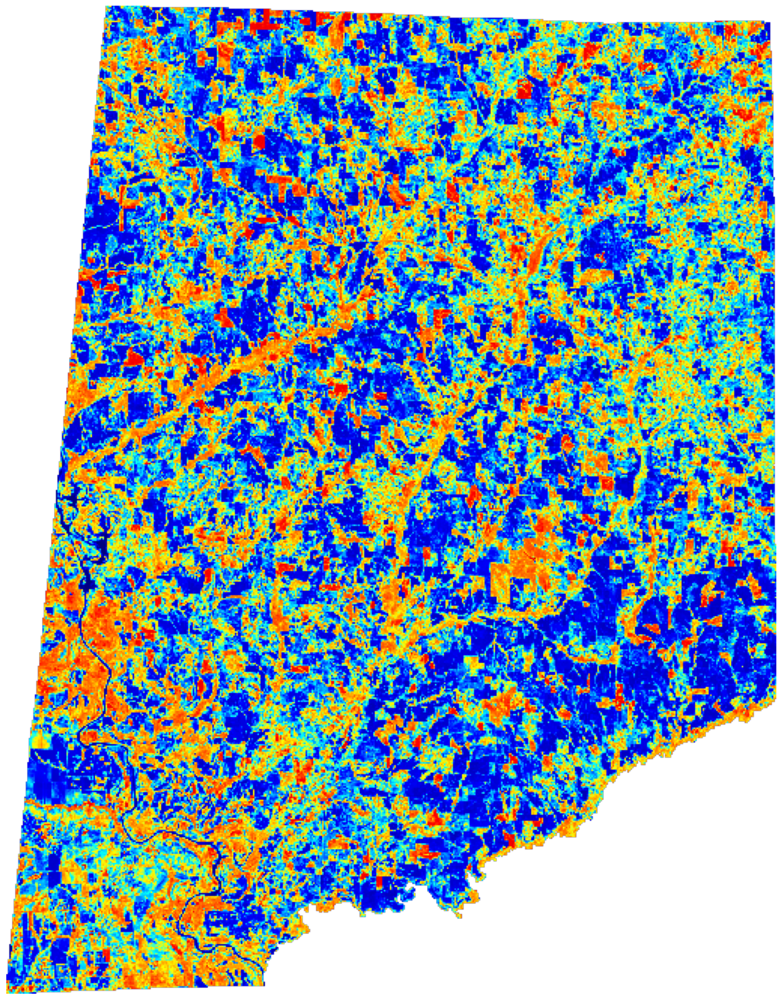

In [168]:
# read the image as numpy array
image_arr = np.array(Image.open(io.BytesIO(response.content)))

# plot the image for visualization
plt.figure(figsize=(16,16))
plt.axis('off')
plt.tight_layout()
plt.imshow(image_arr)

In [169]:
# vegetation index evalscript
evalscript = """
//VERSION=3

let viz = ColorMapVisualizer.createDefaultColorMap();

function evaluatePixel(samples) {
    let val = index(samples.B08, samples.B04);
    val = viz.process(val);
    val.push(samples.dataMask);
    return val;
}

function setup() {
  return {
    input: [{
      bands: [
        "B04",
        "B08",
        "dataMask"
      ]
    }],
    output: {
      bands: 4
    }
  }
}

"""

In [170]:
json_request = {
  "input": {
    "bounds": {
      "geometry": {
        "type": "Polygon",
        "coordinates": [
          [
            [
              -88.297059,
              33.349083
            ],
            [
              -88.296279,
              33.355508
            ],
            [
              -88.296245,
              33.355793
            ],
            [
              -88.295859,
              33.358945
            ],
            [
              -88.295836,
              33.359137
            ],
            [
              -88.294867,
              33.367103
            ],
            [
              -88.293953,
              33.375121
            ],
            [
              -88.293233,
              33.381083
            ],
            [
              -88.293217,
              33.381216
            ],
            [
              -88.293006,
              33.382962
            ],
            [
              -88.292573,
              33.386522
            ],
            [
              -88.292575,
              33.386537
            ],
            [
              -88.292202,
              33.389628
            ],
            [
              -88.292192,
              33.38971
            ],
            [
              -88.291063,
              33.399053
            ],
            [
              -88.291062,
              33.399065
            ],
            [
              -88.290796,
              33.401264
            ],
            [
              -88.290057,
              33.407386
            ],
            [
              -88.289705,
              33.410302
            ],
            [
              -88.289683,
              33.410484
            ],
            [
              -88.287695,
              33.42694
            ],
            [
              -88.286467,
              33.437116
            ],
            [
              -88.286239,
              33.439006
            ],
            [
              -88.285921,
              33.44164
            ],
            [
              -88.285602,
              33.44428
            ],
            [
              -88.285586,
              33.444411
            ],
            [
              -88.28485,
              33.450508
            ],
            [
              -88.283877,
              33.45857
            ],
            [
              -88.283369,
              33.462778
            ],
            [
              -88.283348,
              33.462949
            ],
            [
              -88.283184,
              33.464306
            ],
            [
              -88.283151,
              33.464582
            ],
            [
              -88.283126,
              33.46479
            ],
            [
              -88.282753,
              33.467874
            ],
            [
              -88.282441,
              33.470454
            ],
            [
              -88.282106,
              33.473236
            ],
            [
              -88.281851,
              33.475341
            ],
            [
              -88.281748,
              33.476197
            ],
            [
              -88.28165,
              33.47701
            ],
            [
              -88.281636,
              33.477122
            ],
            [
              -88.280789,
              33.484131
            ],
            [
              -88.280787,
              33.484153
            ],
            [
              -88.280076,
              33.490042
            ],
            [
              -88.280065,
              33.490136
            ],
            [
              -88.279585,
              33.494115
            ],
            [
              -88.279551,
              33.494397
            ],
            [
              -88.279128,
              33.497895
            ],
            [
              -88.27886,
              33.500117
            ],
            [
              -88.278765,
              33.5005
            ],
            [
              -88.278712,
              33.500714
            ],
            [
              -88.278267,
              33.50475
            ],
            [
              -88.277388,
              33.512479
            ],
            [
              -88.277367,
              33.512666
            ],
            [
              -88.277364,
              33.512696
            ],
            [
              -88.277227,
              33.51372
            ],
            [
              -88.277156,
              33.5142
            ],
            [
              -88.277001,
              33.515179
            ],
            [
              -88.276944,
              33.515616
            ],
            [
              -88.276802,
              33.516585
            ],
            [
              -88.275675,
              33.525532
            ],
            [
              -88.275646,
              33.525767
            ],
            [
              -88.274619,
              33.534008
            ],
            [
              -88.273833,
              33.533958
            ],
            [
              -88.271563,
              33.53392
            ],
            [
              -88.268316,
              33.533865
            ],
            [
              -88.258761,
              33.533704
            ],
            [
              -88.253182,
              33.533619
            ],
            [
              -88.25301,
              33.533613
            ],
            [
              -88.252996,
              33.533616
            ],
            [
              -88.250034,
              33.533558
            ],
            [
              -88.246291,
              33.533054
            ],
            [
              -88.23857,
              33.532994
            ],
            [
              -88.22858,
              33.532915
            ],
            [
              -88.218159,
              33.532832
            ],
            [
              -88.210862,
              33.532759
            ],
            [
              -88.206555,
              33.532739
            ],
            [
              -88.20648,
              33.532739
            ],
            [
              -88.20642,
              33.532739
            ],
            [
              -88.201368,
              33.53259
            ],
            [
              -88.17692,
              33.531867
            ],
            [
              -88.16504,
              33.531514
            ],
            [
              -88.161403,
              33.531405
            ],
            [
              -88.161223,
              33.531398
            ],
            [
              -88.161206,
              33.531397
            ],
            [
              -88.158264,
              33.531267
            ],
            [
              -88.147675,
              33.530969
            ],
            [
              -88.14476,
              33.530887
            ],
            [
              -88.144726,
              33.530886
            ],
            [
              -88.135555,
              33.530628
            ],
            [
              -88.130419,
              33.530434
            ],
            [
              -88.125028,
              33.530332
            ],
            [
              -88.124304,
              33.530234
            ],
            [
              -88.115109,
              33.529974
            ],
            [
              -88.095518,
              33.52942
            ],
            [
              -88.092284,
              33.529297
            ],
            [
              -88.085736,
              33.529072
            ],
            [
              -88.085583,
              33.529068
            ],
            [
              -88.083806,
              33.529004
            ],
            [
              -88.081787,
              33.528923
            ],
            [
              -88.081763,
              33.528922
            ],
            [
              -88.081266,
              33.528874
            ],
            [
              -88.076516,
              33.52866
            ],
            [
              -88.074973,
              33.528588
            ],
            [
              -88.070349,
              33.528371
            ],
            [
              -88.070195,
              33.528385
            ],
            [
              -88.069994,
              33.528365
            ],
            [
              -88.069933,
              33.528362
            ],
            [
              -88.069839,
              33.528357
            ],
            [
              -88.063939,
              33.528077
            ],
            [
              -88.063757,
              33.528067
            ],
            [
              -88.058724,
              33.527803
            ],
            [
              -88.058711,
              33.527802
            ],
            [
              -88.058075,
              33.527769
            ],
            [
              -88.05803,
              33.527766
            ],
            [
              -88.051595,
              33.52743
            ],
            [
              -88.050873,
              33.527467
            ],
            [
              -88.050575,
              33.527451
            ],
            [
              -88.048533,
              33.527344
            ],
            [
              -88.044343,
              33.527254
            ],
            [
              -88.04037,
              33.527168
            ],
            [
              -88.036644,
              33.527174
            ],
            [
              -88.03315,
              33.527126
            ],
            [
              -88.026464,
              33.527034
            ],
            [
              -88.026447,
              33.527034
            ],
            [
              -88.02445,
              33.527008
            ],
            [
              -88.023975,
              33.527002
            ],
            [
              -88.023911,
              33.527001
            ],
            [
              -88.023892,
              33.527
            ],
            [
              -88.023877,
              33.527
            ],
            [
              -88.023863,
              33.527
            ],
            [
              -88.01484,
              33.526764
            ],
            [
              -88.01004,
              33.52664
            ],
            [
              -88.010006,
              33.526639
            ],
            [
              -88.009872,
              33.526637
            ],
            [
              -88.007172,
              33.526567
            ],
            [
              -88.001548,
              33.526423
            ],
            [
              -88.001326,
              33.526417
            ],
            [
              -88.000022,
              33.52623
            ],
            [
              -87.996227,
              33.526069
            ],
            [
              -87.990435,
              33.525827
            ],
            [
              -87.990151,
              33.525814
            ],
            [
              -87.990133,
              33.525813
            ],
            [
              -87.978576,
              33.525329
            ],
            [
              -87.966146,
              33.524808
            ],
            [
              -87.946519,
              33.523987
            ],
            [
              -87.946519,
              33.524065
            ],
            [
              -87.937553,
              33.524181
            ],
            [
              -87.933144,
              33.524237
            ],
            [
              -87.932844,
              33.524242
            ],
            [
              -87.932801,
              33.524243
            ],
            [
              -87.921388,
              33.524389
            ],
            [
              -87.921368,
              33.524389
            ],
            [
              -87.909377,
              33.524546
            ],
            [
              -87.908804,
              33.524552
            ],
            [
              -87.900786,
              33.524658
            ],
            [
              -87.898831,
              33.524683
            ],
            [
              -87.898612,
              33.524686
            ],
            [
              -87.891365,
              33.52478
            ],
            [
              -87.885318,
              33.524859
            ],
            [
              -87.878684,
              33.524945
            ],
            [
              -87.875018,
              33.524993
            ],
            [
              -87.870726,
              33.525077
            ],
            [
              -87.866272,
              33.525181
            ],
            [
              -87.861862,
              33.525242
            ],
            [
              -87.860685,
              33.525259
            ],
            [
              -87.85856,
              33.525326
            ],
            [
              -87.854916,
              33.52523
            ],
            [
              -87.8503,
              33.525157
            ],
            [
              -87.845271,
              33.524985
            ],
            [
              -87.840683,
              33.524839
            ],
            [
              -87.840687,
              33.51756
            ],
            [
              -87.84071,
              33.514443
            ],
            [
              -87.840711,
              33.514288
            ],
            [
              -87.840657,
              33.511539
            ],
            [
              -87.840429,
              33.507382
            ],
            [
              -87.840282,
              33.505108
            ],
            [
              -87.840192,
              33.503391
            ],
            [
              -87.83999,
              33.500855
            ],
            [
              -87.839879,
              33.500114
            ],
            [
              -87.839789,
              33.499553
            ],
            [
              -87.839766,
              33.499406
            ],
            [
              -87.839695,
              33.496114
            ],
            [
              -87.839691,
              33.495877
            ],
            [
              -87.839639,
              33.4916
            ],
            [
              -87.839583,
              33.488805
            ],
            [
              -87.839387,
              33.47732
            ],
            [
              -87.839139,
              33.462799
            ],
            [
              -87.839137,
              33.462659
            ],
            [
              -87.839137,
              33.462643
            ],
            [
              -87.839028,
              33.456282
            ],
            [
              -87.838784,
              33.442002
            ],
            [
              -87.838475,
              33.438744
            ],
            [
              -87.838607,
              33.437831
            ],
            [
              -87.838835,
              33.436264
            ],
            [
              -87.838608,
              33.431877
            ],
            [
              -87.838605,
              33.431783
            ],
            [
              -87.838605,
              33.431767
            ],
            [
              -87.838605,
              33.431738
            ],
            [
              -87.838604,
              33.431691
            ],
            [
              -87.838604,
              33.431671
            ],
            [
              -87.838487,
              33.424706
            ],
            [
              -87.838356,
              33.414009
            ],
            [
              -87.838228,
              33.409267
            ],
            [
              -87.838406,
              33.391883
            ],
            [
              -87.83844,
              33.388531
            ],
            [
              -87.838191,
              33.377439
            ],
            [
              -87.838179,
              33.375116
            ],
            [
              -87.838209,
              33.370336
            ],
            [
              -87.838234,
              33.364748
            ],
            [
              -87.838264,
              33.361238
            ],
            [
              -87.838279,
              33.359505
            ],
            [
              -87.838406,
              33.346915
            ],
            [
              -87.838463,
              33.341383
            ],
            [
              -87.838426,
              33.336799
            ],
            [
              -87.838377,
              33.330767
            ],
            [
              -87.838359,
              33.328362
            ],
            [
              -87.838175,
              33.323406
            ],
            [
              -87.8381,
              33.321382
            ],
            [
              -87.838105,
              33.32115
            ],
            [
              -87.838106,
              33.321123
            ],
            [
              -87.838181,
              33.318164
            ],
            [
              -87.838159,
              33.314771
            ],
            [
              -87.838048,
              33.297373
            ],
            [
              -87.838035,
              33.295364
            ],
            [
              -87.838027,
              33.294091
            ],
            [
              -87.838021,
              33.292994
            ],
            [
              -87.838442,
              33.284309
            ],
            [
              -87.838447,
              33.284193
            ],
            [
              -87.838572,
              33.281621
            ],
            [
              -87.838572,
              33.281604
            ],
            [
              -87.838571,
              33.281568
            ],
            [
              -87.838547,
              33.280656
            ],
            [
              -87.838489,
              33.278454
            ],
            [
              -87.838482,
              33.278207
            ],
            [
              -87.838298,
              33.271236
            ],
            [
              -87.837982,
              33.25916
            ],
            [
              -87.838091,
              33.258862
            ],
            [
              -87.838036,
              33.256822
            ],
            [
              -87.838254,
              33.256044
            ],
            [
              -87.838279,
              33.2539
            ],
            [
              -87.838281,
              33.253822
            ],
            [
              -87.838243,
              33.250118
            ],
            [
              -87.837895,
              33.248925
            ],
            [
              -87.837893,
              33.24888
            ],
            [
              -87.837892,
              33.248857
            ],
            [
              -87.837729,
              33.243294
            ],
            [
              -87.837598,
              33.238838
            ],
            [
              -87.837384,
              33.231564
            ],
            [
              -87.837208,
              33.225544
            ],
            [
              -87.836955,
              33.21689
            ],
            [
              -87.836954,
              33.216828
            ],
            [
              -87.836893,
              33.211696
            ],
            [
              -87.83674,
              33.200966
            ],
            [
              -87.836726,
              33.199527
            ],
            [
              -87.836715,
              33.198459
            ],
            [
              -87.836695,
              33.196438
            ],
            [
              -87.836693,
              33.196243
            ],
            [
              -87.836628,
              33.189604
            ],
            [
              -87.836596,
              33.186317
            ],
            [
              -87.836631,
              33.184899
            ],
            [
              -87.836661,
              33.183664
            ],
            [
              -87.836803,
              33.177959
            ],
            [
              -87.83707,
              33.167203
            ],
            [
              -87.837071,
              33.167173
            ],
            [
              -87.837325,
              33.159529
            ],
            [
              -87.837521,
              33.153637
            ],
            [
              -87.837842,
              33.153657
            ],
            [
              -87.83825,
              33.15345
            ],
            [
              -87.838359,
              33.152535
            ],
            [
              -87.838522,
              33.152192
            ],
            [
              -87.83874,
              33.152054
            ],
            [
              -87.839666,
              33.152146
            ],
            [
              -87.839857,
              33.151871
            ],
            [
              -87.839884,
              33.151206
            ],
            [
              -87.839639,
              33.150495
            ],
            [
              -87.839638,
              33.150199
            ],
            [
              -87.839938,
              33.150084
            ],
            [
              -87.840728,
              33.150404
            ],
            [
              -87.8413,
              33.150793
            ],
            [
              -87.841654,
              33.150908
            ],
            [
              -87.841926,
              33.150817
            ],
            [
              -87.841981,
              33.150702
            ],
            [
              -87.84209,
              33.150335
            ],
            [
              -87.842661,
              33.149213
            ],
            [
              -87.843097,
              33.148983
            ],
            [
              -87.843833,
              33.148868
            ],
            [
              -87.844623,
              33.148983
            ],
            [
              -87.845358,
              33.148615
            ],
            [
              -87.84563,
              33.148341
            ],
            [
              -87.845875,
              33.147768
            ],
            [
              -87.846011,
              33.147677
            ],
            [
              -87.846338,
              33.147654
            ],
            [
              -87.846855,
              33.147745
            ],
            [
              -87.847182,
              33.147516
            ],
            [
              -87.847291,
              33.147309
            ],
            [
              -87.847645,
              33.147149
            ],
            [
              -87.848571,
              33.147056
            ],
            [
              -87.849007,
              33.146943
            ],
            [
              -87.850259,
              33.147033
            ],
            [
              -87.850586,
              33.146897
            ],
            [
              -87.851675,
              33.146759
            ],
            [
              -87.852084,
              33.146507
            ],
            [
              -87.852329,
              33.146071
            ],
            [
              -87.852328,
              33.145728
            ],
            [
              -87.852247,
              33.145521
            ],
            [
              -87.851892,
              33.145108
            ],
            [
              -87.851892,
              33.144123
            ],
            [
              -87.852001,
              33.143918
            ],
            [
              -87.852219,
              33.143757
            ],
            [
              -87.852845,
              33.14362
            ],
            [
              -87.853853,
              33.143963
            ],
            [
              -87.853989,
              33.143711
            ],
            [
              -87.85377,
              33.142909
            ],
            [
              -87.853797,
              33.142428
            ],
            [
              -87.854369,
              33.141947
            ],
            [
              -87.85494,
              33.14119
            ],
            [
              -87.856057,
              33.140824
            ],
            [
              -87.85641,
              33.140182
            ],
            [
              -87.85671,
              33.140158
            ],
            [
              -87.856846,
              33.140273
            ],
            [
              -87.857064,
              33.140709
            ],
            [
              -87.857391,
              33.14096
            ],
            [
              -87.858426,
              33.141303
            ],
            [
              -87.858753,
              33.141601
            ],
            [
              -87.859162,
              33.141692
            ],
            [
              -87.859515,
              33.141166
            ],
            [
              -87.859951,
              33.141143
            ],
            [
              -87.860251,
              33.141349
            ],
            [
              -87.860251,
              33.141692
            ],
            [
              -87.859951,
              33.142105
            ],
            [
              -87.859897,
              33.142494
            ],
            [
              -87.860033,
              33.142654
            ],
            [
              -87.861068,
              33.142906
            ],
            [
              -87.861177,
              33.143067
            ],
            [
              -87.861178,
              33.143388
            ],
            [
              -87.86096,
              33.143639
            ],
            [
              -87.860878,
              33.143938
            ],
            [
              -87.861042,
              33.144098
            ],
            [
              -87.861641,
              33.144098
            ],
            [
              -87.86224,
              33.143662
            ],
            [
              -87.862784,
              33.143662
            ],
            [
              -87.863247,
              33.143569
            ],
            [
              -87.863764,
              33.143065
            ],
            [
              -87.864146,
              33.143065
            ],
            [
              -87.864391,
              33.143363
            ],
            [
              -87.864827,
              33.143431
            ],
            [
              -87.86499,
              33.14311
            ],
            [
              -87.864989,
              33.141759
            ],
            [
              -87.86567,
              33.141713
            ],
            [
              -87.865915,
              33.141553
            ],
            [
              -87.865942,
              33.141049
            ],
            [
              -87.867493,
              33.140292
            ],
            [
              -87.868283,
              33.140292
            ],
            [
              -87.869018,
              33.14052
            ],
            [
              -87.869699,
              33.140909
            ],
            [
              -87.869945,
              33.140909
            ],
            [
              -87.869917,
              33.140039
            ],
            [
              -87.870189,
              33.139695
            ],
            [
              -87.870733,
              33.139603
            ],
            [
              -87.871087,
              33.139809
            ],
            [
              -87.871415,
              33.140267
            ],
            [
              -87.871905,
              33.140335
            ],
            [
              -87.871931,
              33.139418
            ],
            [
              -87.872013,
              33.139305
            ],
            [
              -87.87362,
              33.139006
            ],
            [
              -87.874356,
              33.139304
            ],
            [
              -87.874558,
              33.139304
            ],
            [
              -87.874626,
              33.139212
            ],
            [
              -87.874626,
              33.138502
            ],
            [
              -87.875016,
              33.138342
            ],
            [
              -87.875595,
              33.138457
            ],
            [
              -87.875812,
              33.138641
            ],
            [
              -87.876003,
              33.139076
            ],
            [
              -87.87622,
              33.139237
            ],
            [
              -87.876602,
              33.13926
            ],
            [
              -87.876792,
              33.13919
            ],
            [
              -87.877855,
              33.13729
            ],
            [
              -87.878237,
              33.137107
            ],
            [
              -87.878863,
              33.136969
            ],
            [
              -87.879544,
              33.137222
            ],
            [
              -87.879898,
              33.137175
            ],
            [
              -87.880116,
              33.136924
            ],
            [
              -87.880171,
              33.13626
            ],
            [
              -87.881178,
              33.135688
            ],
            [
              -87.881995,
              33.135551
            ],
            [
              -87.88224,
              33.135734
            ],
            [
              -87.883003,
              33.135666
            ],
            [
              -87.883656,
              33.135849
            ],
            [
              -87.883901,
              33.135711
            ],
            [
              -87.88401,
              33.135506
            ],
            [
              -87.883929,
              33.135047
            ],
            [
              -87.883385,
              33.134406
            ],
            [
              -87.883167,
              33.134314
            ],
            [
              -87.883113,
              33.133626
            ],
            [
              -87.883358,
              33.133192
            ],
            [
              -87.883985,
              33.132711
            ],
            [
              -87.884747,
              33.132688
            ],
            [
              -87.884856,
              33.13262
            ],
            [
              -87.884802,
              33.132047
            ],
            [
              -87.885102,
              33.131794
            ],
            [
              -87.885592,
              33.131771
            ],
            [
              -87.886136,
              33.131956
            ],
            [
              -87.886463,
              33.131979
            ],
            [
              -87.886627,
              33.131818
            ],
            [
              -87.886926,
              33.131704
            ],
            [
              -87.887062,
              33.131796
            ],
            [
              -87.887225,
              33.132139
            ],
            [
              -87.88777,
              33.132047
            ],
            [
              -87.887988,
              33.132392
            ],
            [
              -87.888587,
              33.132506
            ],
            [
              -87.888886,
              33.132323
            ],
            [
              -87.888914,
              33.131566
            ],
            [
              -87.889377,
              33.130789
            ],
            [
              -87.890058,
              33.129964
            ],
            [
              -87.890194,
              33.129964
            ],
            [
              -87.890276,
              33.129827
            ],
            [
              -87.89112,
              33.129644
            ],
            [
              -87.891556,
              33.129713
            ],
            [
              -87.892182,
              33.129942
            ],
            [
              -87.8924,
              33.130125
            ],
            [
              -87.892427,
              33.130491
            ],
            [
              -87.891555,
              33.130536
            ],
            [
              -87.891201,
              33.130698
            ],
            [
              -87.890902,
              33.131064
            ],
            [
              -87.890956,
              33.131338
            ],
            [
              -87.891174,
              33.131453
            ],
            [
              -87.891609,
              33.131476
            ],
            [
              -87.892372,
              33.131271
            ],
            [
              -87.89259,
              33.131019
            ],
            [
              -87.892808,
              33.130881
            ],
            [
              -87.892808,
              33.130721
            ],
            [
              -87.89357,
              33.130629
            ],
            [
              -87.893706,
              33.130538
            ],
            [
              -87.893979,
              33.130515
            ],
            [
              -87.894877,
              33.130035
            ],
            [
              -87.895368,
              33.129942
            ],
            [
              -87.896702,
              33.129966
            ],
            [
              -87.89711,
              33.129897
            ],
            [
              -87.897655,
              33.129554
            ],
            [
              -87.897737,
              33.129257
            ],
            [
              -87.898036,
              33.128959
            ],
            [
              -87.898445,
              33.128959
            ],
            [
              -87.898771,
              33.128844
            ],
            [
              -87.898853,
              33.128638
            ],
            [
              -87.899153,
              33.128386
            ],
            [
              -87.899534,
              33.128295
            ],
            [
              -87.900106,
              33.128386
            ],
            [
              -87.900705,
              33.128089
            ],
            [
              -87.901222,
              33.127952
            ],
            [
              -87.901658,
              33.128158
            ],
            [
              -87.902202,
              33.128203
            ],
            [
              -87.902447,
              33.128135
            ],
            [
              -87.902393,
              33.127929
            ],
            [
              -87.902366,
              33.127563
            ],
            [
              -87.902121,
              33.127356
            ],
            [
              -87.902094,
              33.126944
            ],
            [
              -87.902312,
              33.126738
            ],
            [
              -87.903047,
              33.126807
            ],
            [
              -87.903319,
              33.126897
            ],
            [
              -87.903674,
              33.12683
            ],
            [
              -87.903892,
              33.126418
            ],
            [
              -87.903755,
              33.12621
            ],
            [
              -87.903319,
              33.125936
            ],
            [
              -87.903374,
              33.125492
            ],
            [
              -87.903798,
              33.125121
            ],
            [
              -87.905311,
              33.124671
            ],
            [
              -87.90561,
              33.124423
            ],
            [
              -87.905638,
              33.123987
            ],
            [
              -87.905529,
              33.123736
            ],
            [
              -87.905257,
              33.123551
            ],
            [
              -87.904821,
              33.12346
            ],
            [
              -87.904767,
              33.12314
            ],
            [
              -87.905012,
              33.122842
            ],
            [
              -87.905393,
              33.122659
            ],
            [
              -87.905774,
              33.122636
            ],
            [
              -87.90621,
              33.122751
            ],
            [
              -87.906618,
              33.122751
            ],
            [
              -87.906754,
              33.122613
            ],
            [
              -87.906754,
              33.122383
            ],
            [
              -87.906673,
              33.122293
            ],
            [
              -87.905965,
              33.12204
            ],
            [
              -87.905911,
              33.121581
            ],
            [
              -87.906028,
              33.121457
            ],
            [
              -87.906128,
              33.121353
            ],
            [
              -87.906918,
              33.121101
            ],
            [
              -87.907953,
              33.121124
            ],
            [
              -87.908742,
              33.121285
            ],
            [
              -87.908933,
              33.1214
            ],
            [
              -87.909069,
              33.121674
            ],
            [
              -87.909041,
              33.121995
            ],
            [
              -87.908742,
              33.122453
            ],
            [
              -87.908578,
              33.122889
            ],
            [
              -87.908687,
              33.123278
            ],
            [
              -87.909068,
              33.12353
            ],
            [
              -87.909531,
              33.123691
            ],
            [
              -87.910184,
              33.123668
            ],
            [
              -87.91062,
              33.12337
            ],
            [
              -87.910756,
              33.123072
            ],
            [
              -87.910811,
              33.122521
            ],
            [
              -87.910675,
              33.12211
            ],
            [
              -87.910675,
              33.121651
            ],
            [
              -87.910947,
              33.121536
            ],
            [
              -87.911655,
              33.12156
            ],
            [
              -87.911982,
              33.121721
            ],
            [
              -87.912444,
              33.12211
            ],
            [
              -87.912499,
              33.122408
            ],
            [
              -87.912172,
              33.122866
            ],
            [
              -87.91209,
              33.123347
            ],
            [
              -87.912172,
              33.123531
            ],
            [
              -87.912471,
              33.123621
            ],
            [
              -87.91307,
              33.123531
            ],
            [
              -87.913778,
              33.123187
            ],
            [
              -87.914894,
              33.123027
            ],
            [
              -87.915385,
              33.12289
            ],
            [
              -87.915793,
              33.1225
            ],
            [
              -87.915984,
              33.121927
            ],
            [
              -87.91631,
              33.121767
            ],
            [
              -87.9168,
              33.121699
            ],
            [
              -87.917781,
              33.12147
            ],
            [
              -87.917971,
              33.121285
            ],
            [
              -87.917971,
              33.120621
            ],
            [
              -87.918162,
              33.12037
            ],
            [
              -87.918434,
              33.120323
            ],
            [
              -87.918979,
              33.121012
            ],
            [
              -87.919441,
              33.121057
            ],
            [
              -87.919659,
              33.120874
            ],
            [
              -87.919686,
              33.120645
            ],
            [
              -87.919986,
              33.120508
            ],
            [
              -87.920204,
              33.120668
            ],
            [
              -87.92034,
              33.120989
            ],
            [
              -87.920694,
              33.121125
            ],
            [
              -87.920939,
              33.121125
            ],
            [
              -87.921184,
              33.120966
            ],
            [
              -87.921293,
              33.120691
            ],
            [
              -87.921347,
              33.120095
            ],
            [
              -87.921592,
              33.1195
            ],
            [
              -87.921892,
              33.119225
            ],
            [
              -87.922926,
              33.118767
            ],
            [
              -87.922954,
              33.118468
            ],
            [
              -87.9226,
              33.117987
            ],
            [
              -87.922518,
              33.117644
            ],
            [
              -87.922627,
              33.117324
            ],
            [
              -87.922818,
              33.117162
            ],
            [
              -87.923417,
              33.117049
            ],
            [
              -87.924016,
              33.117255
            ],
            [
              -87.924261,
              33.117507
            ],
            [
              -87.92426,
              33.118767
            ],
            [
              -87.92407,
              33.11934
            ],
            [
              -87.923607,
              33.120027
            ],
            [
              -87.923688,
              33.120302
            ],
            [
              -87.923906,
              33.120417
            ],
            [
              -87.924178,
              33.120393
            ],
            [
              -87.924968,
              33.119752
            ],
            [
              -87.92524,
              33.119317
            ],
            [
              -87.925295,
              33.118698
            ],
            [
              -87.925404,
              33.118606
            ],
            [
              -87.925758,
              33.118584
            ],
            [
              -87.925921,
              33.118698
            ],
            [
              -87.926356,
              33.119774
            ],
            [
              -87.926329,
              33.1206
            ],
            [
              -87.926248,
              33.120714
            ],
            [
              -87.926275,
              33.121195
            ],
            [
              -87.926411,
              33.121333
            ],
            [
              -87.926683,
              33.121402
            ],
            [
              -87.927146,
              33.121104
            ],
            [
              -87.927364,
              33.120623
            ],
            [
              -87.927473,
              33.119912
            ],
            [
              -87.928072,
              33.118011
            ],
            [
              -87.928507,
              33.11737
            ],
            [
              -87.928671,
              33.116683
            ],
            [
              -87.929052,
              33.116498
            ],
            [
              -87.929923,
              33.116408
            ],
            [
              -87.930413,
              33.116545
            ],
            [
              -87.930985,
              33.116293
            ],
            [
              -87.930767,
              33.115743
            ],
            [
              -87.930849,
              33.115537
            ],
            [
              -87.931529,
              33.11517
            ],
            [
              -87.931801,
              33.114415
            ],
            [
              -87.932319,
              33.114277
            ],
            [
              -87.932618,
              33.114071
            ],
            [
              -87.932645,
              33.113864
            ],
            [
              -87.932945,
              33.11359
            ],
            [
              -87.932972,
              33.113475
            ],
            [
              -87.933353,
              33.113177
            ],
            [
              -87.93368,
              33.1132
            ],
            [
              -87.933898,
              33.113338
            ],
            [
              -87.934006,
              33.113613
            ],
            [
              -87.933979,
              33.114277
            ],
            [
              -87.933843,
              33.114644
            ],
            [
              -87.933544,
              33.115125
            ],
            [
              -87.933516,
              33.11533
            ],
            [
              -87.933653,
              33.11556
            ],
            [
              -87.934088,
              33.11556
            ],
            [
              -87.934579,
              33.1154
            ],
            [
              -87.934906,
              33.115125
            ],
            [
              -87.935015,
              33.114827
            ],
            [
              -87.93496,
              33.114666
            ],
            [
              -87.935178,
              33.113979
            ],
            [
              -87.935532,
              33.11375
            ],
            [
              -87.937029,
              33.113428
            ],
            [
              -87.937982,
              33.113338
            ],
            [
              -87.938118,
              33.113452
            ],
            [
              -87.938145,
              33.11375
            ],
            [
              -87.937927,
              33.114207
            ],
            [
              -87.937955,
              33.114575
            ],
            [
              -87.938091,
              33.114666
            ],
            [
              -87.938309,
              33.114666
            ],
            [
              -87.938799,
              33.114002
            ],
            [
              -87.939506,
              33.113269
            ],
            [
              -87.939534,
              33.112857
            ],
            [
              -87.939425,
              33.112605
            ],
            [
              -87.939452,
              33.112146
            ],
            [
              -87.939806,
              33.111345
            ],
            [
              -87.940323,
              33.111322
            ],
            [
              -87.940541,
              33.111505
            ],
            [
              -87.940731,
              33.112032
            ],
            [
              -87.940895,
              33.112192
            ],
            [
              -87.941194,
              33.11226
            ],
            [
              -87.941602,
              33.112169
            ],
            [
              -87.942228,
              33.111871
            ],
            [
              -87.942528,
              33.111482
            ],
            [
              -87.942555,
              33.11123
            ],
            [
              -87.942392,
              33.111069
            ],
            [
              -87.941602,
              33.110954
            ],
            [
              -87.941167,
              33.110588
            ],
            [
              -87.940976,
              33.109993
            ],
            [
              -87.941112,
              33.109741
            ],
            [
              -87.941575,
              33.109443
            ],
            [
              -87.942038,
              33.10935
            ],
            [
              -87.942092,
              33.109603
            ],
            [
              -87.942446,
              33.109947
            ],
            [
              -87.942745,
              33.110016
            ],
            [
              -87.943344,
              33.109718
            ],
            [
              -87.943589,
              33.109327
            ],
            [
              -87.943589,
              33.108916
            ],
            [
              -87.942636,
              33.108595
            ],
            [
              -87.942772,
              33.107839
            ],
            [
              -87.943099,
              33.107633
            ],
            [
              -87.943616,
              33.10761
            ],
            [
              -87.944052,
              33.107839
            ],
            [
              -87.944106,
              33.108342
            ],
            [
              -87.944188,
              33.108412
            ],
            [
              -87.944079,
              33.108916
            ],
            [
              -87.944406,
              33.108893
            ],
            [
              -87.94476,
              33.108893
            ],
            [
              -87.94574,
              33.108342
            ],
            [
              -87.946366,
              33.10832
            ],
            [
              -87.94691,
              33.108137
            ],
            [
              -87.946937,
              33.107747
            ],
            [
              -87.94691,
              33.107472
            ],
            [
              -87.947073,
              33.107014
            ],
            [
              -87.947481,
              33.106212
            ],
            [
              -87.947726,
              33.106166
            ],
            [
              -87.948216,
              33.105731
            ],
            [
              -87.948488,
              33.105364
            ],
            [
              -87.949169,
              33.104768
            ],
            [
              -87.949414,
              33.104677
            ],
            [
              -87.949414,
              33.104517
            ],
            [
              -87.949795,
              33.104149
            ],
            [
              -87.94998,
              33.103915
            ],
            [
              -87.950121,
              33.103738
            ],
            [
              -87.950339,
              33.103439
            ],
            [
              -87.950405,
              33.1032
            ],
            [
              -87.950502,
              33.102843
            ],
            [
              -87.950584,
              33.102224
            ],
            [
              -87.950447,
              33.10078
            ],
            [
              -87.950257,
              33.100301
            ],
            [
              -87.950229,
              33.099614
            ],
            [
              -87.950637,
              33.098377
            ],
            [
              -87.950855,
              33.097987
            ],
            [
              -87.9511,
              33.09778
            ],
            [
              -87.951808,
              33.097529
            ],
            [
              -87.95227,
              33.097139
            ],
            [
              -87.952978,
              33.096359
            ],
            [
              -87.953223,
              33.095833
            ],
            [
              -87.953222,
              33.095191
            ],
            [
              -87.954147,
              33.093747
            ],
            [
              -87.954229,
              33.09313
            ],
            [
              -87.954229,
              33.092627
            ],
            [
              -87.95431,
              33.092581
            ],
            [
              -87.954337,
              33.091549
            ],
            [
              -87.954473,
              33.09116
            ],
            [
              -87.954882,
              33.090885
            ],
            [
              -87.955453,
              33.09084
            ],
            [
              -87.955834,
              33.091023
            ],
            [
              -87.956624,
              33.09171
            ],
            [
              -87.957168,
              33.09187
            ],
            [
              -87.95744,
              33.091687
            ],
            [
              -87.95744,
              33.091023
            ],
            [
              -87.957086,
              33.090358
            ],
            [
              -87.957167,
              33.09006
            ],
            [
              -87.957331,
              33.089877
            ],
            [
              -87.958365,
              33.089212
            ],
            [
              -87.958392,
              33.088869
            ],
            [
              -87.958201,
              33.088707
            ],
            [
              -87.957984,
              33.088662
            ],
            [
              -87.957602,
              33.088273
            ],
            [
              -87.957493,
              33.087884
            ],
            [
              -87.957493,
              33.087218
            ],
            [
              -87.957575,
              33.087035
            ],
            [
              -87.95782,
              33.08683
            ],
            [
              -87.957983,
              33.086807
            ],
            [
              -87.958391,
              33.086807
            ],
            [
              -87.959181,
              33.087494
            ],
            [
              -87.960487,
              33.088181
            ],
            [
              -87.961086,
              33.088112
            ],
            [
              -87.961358,
              33.087905
            ],
            [
              -87.962038,
              33.086944
            ],
            [
              -87.962119,
              33.086531
            ],
            [
              -87.962419,
              33.086073
            ],
            [
              -87.962636,
              33.085912
            ],
            [
              -87.962909,
              33.086027
            ],
            [
              -87.962909,
              33.086577
            ],
            [
              -87.963208,
              33.086989
            ],
            [
              -87.96348,
              33.08708
            ],
            [
              -87.96378,
              33.086875
            ],
            [
              -87.963807,
              33.08614
            ],
            [
              -87.963453,
              33.085659
            ],
            [
              -87.963453,
              33.085385
            ],
            [
              -87.964378,
              33.085293
            ],
            [
              -87.964732,
              33.085133
            ],
            [
              -87.964949,
              33.084881
            ],
            [
              -87.964976,
              33.084308
            ],
            [
              -87.965139,
              33.084102
            ],
            [
              -87.96552,
              33.084032
            ],
            [
              -87.966146,
              33.084423
            ],
            [
              -87.966555,
              33.0844
            ],
            [
              -87.966963,
              33.084102
            ],
            [
              -87.96718,
              33.083804
            ],
            [
              -87.967207,
              33.083437
            ],
            [
              -87.966744,
              33.082865
            ],
            [
              -87.9662,
              33.082566
            ],
            [
              -87.966173,
              33.082268
            ],
            [
              -87.966254,
              33.082062
            ],
            [
              -87.966581,
              33.081902
            ],
            [
              -87.967533,
              33.081856
            ],
            [
              -87.968023,
              33.081742
            ],
            [
              -87.968241,
              33.081604
            ],
            [
              -87.968241,
              33.081443
            ],
            [
              -87.968132,
              33.081328
            ],
            [
              -87.967669,
              33.081145
            ],
            [
              -87.967451,
              33.080962
            ],
            [
              -87.967478,
              33.080619
            ],
            [
              -87.968322,
              33.080458
            ],
            [
              -87.968485,
              33.079932
            ],
            [
              -87.967777,
              33.079451
            ],
            [
              -87.967723,
              33.079107
            ],
            [
              -87.967804,
              33.078924
            ],
            [
              -87.968321,
              33.078809
            ],
            [
              -87.968457,
              33.078924
            ],
            [
              -87.96873,
              33.079152
            ],
            [
              -87.969247,
              33.079244
            ],
            [
              -87.969491,
              33.079015
            ],
            [
              -87.969546,
              33.07874
            ],
            [
              -87.969165,
              33.078442
            ],
            [
              -87.968348,
              33.078235
            ],
            [
              -87.968267,
              33.078167
            ],
            [
              -87.968403,
              33.077847
            ],
            [
              -87.968838,
              33.077641
            ],
            [
              -87.969709,
              33.077572
            ],
            [
              -87.971151,
              33.078007
            ],
            [
              -87.971722,
              33.078006
            ],
            [
              -87.972185,
              33.077869
            ],
            [
              -87.974281,
              33.077868
            ],
            [
              -87.97439,
              33.078006
            ],
            [
              -87.975397,
              33.078325
            ],
            [
              -87.975996,
              33.078165
            ],
            [
              -87.976839,
              33.077753
            ],
            [
              -87.977574,
              33.077753
            ],
            [
              -87.977819,
              33.077844
            ],
            [
              -87.978254,
              33.07837
            ],
            [
              -87.978064,
              33.079493
            ],
            [
              -87.9782,
              33.079631
            ],
            [
              -87.979343,
              33.079814
            ],
            [
              -87.979779,
              33.080043
            ],
            [
              -87.980704,
              33.080982
            ],
            [
              -87.98114,
              33.080913
            ],
            [
              -87.981493,
              33.080615
            ],
            [
              -87.981548,
              33.080019
            ],
            [
              -87.981357,
              33.079469
            ],
            [
              -87.981275,
              33.079424
            ],
            [
              -87.98103,
              33.078598
            ],
            [
              -87.981084,
              33.078209
            ],
            [
              -87.981247,
              33.078094
            ],
            [
              -87.981791,
              33.077934
            ],
            [
              -87.98288,
              33.077888
            ],
            [
              -87.983206,
              33.078094
            ],
            [
              -87.983207,
              33.07885
            ],
            [
              -87.98337,
              33.078919
            ],
            [
              -87.983778,
              33.078919
            ],
            [
              -87.984159,
              33.078643
            ],
            [
              -87.984349,
              33.078392
            ],
            [
              -87.984431,
              33.078024
            ],
            [
              -87.984403,
              33.077818
            ],
            [
              -87.983804,
              33.077132
            ],
            [
              -87.983831,
              33.076765
            ],
            [
              -87.984294,
              33.076673
            ],
            [
              -87.984838,
              33.076994
            ],
            [
              -87.985274,
              33.077565
            ],
            [
              -87.98522,
              33.078162
            ],
            [
              -87.985411,
              33.078391
            ],
            [
              -87.985683,
              33.078367
            ],
            [
              -87.985982,
              33.078207
            ],
            [
              -87.986934,
              33.077129
            ],
            [
              -87.98726,
              33.07697
            ],
            [
              -87.987233,
              33.07681
            ],
            [
              -87.987613,
              33.076121
            ],
            [
              -87.98881,
              33.075572
            ],
            [
              -87.989028,
              33.075297
            ],
            [
              -87.989,
              33.074999
            ],
            [
              -87.988755,
              33.074816
            ],
            [
              -87.988701,
              33.074633
            ],
            [
              -87.989435,
              33.074449
            ],
            [
              -87.989735,
              33.074266
            ],
            [
              -87.989898,
              33.073922
            ],
            [
              -87.989544,
              33.073394
            ],
            [
              -87.989516,
              33.073143
            ],
            [
              -87.990006,
              33.072868
            ],
            [
              -87.990822,
              33.072799
            ],
            [
              -87.99104,
              33.072845
            ],
            [
              -87.991475,
              33.073165
            ],
            [
              -87.991775,
              33.073211
            ],
            [
              -87.992183,
              33.073096
            ],
            [
              -87.992264,
              33.073003
            ],
            [
              -87.993026,
              33.07282
            ],
            [
              -87.993516,
              33.073186
            ],
            [
              -87.993788,
              33.073301
            ],
            [
              -87.994768,
              33.073141
            ],
            [
              -87.995339,
              33.073438
            ],
            [
              -87.996183,
              33.073461
            ],
            [
              -87.996591,
              33.0733
            ],
            [
              -87.996591,
              33.073002
            ],
            [
              -87.996373,
              33.072772
            ],
            [
              -87.996291,
              33.072498
            ],
            [
              -87.996345,
              33.072269
            ],
            [
              -87.996318,
              33.071925
            ],
            [
              -87.996127,
              33.071697
            ],
            [
              -87.996127,
              33.071353
            ],
            [
              -87.996562,
              33.071101
            ],
            [
              -87.997269,
              33.071008
            ],
            [
              -87.998113,
              33.071421
            ],
            [
              -87.998494,
              33.071466
            ],
            [
              -87.998793,
              33.071329
            ],
            [
              -87.999564,
              33.070549
            ],
            [
              -88.000019,
              33.070503
            ],
            [
              -88.00014,
              33.070667
            ],
            [
              -88.000366,
              33.070711
            ],
            [
              -88.000393,
              33.070872
            ],
            [
              -88.000434,
              33.070963
            ],
            [
              -88.000449,
              33.071084
            ],
            [
              -88.000483,
              33.071357
            ],
            [
              -88.000549,
              33.071883
            ],
            [
              -88.000592,
              33.072224
            ],
            [
              -88.000836,
              33.072398
            ],
            [
              -88.001136,
              33.072612
            ],
            [
              -88.001517,
              33.072727
            ],
            [
              -88.002523,
              33.072682
            ],
            [
              -88.002577,
              33.072646
            ],
            [
              -88.002823,
              33.072477
            ],
            [
              -88.00285,
              33.072362
            ],
            [
              -88.002905,
              33.072316
            ],
            [
              -88.002959,
              33.071789
            ],
            [
              -88.003205,
              33.071606
            ],
            [
              -88.003532,
              33.071697
            ],
            [
              -88.003994,
              33.072201
            ],
            [
              -88.004347,
              33.072684
            ],
            [
              -88.004347,
              33.072842
            ],
            [
              -88.004347,
              33.073003
            ],
            [
              -88.003912,
              33.073348
            ],
            [
              -88.003912,
              33.073577
            ],
            [
              -88.004075,
              33.073645
            ],
            [
              -88.004736,
              33.073475
            ],
            [
              -88.004782,
              33.073462
            ],
            [
              -88.00481,
              33.073324
            ],
            [
              -88.005066,
              33.072977
            ],
            [
              -88.005164,
              33.072844
            ],
            [
              -88.005599,
              33.072203
            ],
            [
              -88.005683,
              33.072108
            ],
            [
              -88.005844,
              33.071928
            ],
            [
              -88.006035,
              33.071814
            ],
            [
              -88.006293,
              33.071759
            ],
            [
              -88.00647,
              33.071722
            ],
            [
              -88.006715,
              33.071814
            ],
            [
              -88.007041,
              33.072135
            ],
            [
              -88.007341,
              33.072135
            ],
            [
              -88.007559,
              33.071998
            ],
            [
              -88.00757,
              33.071925
            ],
            [
              -88.007613,
              33.071654
            ],
            [
              -88.00752,
              33.071458
            ],
            [
              -88.007396,
              33.071196
            ],
            [
              -88.007396,
              33.071098
            ],
            [
              -88.007396,
              33.070738
            ],
            [
              -88.007587,
              33.070646
            ],
            [
              -88.008113,
              33.070622
            ],
            [
              -88.008566,
              33.070601
            ],
            [
              -88.009333,
              33.070422
            ],
            [
              -88.009355,
              33.070417
            ],
            [
              -88.009573,
              33.070532
            ],
            [
              -88.009573,
              33.07067
            ],
            [
              -88.009627,
              33.070739
            ],
            [
              -88.009659,
              33.070901
            ],
            [
              -88.009681,
              33.071013
            ],
            [
              -88.00975,
              33.071083
            ],
            [
              -88.009817,
              33.071151
            ],
            [
              -88.01014,
              33.071151
            ],
            [
              -88.010606,
              33.071151
            ],
            [
              -88.010933,
              33.071266
            ],
            [
              -88.011395,
              33.071289
            ],
            [
              -88.011668,
              33.071174
            ],
            [
              -88.011809,
              33.071075
            ],
            [
              -88.011994,
              33.070946
            ],
            [
              -88.012066,
              33.070839
            ],
            [
              -88.012103,
              33.070785
            ],
            [
              -88.012158,
              33.07051
            ],
            [
              -88.012103,
              33.070349
            ],
            [
              -88.01203,
              33.070265
            ],
            [
              -88.011967,
              33.070189
            ],
            [
              -88.011287,
              33.069913
            ],
            [
              -88.01107,
              33.0698
            ],
            [
              -88.01107,
              33.069685
            ],
            [
              -88.011102,
              33.069649
            ],
            [
              -88.011151,
              33.069594
            ],
            [
              -88.011832,
              33.069571
            ],
            [
              -88.012757,
              33.069823
            ],
            [
              -88.012947,
              33.069868
            ],
            [
              -88.01302,
              33.069823
            ],
            [
              -88.013165,
              33.069732
            ],
            [
              -88.01315,
              33.069628
            ],
            [
              -88.013138,
              33.069549
            ],
            [
              -88.012866,
              33.06909
            ],
            [
              -88.012908,
              33.068998
            ],
            [
              -88.013193,
              33.068379
            ],
            [
              -88.013189,
              33.068354
            ],
            [
              -88.013171,
              33.068225
            ],
            [
              -88.013138,
              33.067991
            ],
            [
              -88.012975,
              33.067807
            ],
            [
              -88.013003,
              33.067555
            ],
            [
              -88.013166,
              33.067372
            ],
            [
              -88.013765,
              33.067304
            ],
            [
              -88.014118,
              33.067464
            ],
            [
              -88.014553,
              33.067831
            ],
            [
              -88.014825,
              33.068013
            ],
            [
              -88.015043,
              33.06806
            ],
            [
              -88.01537,
              33.067877
            ],
            [
              -88.015506,
              33.067648
            ],
            [
              -88.015587,
              33.067349
            ],
            [
              -88.015696,
              33.067144
            ],
            [
              -88.01605,
              33.067098
            ],
            [
              -88.016522,
              33.067529
            ],
            [
              -88.016703,
              33.067694
            ],
            [
              -88.017138,
              33.06767
            ],
            [
              -88.017289,
              33.067608
            ],
            [
              -88.017465,
              33.067534
            ],
            [
              -88.017554,
              33.067389
            ],
            [
              -88.017873,
              33.06687
            ],
            [
              -88.017982,
              33.066755
            ],
            [
              -88.018308,
              33.066546
            ],
            [
              -88.018344,
              33.066522
            ],
            [
              -88.018554,
              33.066389
            ],
            [
              -88.01909,
              33.066389
            ],
            [
              -88.019696,
              33.066389
            ],
            [
              -88.020131,
              33.066642
            ],
            [
              -88.020675,
              33.066871
            ],
            [
              -88.020752,
              33.066856
            ],
            [
              -88.021138,
              33.066778
            ],
            [
              -88.021274,
              33.066665
            ],
            [
              -88.021383,
              33.066459
            ],
            [
              -88.021302,
              33.066184
            ],
            [
              -88.021152,
              33.066062
            ],
            [
              -88.019833,
              33.064991
            ],
            [
              -88.019588,
              33.06474
            ],
            [
              -88.01967,
              33.064557
            ],
            [
              -88.019764,
              33.064451
            ],
            [
              -88.019833,
              33.064373
            ],
            [
              -88.019931,
              33.064368
            ],
            [
              -88.020241,
              33.064352
            ],
            [
              -88.021166,
              33.06481
            ],
            [
              -88.021574,
              33.064833
            ],
            [
              -88.0222,
              33.064742
            ],
            [
              -88.022363,
              33.06481
            ],
            [
              -88.022826,
              33.065269
            ],
            [
              -88.023206,
              33.065406
            ],
            [
              -88.023478,
              33.065452
            ],
            [
              -88.023696,
              33.065384
            ],
            [
              -88.023768,
              33.0653
            ],
            [
              -88.024186,
              33.064811
            ],
            [
              -88.024593,
              33.064436
            ],
            [
              -88.024758,
              33.064284
            ],
            [
              -88.025084,
              33.064078
            ],
            [
              -88.025383,
              33.064055
            ],
            [
              -88.026282,
              33.064307
            ],
            [
              -88.026398,
              33.064314
            ],
            [
              -88.026437,
              33.064315
            ],
            [
              -88.026717,
              33.064331
            ],
            [
              -88.02675,
              33.06416
            ],
            [
              -88.026826,
              33.063758
            ],
            [
              -88.026956,
              33.063618
            ],
            [
              -88.026971,
              33.063602
            ],
            [
              -88.027507,
              33.063025
            ],
            [
              -88.027697,
              33.06291
            ],
            [
              -88.028024,
              33.062888
            ],
            [
              -88.028269,
              33.062934
            ],
            [
              -88.028591,
              33.06299
            ],
            [
              -88.02865,
              33.063001
            ],
            [
              -88.02884,
              33.062911
            ],
            [
              -88.028926,
              33.062809
            ],
            [
              -88.028976,
              33.06275
            ],
            [
              -88.029058,
              33.062086
            ],
            [
              -88.029018,
              33.061951
            ],
            [
              -88.029005,
              33.061908
            ],
            [
              -88.028949,
              33.061718
            ],
            [
              -88.028841,
              33.061605
            ],
            [
              -88.028698,
              33.061583
            ],
            [
              -88.028242,
              33.061512
            ],
            [
              -88.028106,
              33.061467
            ],
            [
              -88.028188,
              33.061307
            ],
            [
              -88.02846,
              33.061147
            ],
            [
              -88.029194,
              33.061124
            ],
            [
              -88.030092,
              33.061216
            ],
            [
              -88.030282,
              33.061352
            ],
            [
              -88.030446,
              33.061559
            ],
            [
              -88.030745,
              33.06172
            ],
            [
              -88.030963,
              33.061697
            ],
            [
              -88.031044,
              33.061697
            ],
            [
              -88.031235,
              33.061624
            ],
            [
              -88.031321,
              33.061591
            ],
            [
              -88.031343,
              33.061583
            ],
            [
              -88.03148,
              33.061284
            ],
            [
              -88.031344,
              33.060918
            ],
            [
              -88.030909,
              33.060322
            ],
            [
              -88.030855,
              33.060139
            ],
            [
              -88.0308,
              33.059956
            ],
            [
              -88.030882,
              33.059544
            ],
            [
              -88.030991,
              33.059314
            ],
            [
              -88.031045,
              33.05881
            ],
            [
              -88.030909,
              33.058421
            ],
            [
              -88.030229,
              33.057825
            ],
            [
              -88.029876,
              33.05755
            ],
            [
              -88.029386,
              33.057491
            ],
            [
              -88.029114,
              33.057457
            ],
            [
              -88.028998,
              33.057378
            ],
            [
              -88.028592,
              33.057099
            ],
            [
              -88.028516,
              33.057046
            ],
            [
              -88.028118,
              33.057046
            ],
            [
              -88.027591,
              33.057046
            ],
            [
              -88.027558,
              33.057024
            ],
            [
              -88.027455,
              33.056953
            ],
            [
              -88.027373,
              33.056655
            ],
            [
              -88.027319,
              33.056587
            ],
            [
              -88.027319,
              33.055946
            ],
            [
              -88.027434,
              33.055636
            ],
            [
              -88.027455,
              33.055579
            ],
            [
              -88.027556,
              33.055433
            ],
            [
              -88.027679,
              33.055255
            ],
            [
              -88.027755,
              33.055144
            ],
            [
              -88.027837,
              33.055065
            ],
            [
              -88.028136,
              33.054778
            ],
            [
              -88.029115,
              33.053998
            ],
            [
              -88.029605,
              33.05377
            ],
            [
              -88.031537,
              33.053266
            ],
            [
              -88.032298,
              33.052877
            ],
            [
              -88.032706,
              33.052809
            ],
            [
              -88.032951,
              33.052968
            ],
            [
              -88.032951,
              33.053129
            ],
            [
              -88.033005,
              33.054755
            ],
            [
              -88.033223,
              33.055168
            ],
            [
              -88.033685,
              33.055672
            ],
            [
              -88.033903,
              33.055764
            ],
            [
              -88.034063,
              33.055766
            ],
            [
              -88.034285,
              33.055768
            ],
            [
              -88.035508,
              33.055787
            ],
            [
              -88.035734,
              33.055858
            ],
            [
              -88.036024,
              33.055948
            ],
            [
              -88.036106,
              33.056131
            ],
            [
              -88.036106,
              33.056544
            ],
            [
              -88.03578,
              33.056986
            ],
            [
              -88.035752,
              33.057025
            ],
            [
              -88.035752,
              33.057116
            ],
            [
              -88.035643,
              33.057254
            ],
            [
              -88.035628,
              33.057502
            ],
            [
              -88.035621,
              33.057623
            ],
            [
              -88.035616,
              33.057712
            ],
            [
              -88.035779,
              33.057848
            ],
            [
              -88.036034,
              33.057934
            ],
            [
              -88.037846,
              33.058537
            ],
            [
              -88.038227,
              33.058812
            ],
            [
              -88.038717,
              33.059018
            ],
            [
              -88.039043,
              33.059064
            ],
            [
              -88.039342,
              33.058973
            ],
            [
              -88.039386,
              33.058923
            ],
            [
              -88.039587,
              33.058698
            ],
            [
              -88.039588,
              33.058124
            ],
            [
              -88.039479,
              33.057713
            ],
            [
              -88.039452,
              33.057392
            ],
            [
              -88.03937,
              33.057299
            ],
            [
              -88.039343,
              33.057001
            ],
            [
              -88.039234,
              33.056773
            ],
            [
              -88.039232,
              33.056747
            ],
            [
              -88.039207,
              33.056337
            ],
            [
              -88.039098,
              33.056223
            ],
            [
              -88.039098,
              33.055695
            ],
            [
              -88.039289,
              33.055238
            ],
            [
              -88.039425,
              33.054826
            ],
            [
              -88.039452,
              33.054116
            ],
            [
              -88.039433,
              33.054077
            ],
            [
              -88.039398,
              33.054001
            ],
            [
              -88.039371,
              33.053635
            ],
            [
              -88.039289,
              33.053589
            ],
            [
              -88.039262,
              33.053451
            ],
            [
              -88.039235,
              33.053382
            ],
            [
              -88.039208,
              33.053314
            ],
            [
              -88.039045,
              33.053016
            ],
            [
              -88.038936,
              33.052718
            ],
            [
              -88.038555,
              33.052214
            ],
            [
              -88.038119,
              33.051316
            ],
            [
              -88.038066,
              33.051206
            ],
            [
              -88.037984,
              33.050977
            ],
            [
              -88.03793,
              33.050908
            ],
            [
              -88.03793,
              33.050839
            ],
            [
              -88.037848,
              33.050748
            ],
            [
              -88.037848,
              33.050632
            ],
            [
              -88.03725,
              33.049602
            ],
            [
              -88.037005,
              33.049281
            ],
            [
              -88.036672,
              33.048949
            ],
            [
              -88.036407,
              33.048685
            ],
            [
              -88.034851,
              33.047041
            ],
            [
              -88.034803,
              33.04699
            ],
            [
              -88.034422,
              33.046439
            ],
            [
              -88.034368,
              33.046211
            ],
            [
              -88.034232,
              33.046028
            ],
            [
              -88.034014,
              33.045982
            ],
            [
              -88.033987,
              33.046463
            ],
            [
              -88.034096,
              33.046692
            ],
            [
              -88.034014,
              33.04715
            ],
            [
              -88.03366,
              33.047402
            ],
            [
              -88.033632,
              33.047407
            ],
            [
              -88.033198,
              33.047494
            ],
            [
              -88.03298,
              33.047356
            ],
            [
              -88.032885,
              33.046971
            ],
            [
              -88.032817,
              33.046692
            ],
            [
              -88.032736,
              33.046463
            ],
            [
              -88.032342,
              33.046104
            ],
            [
              -88.032029,
              33.04582
            ],
            [
              -88.032029,
              33.045752
            ],
            [
              -88.032002,
              33.045682
            ],
            [
              -88.031947,
              33.045523
            ],
            [
              -88.031893,
              33.045431
            ],
            [
              -88.031893,
              33.044446
            ],
            [
              -88.031812,
              33.044193
            ],
            [
              -88.031404,
              33.043461
            ],
            [
              -88.031398,
              33.043255
            ],
            [
              -88.031377,
              33.042544
            ],
            [
              -88.031486,
              33.04243
            ],
            [
              -88.031526,
              33.042295
            ],
            [
              -88.031568,
              33.042155
            ],
            [
              -88.031773,
              33.042122
            ],
            [
              -88.032873,
              33.041949
            ],
            [
              -88.033299,
              33.042068
            ],
            [
              -88.033363,
              33.042087
            ],
            [
              -88.033536,
              33.042316
            ],
            [
              -88.033553,
              33.042339
            ],
            [
              -88.033798,
              33.042293
            ],
            [
              -88.034016,
              33.042087
            ],
            [
              -88.034124,
              33.041857
            ],
            [
              -88.034124,
              33.041621
            ],
            [
              -88.034125,
              33.041354
            ],
            [
              -88.033825,
              33.041125
            ],
            [
              -88.033825,
              33.041027
            ],
            [
              -88.033825,
              33.040895
            ],
            [
              -88.034451,
              33.040827
            ],
            [
              -88.03484,
              33.04087
            ],
            [
              -88.035077,
              33.040895
            ],
            [
              -88.035477,
              33.040909
            ],
            [
              -88.035729,
              33.040919
            ],
            [
              -88.036165,
              33.040827
            ],
            [
              -88.036763,
              33.040895
            ],
            [
              -88.037715,
              33.041034
            ],
            [
              -88.038912,
              33.040988
            ],
            [
              -88.039837,
              33.040827
            ],
            [
              -88.04019,
              33.040851
            ],
            [
              -88.04038,
              33.040989
            ],
            [
              -88.040462,
              33.041286
            ],
            [
              -88.040544,
              33.041401
            ],
            [
              -88.040571,
              33.041584
            ],
            [
              -88.041142,
              33.041607
            ],
            [
              -88.04136,
              33.041446
            ],
            [
              -88.041468,
              33.041172
            ],
            [
              -88.041441,
              33.040622
            ],
            [
              -88.04136,
              33.038812
            ],
            [
              -88.041333,
              33.03801
            ],
            [
              -88.041524,
              33.037712
            ],
            [
              -88.041796,
              33.037529
            ],
            [
              -88.04192,
              33.037526
            ],
            [
              -88.042584,
              33.037506
            ],
            [
              -88.043155,
              33.037759
            ],
            [
              -88.043699,
              33.037919
            ],
            [
              -88.043991,
              33.037914
            ],
            [
              -88.044792,
              33.0379
            ],
            [
              -88.044978,
              33.037897
            ],
            [
              -88.045168,
              33.037805
            ],
            [
              -88.045206,
              33.037762
            ],
            [
              -88.045413,
              33.037529
            ],
            [
              -88.045685,
              33.037301
            ],
            [
              -88.046501,
              33.03698
            ],
            [
              -88.046637,
              33.036682
            ],
            [
              -88.046555,
              33.036338
            ],
            [
              -88.046448,
              33.036157
            ],
            [
              -88.046311,
              33.035926
            ],
            [
              -88.04574,
              33.035468
            ],
            [
              -88.044733,
              33.034895
            ],
            [
              -88.043956,
              33.034644
            ],
            [
              -88.043865,
              33.034615
            ],
            [
              -88.043102,
              33.034368
            ],
            [
              -88.042857,
              33.034115
            ],
            [
              -88.042857,
              33.033704
            ],
            [
              -88.042966,
              33.03352
            ],
            [
              -88.04302,
              33.033108
            ],
            [
              -88.043184,
              33.033017
            ],
            [
              -88.043265,
              33.032764
            ],
            [
              -88.043428,
              33.032626
            ],
            [
              -88.043891,
              33.032719
            ],
            [
              -88.045402,
              33.034032
            ],
            [
              -88.045631,
              33.034231
            ],
            [
              -88.045957,
              33.034712
            ],
            [
              -88.046246,
              33.035156
            ],
            [
              -88.046284,
              33.035216
            ],
            [
              -88.046335,
              33.035276
            ],
            [
              -88.046773,
              33.035789
            ],
            [
              -88.047344,
              33.036361
            ],
            [
              -88.047411,
              33.036442
            ],
            [
              -88.04758,
              33.036642
            ],
            [
              -88.047649,
              33.036724
            ],
            [
              -88.047898,
              33.037018
            ],
            [
              -88.048214,
              33.037393
            ],
            [
              -88.048867,
              33.038469
            ],
            [
              -88.049112,
              33.038767
            ],
            [
              -88.049143,
              33.038846
            ],
            [
              -88.049166,
              33.038905
            ],
            [
              -88.049384,
              33.039111
            ],
            [
              -88.04971,
              33.039271
            ],
            [
              -88.049818,
              33.039256
            ],
            [
              -88.050336,
              33.03918
            ],
            [
              -88.050569,
              33.039091
            ],
            [
              -88.051124,
              33.038882
            ],
            [
              -88.051588,
              33.038493
            ],
            [
              -88.051833,
              33.037874
            ],
            [
              -88.05186,
              33.037622
            ],
            [
              -88.052077,
              33.037278
            ],
            [
              -88.052377,
              33.037073
            ],
            [
              -88.052893,
              33.03705
            ],
            [
              -88.053791,
              33.037301
            ],
            [
              -88.054335,
              33.037622
            ],
            [
              -88.055151,
              33.038263
            ],
            [
              -88.057055,
              33.039707
            ],
            [
              -88.057109,
              33.040349
            ],
            [
              -88.05719,
              33.040532
            ],
            [
              -88.057972,
              33.041173
            ],
            [
              -88.058251,
              33.041403
            ],
            [
              -88.058284,
              33.041486
            ],
            [
              -88.05836,
              33.041677
            ],
            [
              -88.058414,
              33.041953
            ],
            [
              -88.058469,
              33.041998
            ],
            [
              -88.058496,
              33.042205
            ],
            [
              -88.058605,
              33.042364
            ],
            [
              -88.058686,
              33.042709
            ],
            [
              -88.058822,
              33.043075
            ],
            [
              -88.059124,
              33.043329
            ],
            [
              -88.059149,
              33.043349
            ],
            [
              -88.060645,
              33.044381
            ],
            [
              -88.061053,
              33.044748
            ],
            [
              -88.061406,
              33.045229
            ],
            [
              -88.062005,
              33.046168
            ],
            [
              -88.064262,
              33.047925
            ],
            [
              -88.064507,
              33.048115
            ],
            [
              -88.064616,
              33.048412
            ],
            [
              -88.064616,
              33.049031
            ],
            [
              -88.064591,
              33.049408
            ],
            [
              -88.064542,
              33.050156
            ],
            [
              -88.064535,
              33.050382
            ],
            [
              -88.064698,
              33.050978
            ],
            [
              -88.064997,
              33.051344
            ],
            [
              -88.065458,
              33.05136
            ],
            [
              -88.065704,
              33.051367
            ],
            [
              -88.066901,
              33.050978
            ],
            [
              -88.068941,
              33.051001
            ],
            [
              -88.069786,
              33.050727
            ],
            [
              -88.07033,
              33.050727
            ],
            [
              -88.070562,
              33.050764
            ],
            [
              -88.071104,
              33.050851
            ],
            [
              -88.071472,
              33.05091
            ],
            [
              -88.072451,
              33.051276
            ],
            [
              -88.073567,
              33.051918
            ],
            [
              -88.073837,
              33.052169
            ],
            [
              -88.074329,
              33.052628
            ],
            [
              -88.074873,
              33.052765
            ],
            [
              -88.077076,
              33.052742
            ],
            [
              -88.077783,
              33.052695
            ],
            [
              -88.07811,
              33.052536
            ],
            [
              -88.078382,
              33.052169
            ],
            [
              -88.078545,
              33.051757
            ],
            [
              -88.078762,
              33.051321
            ],
            [
              -88.078795,
              33.051288
            ],
            [
              -88.07911,
              33.050975
            ],
            [
              -88.079301,
              33.050784
            ],
            [
              -88.079542,
              33.050545
            ],
            [
              -88.07966,
              33.050427
            ],
            [
              -88.079777,
              33.050269
            ],
            [
              -88.079932,
              33.050061
            ],
            [
              -88.080095,
              33.049695
            ],
            [
              -88.080122,
              33.049511
            ],
            [
              -88.080231,
              33.049351
            ],
            [
              -88.080176,
              33.048687
            ],
            [
              -88.079986,
              33.048022
            ],
            [
              -88.079904,
              33.047815
            ],
            [
              -88.079578,
              33.047449
            ],
            [
              -88.079033,
              33.047221
            ],
            [
              -88.0782,
              33.047136
            ],
            [
              -88.078136,
              33.047129
            ],
            [
              -88.077864,
              33.047198
            ],
            [
              -88.077293,
              33.047427
            ],
            [
              -88.076178,
              33.04816
            ],
            [
              -88.07531,
              33.048946
            ],
            [
              -88.07509,
              33.049145
            ],
            [
              -88.074818,
              33.049259
            ],
            [
              -88.074274,
              33.049259
            ],
            [
              -88.074234,
              33.049224
            ],
            [
              -88.074033,
              33.049044
            ],
            [
              -88.073866,
              33.048893
            ],
            [
              -88.073829,
              33.048766
            ],
            [
              -88.073702,
              33.048321
            ],
            [
              -88.073784,
              33.046923
            ],
            [
              -88.073729,
              33.046557
            ],
            [
              -88.073702,
              33.046053
            ],
            [
              -88.073593,
              33.045502
            ],
            [
              -88.073593,
              33.044544
            ],
            [
              -88.073593,
              33.044517
            ],
            [
              -88.073605,
              33.044497
            ],
            [
              -88.073783,
              33.044174
            ],
            [
              -88.074028,
              33.043853
            ],
            [
              -88.074273,
              33.043624
            ],
            [
              -88.074518,
              33.043394
            ],
            [
              -88.074953,
              33.04312
            ],
            [
              -88.075418,
              33.042955
            ],
            [
              -88.076177,
              33.042685
            ],
            [
              -88.076699,
              33.042569
            ],
            [
              -88.077428,
              33.042409
            ],
            [
              -88.077623,
              33.042395
            ],
            [
              -88.080501,
              33.04218
            ],
            [
              -88.080828,
              33.042249
            ],
            [
              -88.081127,
              33.042386
            ],
            [
              -88.081589,
              33.042776
            ],
            [
              -88.081693,
              33.042898
            ],
            [
              -88.081725,
              33.042935
            ],
            [
              -88.081729,
              33.042988
            ],
            [
              -88.081753,
              33.043303
            ],
            [
              -88.081861,
              33.043577
            ],
            [
              -88.08197,
              33.044265
            ],
            [
              -88.081971,
              33.045502
            ],
            [
              -88.082134,
              33.045754
            ],
            [
              -88.082705,
              33.045914
            ],
            [
              -88.083276,
              33.045983
            ],
            [
              -88.083576,
              33.045868
            ],
            [
              -88.084038,
              33.045616
            ],
            [
              -88.084068,
              33.045586
            ],
            [
              -88.084473,
              33.045181
            ],
            [
              -88.084962,
              33.044081
            ],
            [
              -88.08518,
              33.043027
            ],
            [
              -88.085207,
              33.041814
            ],
            [
              -88.085125,
              33.041493
            ],
            [
              -88.084962,
              33.041241
            ],
            [
              -88.084554,
              33.040898
            ],
            [
              -88.084009,
              33.040692
            ],
            [
              -88.082437,
              33.04063
            ],
            [
              -88.082269,
              33.040622
            ],
            [
              -88.08185,
              33.040481
            ],
            [
              -88.081506,
              33.040366
            ],
            [
              -88.081317,
              33.040303
            ],
            [
              -88.081297,
              33.040294
            ],
            [
              -88.08083,
              33.04007
            ],
            [
              -88.080174,
              33.039661
            ],
            [
              -88.079929,
              33.039295
            ],
            [
              -88.079957,
              33.039133
            ],
            [
              -88.079848,
              33.039066
            ],
            [
              -88.079848,
              33.038629
            ],
            [
              -88.07992,
              33.038615
            ],
            [
              -88.079956,
              33.038607
            ],
            [
              -88.079929,
              33.038493
            ],
            [
              -88.080038,
              33.038424
            ],
            [
              -88.080038,
              33.038252
            ],
            [
              -88.080038,
              33.038195
            ],
            [
              -88.080174,
              33.037965
            ],
            [
              -88.080663,
              33.037553
            ],
            [
              -88.081059,
              33.037456
            ],
            [
              -88.081506,
              33.037346
            ],
            [
              -88.082159,
              33.037072
            ],
            [
              -88.082649,
              33.036797
            ],
            [
              -88.083464,
              33.036385
            ],
            [
              -88.084892,
              33.036084
            ],
            [
              -88.084987,
              33.036064
            ],
            [
              -88.085477,
              33.036109
            ],
            [
              -88.086075,
              33.036247
            ],
            [
              -88.086347,
              33.036384
            ],
            [
              -88.087027,
              33.036819
            ],
            [
              -88.089285,
              33.038629
            ],
            [
              -88.090101,
              33.039018
            ],
            [
              -88.090451,
              33.039096
            ],
            [
              -88.090509,
              33.039109
            ],
            [
              -88.091271,
              33.038995
            ],
            [
              -88.091625,
              33.038857
            ],
            [
              -88.091952,
              33.038559
            ],
            [
              -88.092218,
              33.038235
            ],
            [
              -88.092387,
              33.038032
            ],
            [
              -88.092443,
              33.037933
            ],
            [
              -88.092657,
              33.037559
            ],
            [
              -88.09274,
              33.037414
            ],
            [
              -88.092849,
              33.037322
            ],
            [
              -88.09293,
              33.037139
            ],
            [
              -88.093556,
              33.036382
            ],
            [
              -88.093991,
              33.036039
            ],
            [
              -88.094671,
              33.035787
            ],
            [
              -88.094937,
              33.035725
            ],
            [
              -88.095459,
              33.035603
            ],
            [
              -88.095529,
              33.035598
            ],
            [
              -88.096601,
              33.035534
            ],
            [
              -88.097499,
              33.035556
            ],
            [
              -88.099131,
              33.035739
            ],
            [
              -88.100137,
              33.035967
            ],
            [
              -88.100654,
              33.036197
            ],
            [
              -88.101416,
              33.036793
            ],
            [
              -88.102749,
              33.037342
            ],
            [
              -88.102885,
              33.037478
            ],
            [
              -88.10313,
              33.037525
            ],
            [
              -88.10361,
              33.037446
            ],
            [
              -88.103973,
              33.037387
            ],
            [
              -88.104734,
              33.037089
            ],
            [
              -88.10555,
              33.036562
            ],
            [
              -88.106148,
              33.036035
            ],
            [
              -88.106284,
              33.035852
            ],
            [
              -88.106338,
              33.035623
            ],
            [
              -88.106338,
              33.035187
            ],
            [
              -88.106147,
              33.034934
            ],
            [
              -88.10544,
              33.034317
            ],
            [
              -88.105412,
              33.034225
            ],
            [
              -88.105385,
              33.034134
            ],
            [
              -88.105412,
              33.033721
            ],
            [
              -88.105575,
              33.033468
            ],
            [
              -88.105739,
              33.033423
            ],
            [
              -88.106255,
              33.033538
            ],
            [
              -88.107488,
              33.033613
            ],
            [
              -88.107751,
              33.033628
            ],
            [
              -88.107979,
              33.033724
            ],
            [
              -88.108186,
              33.033811
            ],
            [
              -88.10835,
              33.033972
            ],
            [
              -88.108459,
              33.03443
            ],
            [
              -88.108623,
              33.036332
            ],
            [
              -88.108814,
              33.036813
            ],
            [
              -88.109031,
              33.037134
            ],
            [
              -88.109548,
              33.037546
            ],
            [
              -88.110528,
              33.038141
            ],
            [
              -88.111045,
              33.038324
            ],
            [
              -88.111758,
              33.038693
            ],
            [
              -88.112596,
              33.039125
            ],
            [
              -88.113358,
              33.039789
            ],
            [
              -88.113712,
              33.040156
            ],
            [
              -88.113957,
              33.040568
            ],
            [
              -88.113984,
              33.040728
            ],
            [
              -88.115209,
              33.041804
            ],
            [
              -88.116134,
              33.042171
            ],
            [
              -88.116923,
              33.042285
            ],
            [
              -88.117397,
              33.042259
            ],
            [
              -88.118373,
              33.042206
            ],
            [
              -88.119071,
              33.042169
            ],
            [
              -88.120159,
              33.042031
            ],
            [
              -88.120839,
              33.041779
            ],
            [
              -88.121736,
              33.041342
            ],
            [
              -88.122144,
              33.041044
            ],
            [
              -88.122661,
              33.040931
            ],
            [
              -88.123885,
              33.040884
            ],
            [
              -88.125025,
              33.040701
            ],
            [
              -88.125866,
              33.040588
            ],
            [
              -88.126084,
              33.040495
            ],
            [
              -88.126328,
              33.040474
            ],
            [
              -88.126709,
              33.040245
            ],
            [
              -88.126925,
              33.039955
            ],
            [
              -88.126982,
              33.039878
            ],
            [
              -88.126982,
              33.039626
            ],
            [
              -88.1269,
              33.039397
            ],
            [
              -88.126262,
              33.03888
            ],
            [
              -88.126221,
              33.038846
            ],
            [
              -88.126221,
              33.038818
            ],
            [
              -88.126221,
              33.038458
            ],
            [
              -88.126303,
              33.038342
            ],
            [
              -88.12652,
              33.038252
            ],
            [
              -88.12681,
              33.038224
            ],
            [
              -88.127744,
              33.038137
            ],
            [
              -88.127874,
              33.038092
            ],
            [
              -88.128071,
              33.038023
            ],
            [
              -88.128316,
              33.03784
            ],
            [
              -88.128506,
              33.037519
            ],
            [
              -88.128697,
              33.036924
            ],
            [
              -88.128915,
              33.036763
            ],
            [
              -88.129135,
              33.036724
            ],
            [
              -88.130106,
              33.036552
            ],
            [
              -88.130465,
              33.036489
            ],
            [
              -88.131035,
              33.036427
            ],
            [
              -88.131308,
              33.036398
            ],
            [
              -88.132233,
              33.036513
            ],
            [
              -88.132369,
              33.036513
            ],
            [
              -88.13324,
              33.036788
            ],
            [
              -88.134029,
              33.036808
            ],
            [
              -88.134192,
              33.036811
            ],
            [
              -88.134287,
              33.036765
            ],
            [
              -88.134654,
              33.036583
            ],
            [
              -88.134736,
              33.03649
            ],
            [
              -88.135072,
              33.03649
            ],
            [
              -88.135226,
              33.03649
            ],
            [
              -88.135579,
              33.03656
            ],
            [
              -88.136476,
              33.036996
            ],
            [
              -88.137319,
              33.037523
            ],
            [
              -88.137374,
              33.037706
            ],
            [
              -88.137209,
              33.039378
            ],
            [
              -88.137318,
              33.039425
            ],
            [
              -88.137318,
              33.039631
            ],
            [
              -88.137563,
              33.040066
            ],
            [
              -88.137671,
              33.040387
            ],
            [
              -88.137698,
              33.040501
            ],
            [
              -88.137916,
              33.040754
            ],
            [
              -88.138133,
              33.040844
            ],
            [
              -88.138596,
              33.040868
            ],
            [
              -88.138664,
              33.040849
            ],
            [
              -88.138922,
              33.040777
            ],
            [
              -88.13914,
              33.040456
            ],
            [
              -88.139184,
              33.040318
            ],
            [
              -88.139222,
              33.040204
            ],
            [
              -88.139358,
              33.040112
            ],
            [
              -88.139847,
              33.040067
            ],
            [
              -88.140065,
              33.040295
            ],
            [
              -88.140119,
              33.040709
            ],
            [
              -88.140255,
              33.040892
            ],
            [
              -88.140472,
              33.041097
            ],
            [
              -88.140907,
              33.041235
            ],
            [
              -88.141348,
              33.041251
            ],
            [
              -88.141587,
              33.041258
            ],
            [
              -88.141832,
              33.04119
            ],
            [
              -88.142485,
              33.040892
            ],
            [
              -88.142812,
              33.040549
            ],
            [
              -88.142975,
              33.04009
            ],
            [
              -88.143084,
              33.039243
            ],
            [
              -88.142976,
              33.03906
            ],
            [
              -88.142894,
              33.037961
            ],
            [
              -88.142841,
              33.036471
            ],
            [
              -88.143004,
              33.036197
            ],
            [
              -88.143222,
              33.035944
            ],
            [
              -88.143541,
              33.035925
            ],
            [
              -88.143956,
              33.035899
            ],
            [
              -88.144255,
              33.036105
            ],
            [
              -88.144554,
              33.036518
            ],
            [
              -88.145248,
              33.038003
            ],
            [
              -88.145261,
              33.03803
            ],
            [
              -88.145424,
              33.038235
            ],
            [
              -88.145451,
              33.038305
            ],
            [
              -88.145541,
              33.038398
            ],
            [
              -88.145696,
              33.038556
            ],
            [
              -88.146043,
              33.038725
            ],
            [
              -88.146076,
              33.038741
            ],
            [
              -88.146457,
              33.038764
            ],
            [
              -88.146657,
              33.038725
            ],
            [
              -88.146811,
              33.038694
            ],
            [
              -88.147654,
              33.03842
            ],
            [
              -88.148769,
              33.037756
            ],
            [
              -88.149395,
              33.037298
            ],
            [
              -88.150007,
              33.036623
            ],
            [
              -88.150184,
              33.036428
            ],
            [
              -88.150293,
              33.036175
            ],
            [
              -88.15032,
              33.035603
            ],
            [
              -88.150212,
              33.035328
            ],
            [
              -88.150097,
              33.035238
            ],
            [
              -88.149831,
              33.03503
            ],
            [
              -88.148472,
              33.034137
            ],
            [
              -88.147493,
              33.033769
            ],
            [
              -88.147248,
              33.033563
            ],
            [
              -88.147058,
              33.03331
            ],
            [
              -88.147031,
              33.033127
            ],
            [
              -88.146949,
              33.033082
            ],
            [
              -88.146922,
              33.032807
            ],
            [
              -88.147032,
              33.031066
            ],
            [
              -88.147126,
              33.030927
            ],
            [
              -88.14714,
              33.030906
            ],
            [
              -88.147132,
              33.030842
            ],
            [
              -88.147059,
              33.030287
            ],
            [
              -88.146896,
              33.030012
            ],
            [
              -88.146869,
              33.029852
            ],
            [
              -88.146516,
              33.029577
            ],
            [
              -88.146437,
              33.029539
            ],
            [
              -88.144294,
              33.028525
            ],
            [
              -88.144165,
              33.028464
            ],
            [
              -88.144096,
              33.02843
            ],
            [
              -88.143999,
              33.028362
            ],
            [
              -88.143552,
              33.028041
            ],
            [
              -88.142981,
              33.027354
            ],
            [
              -88.142954,
              33.027285
            ],
            [
              -88.1429,
              33.027192
            ],
            [
              -88.142845,
              33.027033
            ],
            [
              -88.142628,
              33.026735
            ],
            [
              -88.142574,
              33.026437
            ],
            [
              -88.142601,
              33.025841
            ],
            [
              -88.142928,
              33.02536
            ],
            [
              -88.143472,
              33.024971
            ],
            [
              -88.143989,
              33.024765
            ],
            [
              -88.145213,
              33.024628
            ],
            [
              -88.146001,
              33.024628
            ],
            [
              -88.146572,
              33.024377
            ],
            [
              -88.147035,
              33.024033
            ],
            [
              -88.147035,
              33.023941
            ],
            [
              -88.147416,
              33.023505
            ],
            [
              -88.147797,
              33.023186
            ],
            [
              -88.14864,
              33.022796
            ],
            [
              -88.149456,
              33.022018
            ],
            [
              -88.149586,
              33.021965
            ],
            [
              -88.151407,
              33.021428
            ],
            [
              -88.152746,
              33.021034
            ],
            [
              -88.153644,
              33.020736
            ],
            [
              -88.154134,
              33.020348
            ],
            [
              -88.154514,
              33.019866
            ],
            [
              -88.15495,
              33.019592
            ],
            [
              -88.155204,
              33.01957
            ],
            [
              -88.155493,
              33.019546
            ],
            [
              -88.155875,
              33.019706
            ],
            [
              -88.156513,
              33.020401
            ],
            [
              -88.156527,
              33.020417
            ],
            [
              -88.157153,
              33.020944
            ],
            [
              -88.157252,
              33.02098
            ],
            [
              -88.157778,
              33.021172
            ],
            [
              -88.158077,
              33.021196
            ],
            [
              -88.158295,
              33.021151
            ],
            [
              -88.158518,
              33.021
            ],
            [
              -88.158567,
              33.020967
            ],
            [
              -88.158621,
              33.020646
            ],
            [
              -88.158404,
              33.020303
            ],
            [
              -88.158404,
              33.020211
            ],
            [
              -88.158268,
              33.019959
            ],
            [
              -88.158268,
              33.019523
            ],
            [
              -88.158435,
              33.019222
            ],
            [
              -88.158458,
              33.019181
            ],
            [
              -88.15903,
              33.018906
            ],
            [
              -88.159818,
              33.018859
            ],
            [
              -88.160919,
              33.019125
            ],
            [
              -88.162292,
              33.019456
            ],
            [
              -88.162972,
              33.019502
            ],
            [
              -88.16319,
              33.019456
            ],
            [
              -88.163223,
              33.019426
            ],
            [
              -88.163543,
              33.019136
            ],
            [
              -88.163652,
              33.018655
            ],
            [
              -88.163584,
              33.017711
            ],
            [
              -88.163544,
              33.017166
            ],
            [
              -88.163408,
              33.016706
            ],
            [
              -88.163321,
              33.016613
            ],
            [
              -88.162957,
              33.016224
            ],
            [
              -88.16281,
              33.016066
            ],
            [
              -88.162783,
              33.015883
            ],
            [
              -88.162864,
              33.015745
            ],
            [
              -88.164741,
              33.014875
            ],
            [
              -88.165312,
              33.01444
            ],
            [
              -88.165829,
              33.01373
            ],
            [
              -88.166101,
              33.013615
            ],
            [
              -88.166128,
              33.013455
            ],
            [
              -88.166318,
              33.013272
            ],
            [
              -88.166775,
              33.013056
            ],
            [
              -88.166998,
              33.012951
            ],
            [
              -88.167227,
              33.012793
            ],
            [
              -88.167297,
              33.012745
            ],
            [
              -88.167406,
              33.012538
            ],
            [
              -88.167406,
              33.011598
            ],
            [
              -88.167502,
              33.011276
            ],
            [
              -88.167569,
              33.011049
            ],
            [
              -88.167841,
              33.010751
            ],
            [
              -88.168037,
              33.010616
            ],
            [
              -88.168304,
              33.01043
            ],
            [
              -88.169065,
              33.010042
            ],
            [
              -88.169115,
              33.010026
            ],
            [
              -88.170778,
              33.009492
            ],
            [
              -88.171423,
              33.009179
            ],
            [
              -88.171485,
              33.009149
            ],
            [
              -88.171627,
              33.009029
            ],
            [
              -88.171757,
              33.008668
            ],
            [
              -88.171458,
              33.008392
            ],
            [
              -88.170697,
              33.008049
            ],
            [
              -88.170126,
              33.007658
            ],
            [
              -88.169963,
              33.007545
            ],
            [
              -88.169827,
              33.007365
            ],
            [
              -88.169772,
              33.007292
            ],
            [
              -88.169908,
              33.00688
            ],
            [
              -88.17008,
              33.006459
            ],
            [
              -88.17018,
              33.006216
            ],
            [
              -88.170289,
              33.006033
            ],
            [
              -88.170289,
              33.005688
            ],
            [
              -88.170398,
              33.005367
            ],
            [
              -88.170398,
              33.005001
            ],
            [
              -88.170507,
              33.004544
            ],
            [
              -88.170969,
              33.004016
            ],
            [
              -88.171513,
              33.003765
            ],
            [
              -88.171861,
              33.003558
            ],
            [
              -88.171975,
              33.00349
            ],
            [
              -88.171935,
              33.003422
            ],
            [
              -88.172227,
              33.003225
            ],
            [
              -88.172227,
              33.003126
            ],
            [
              -88.172227,
              33.002926
            ],
            [
              -88.172227,
              33.000864
            ],
            [
              -88.172227,
              33.000625
            ],
            [
              -88.172293,
              33.000515
            ],
            [
              -88.172527,
              33.000126
            ],
            [
              -88.171852,
              32.99586
            ],
            [
              -88.172415,
              32.995851
            ],
            [
              -88.191811,
              32.995542
            ],
            [
              -88.193891,
              32.99551
            ],
            [
              -88.196704,
              32.995466
            ],
            [
              -88.218492,
              32.995123
            ],
            [
              -88.230377,
              32.994936
            ],
            [
              -88.232889,
              32.994897
            ],
            [
              -88.232903,
              32.994897
            ],
            [
              -88.250031,
              32.99434
            ],
            [
              -88.25267,
              32.994242
            ],
            [
              -88.263662,
              32.993843
            ],
            [
              -88.263676,
              32.993842
            ],
            [
              -88.264756,
              32.9938
            ],
            [
              -88.264872,
              32.993795
            ],
            [
              -88.277429,
              32.993332
            ],
            [
              -88.282905,
              32.993133
            ],
            [
              -88.283602,
              32.993108
            ],
            [
              -88.288785,
              32.992919
            ],
            [
              -88.288892,
              32.992924
            ],
            [
              -88.289041,
              32.992933
            ],
            [
              -88.289211,
              32.992942
            ],
            [
              -88.289255,
              32.992942
            ],
            [
              -88.293836,
              32.992953
            ],
            [
              -88.293863,
              32.992952
            ],
            [
              -88.294174,
              32.992939
            ],
            [
              -88.295023,
              32.992907
            ],
            [
              -88.295209,
              32.992902
            ],
            [
              -88.295233,
              32.992901
            ],
            [
              -88.296014,
              32.992879
            ],
            [
              -88.296853,
              32.992856
            ],
            [
              -88.298675,
              32.992776
            ],
            [
              -88.300497,
              32.992707
            ],
            [
              -88.301724,
              32.992661
            ],
            [
              -88.301744,
              32.992659
            ],
            [
              -88.302331,
              32.992609
            ],
            [
              -88.302929,
              32.992509
            ],
            [
              -88.303539,
              32.992418
            ],
            [
              -88.303634,
              32.992413
            ],
            [
              -88.303817,
              32.992404
            ],
            [
              -88.303879,
              32.992402
            ],
            [
              -88.303897,
              32.992403
            ],
            [
              -88.303914,
              32.992401
            ],
            [
              -88.310264,
              32.992142
            ],
            [
              -88.311529,
              32.992142
            ],
            [
              -88.319167,
              32.99205
            ],
            [
              -88.326405,
              32.99176
            ],
            [
              -88.328383,
              32.991681
            ],
            [
              -88.328873,
              32.991636
            ],
            [
              -88.329878,
              32.991545
            ],
            [
              -88.333339,
              32.991453
            ],
            [
              -88.333408,
              32.991452
            ],
            [
              -88.335436,
              32.991423
            ],
            [
              -88.335473,
              32.991422
            ],
            [
              -88.335618,
              32.99142
            ],
            [
              -88.335636,
              32.99142
            ],
            [
              -88.33579,
              32.991418
            ],
            [
              -88.339561,
              32.991363
            ],
            [
              -88.340432,
              32.991199
            ],
            [
              -88.33982,
              32.998044
            ],
            [
              -88.339634,
              33.000127
            ],
            [
              -88.339291,
              33.003003
            ],
            [
              -88.338452,
              33.010044
            ],
            [
              -88.336507,
              33.026361
            ],
            [
              -88.336498,
              33.02643
            ],
            [
              -88.336107,
              33.029704
            ],
            [
              -88.335965,
              33.03091
            ],
            [
              -88.334214,
              33.045601
            ],
            [
              -88.334211,
              33.045623
            ],
            [
              -88.334201,
              33.04571
            ],
            [
              -88.333471,
              33.051837
            ],
            [
              -88.333458,
              33.051943
            ],
            [
              -88.33101,
              33.07249
            ],
            [
              -88.330996,
              33.072606
            ],
            [
              -88.330934,
              33.073125
            ],
            [
              -88.328839,
              33.089888
            ],
            [
              -88.328007,
              33.096542
            ],
            [
              -88.327993,
              33.096655
            ],
            [
              -88.327122,
              33.103624
            ],
            [
              -88.327037,
              33.104304
            ],
            [
              -88.326353,
              33.10978
            ],
            [
              -88.326339,
              33.109948
            ],
            [
              -88.325443,
              33.120989
            ],
            [
              -88.324569,
              33.133246
            ],
            [
              -88.322505,
              33.142358
            ],
            [
              -88.322513,
              33.142829
            ],
            [
              -88.322476,
              33.143063
            ],
            [
              -88.322096,
              33.145553
            ],
            [
              -88.322035,
              33.145953
            ],
            [
              -88.32199,
              33.146345
            ],
            [
              -88.321935,
              33.146824
            ],
            [
              -88.321843,
              33.147518
            ],
            [
              -88.321755,
              33.148182
            ],
            [
              -88.320172,
              33.160175
            ],
            [
              -88.320164,
              33.160233
            ],
            [
              -88.319819,
              33.162846
            ],
            [
              -88.3198,
              33.162993
            ],
            [
              -88.319674,
              33.163948
            ],
            [
              -88.319589,
              33.164588
            ],
            [
              -88.319134,
              33.168024
            ],
            [
              -88.318078,
              33.176531
            ],
            [
              -88.318061,
              33.17667
            ],
            [
              -88.318054,
              33.176727
            ],
            [
              -88.318029,
              33.176927
            ],
            [
              -88.317766,
              33.17904
            ],
            [
              -88.317212,
              33.183497
            ],
            [
              -88.317135,
              33.184123
            ],
            [
              -88.317029,
              33.185195
            ],
            [
              -88.317025,
              33.185237
            ],
            [
              -88.316908,
              33.186411
            ],
            [
              -88.316901,
              33.186484
            ],
            [
              -88.316355,
              33.192005
            ],
            [
              -88.316347,
              33.192084
            ],
            [
              -88.31575,
              33.198113
            ],
            [
              -88.315652,
              33.199105
            ],
            [
              -88.315235,
              33.203322
            ],
            [
              -88.314962,
              33.205105
            ],
            [
              -88.314938,
              33.205263
            ],
            [
              -88.314898,
              33.205519
            ],
            [
              -88.313991,
              33.211428
            ],
            [
              -88.313989,
              33.211444
            ],
            [
              -88.313634,
              33.213743
            ],
            [
              -88.313629,
              33.213779
            ],
            [
              -88.312535,
              33.220923
            ],
            [
              -88.312065,
              33.225288
            ],
            [
              -88.311913,
              33.226695
            ],
            [
              -88.311896,
              33.226855
            ],
            [
              -88.311584,
              33.229759
            ],
            [
              -88.310835,
              33.236722
            ],
            [
              -88.310751,
              33.237409
            ],
            [
              -88.310747,
              33.237434
            ],
            [
              -88.31073,
              33.237575
            ],
            [
              -88.310724,
              33.23762
            ],
            [
              -88.310661,
              33.238135
            ],
            [
              -88.310636,
              33.238335
            ],
            [
              -88.310571,
              33.238864
            ],
            [
              -88.310563,
              33.238929
            ],
            [
              -88.310139,
              33.242367
            ],
            [
              -88.310114,
              33.242572
            ],
            [
              -88.310108,
              33.242621
            ],
            [
              -88.310043,
              33.243153
            ],
            [
              -88.30989,
              33.244396
            ],
            [
              -88.309876,
              33.24451
            ],
            [
              -88.309792,
              33.245194
            ],
            [
              -88.309761,
              33.245444
            ],
            [
              -88.309569,
              33.247003
            ],
            [
              -88.309559,
              33.247084
            ],
            [
              -88.309185,
              33.250121
            ],
            [
              -88.309231,
              33.250291
            ],
            [
              -88.309043,
              33.251261
            ],
            [
              -88.308781,
              33.253372
            ],
            [
              -88.308726,
              33.253812
            ],
            [
              -88.30828,
              33.257402
            ],
            [
              -88.308227,
              33.257824
            ],
            [
              -88.308172,
              33.258268
            ],
            [
              -88.308114,
              33.258733
            ],
            [
              -88.307962,
              33.259955
            ],
            [
              -88.307757,
              33.261603
            ],
            [
              -88.306295,
              33.273359
            ],
            [
              -88.30573,
              33.277901
            ],
            [
              -88.304747,
              33.285798
            ],
            [
              -88.304718,
              33.28603
            ],
            [
              -88.304434,
              33.28832
            ],
            [
              -88.304399,
              33.288611
            ],
            [
              -88.30437,
              33.288851
            ],
            [
              -88.304227,
              33.290036
            ],
            [
              -88.304134,
              33.290811
            ],
            [
              -88.303697,
              33.294448
            ],
            [
              -88.302759,
              33.302211
            ],
            [
              -88.302639,
              33.303209
            ],
            [
              -88.30261,
              33.303447
            ],
            [
              -88.300993,
              33.316826
            ],
            [
              -88.300798,
              33.31844
            ],
            [
              -88.300507,
              33.320847
            ],
            [
              -88.299435,
              33.32972
            ],
            [
              -88.298732,
              33.335473
            ],
            [
              -88.298725,
              33.335532
            ],
            [
              -88.297116,
              33.348622
            ],
            [
              -88.297102,
              33.348739
            ],
            [
              -88.297059,
              33.349083
            ]
          ]
        ]
      }
    },
    "data": [
      {
        "dataFilter": {
          "timeRange": {
            "from": "2022-11-19T00:00:00Z",
            "to": "2022-12-19T23:59:59Z"
          }
        },
        "type": "sentinel-2-l2a"
      }
    ]
  },
  "output": {
    "width": 512,
    "height": 657.648,
    "responses": [
      {
        "identifier": "default",
        "format": {
          "type": "image/png"
        }
      }
    ],
    "delivery": {
      "s3": {}
    }
  },
    "evalscript" : evalscript
}

In [171]:
# Set the request url and headers
url_request = 'https://services.sentinel-hub.com/api/v1/process'
headers_request = {
    "Authorization" : "Bearer %s" %token['access_token']
}

#Send the request
response = oauth.request(
    "POST", url_request, headers=headers_request, json = json_request
)

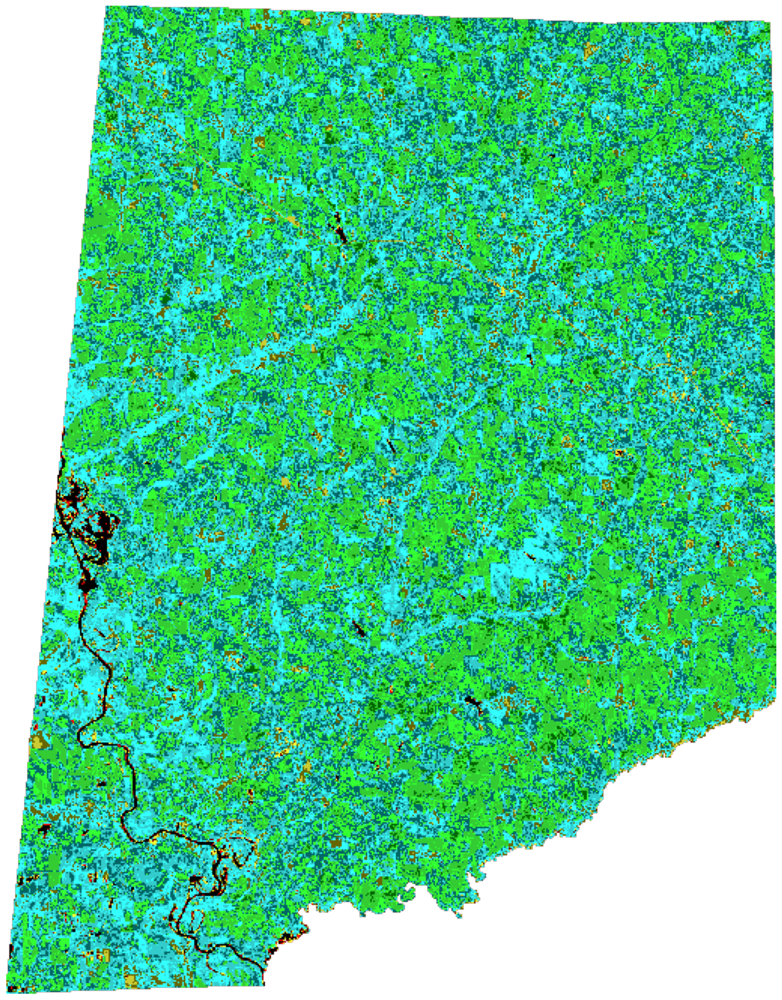

In [172]:
# read the image as numpy array
image_arr = np.array(Image.open(io.BytesIO(response.content)))

# plot the image for visualization
plt.figure(figsize=(16,16))
plt.axis('off')
plt.tight_layout()
plt.imshow(image_arr)

In [173]:
# agriculture evalscript
evalscript = """
//VERSION=3
let minVal = 0.0;
let maxVal = 0.4;

let viz = new HighlightCompressVisualizer(minVal, maxVal);

function setup() {
  return {
    input: ["B02", "B08", "B11", "dataMask"],
    output: { bands: 4 }
  };
}

function evaluatePixel(samples) {
    let val = [samples.B11, samples.B08, samples.B02, samples.dataMask];
    return viz.processList(val);
}

"""

In [174]:
json_request = {
  "input": {
    "bounds": {
      "geometry": {
        "type": "Polygon",
        "coordinates": [
          [
            [
              -88.297059,
              33.349083
            ],
            [
              -88.296279,
              33.355508
            ],
            [
              -88.296245,
              33.355793
            ],
            [
              -88.295859,
              33.358945
            ],
            [
              -88.295836,
              33.359137
            ],
            [
              -88.294867,
              33.367103
            ],
            [
              -88.293953,
              33.375121
            ],
            [
              -88.293233,
              33.381083
            ],
            [
              -88.293217,
              33.381216
            ],
            [
              -88.293006,
              33.382962
            ],
            [
              -88.292573,
              33.386522
            ],
            [
              -88.292575,
              33.386537
            ],
            [
              -88.292202,
              33.389628
            ],
            [
              -88.292192,
              33.38971
            ],
            [
              -88.291063,
              33.399053
            ],
            [
              -88.291062,
              33.399065
            ],
            [
              -88.290796,
              33.401264
            ],
            [
              -88.290057,
              33.407386
            ],
            [
              -88.289705,
              33.410302
            ],
            [
              -88.289683,
              33.410484
            ],
            [
              -88.287695,
              33.42694
            ],
            [
              -88.286467,
              33.437116
            ],
            [
              -88.286239,
              33.439006
            ],
            [
              -88.285921,
              33.44164
            ],
            [
              -88.285602,
              33.44428
            ],
            [
              -88.285586,
              33.444411
            ],
            [
              -88.28485,
              33.450508
            ],
            [
              -88.283877,
              33.45857
            ],
            [
              -88.283369,
              33.462778
            ],
            [
              -88.283348,
              33.462949
            ],
            [
              -88.283184,
              33.464306
            ],
            [
              -88.283151,
              33.464582
            ],
            [
              -88.283126,
              33.46479
            ],
            [
              -88.282753,
              33.467874
            ],
            [
              -88.282441,
              33.470454
            ],
            [
              -88.282106,
              33.473236
            ],
            [
              -88.281851,
              33.475341
            ],
            [
              -88.281748,
              33.476197
            ],
            [
              -88.28165,
              33.47701
            ],
            [
              -88.281636,
              33.477122
            ],
            [
              -88.280789,
              33.484131
            ],
            [
              -88.280787,
              33.484153
            ],
            [
              -88.280076,
              33.490042
            ],
            [
              -88.280065,
              33.490136
            ],
            [
              -88.279585,
              33.494115
            ],
            [
              -88.279551,
              33.494397
            ],
            [
              -88.279128,
              33.497895
            ],
            [
              -88.27886,
              33.500117
            ],
            [
              -88.278765,
              33.5005
            ],
            [
              -88.278712,
              33.500714
            ],
            [
              -88.278267,
              33.50475
            ],
            [
              -88.277388,
              33.512479
            ],
            [
              -88.277367,
              33.512666
            ],
            [
              -88.277364,
              33.512696
            ],
            [
              -88.277227,
              33.51372
            ],
            [
              -88.277156,
              33.5142
            ],
            [
              -88.277001,
              33.515179
            ],
            [
              -88.276944,
              33.515616
            ],
            [
              -88.276802,
              33.516585
            ],
            [
              -88.275675,
              33.525532
            ],
            [
              -88.275646,
              33.525767
            ],
            [
              -88.274619,
              33.534008
            ],
            [
              -88.273833,
              33.533958
            ],
            [
              -88.271563,
              33.53392
            ],
            [
              -88.268316,
              33.533865
            ],
            [
              -88.258761,
              33.533704
            ],
            [
              -88.253182,
              33.533619
            ],
            [
              -88.25301,
              33.533613
            ],
            [
              -88.252996,
              33.533616
            ],
            [
              -88.250034,
              33.533558
            ],
            [
              -88.246291,
              33.533054
            ],
            [
              -88.23857,
              33.532994
            ],
            [
              -88.22858,
              33.532915
            ],
            [
              -88.218159,
              33.532832
            ],
            [
              -88.210862,
              33.532759
            ],
            [
              -88.206555,
              33.532739
            ],
            [
              -88.20648,
              33.532739
            ],
            [
              -88.20642,
              33.532739
            ],
            [
              -88.201368,
              33.53259
            ],
            [
              -88.17692,
              33.531867
            ],
            [
              -88.16504,
              33.531514
            ],
            [
              -88.161403,
              33.531405
            ],
            [
              -88.161223,
              33.531398
            ],
            [
              -88.161206,
              33.531397
            ],
            [
              -88.158264,
              33.531267
            ],
            [
              -88.147675,
              33.530969
            ],
            [
              -88.14476,
              33.530887
            ],
            [
              -88.144726,
              33.530886
            ],
            [
              -88.135555,
              33.530628
            ],
            [
              -88.130419,
              33.530434
            ],
            [
              -88.125028,
              33.530332
            ],
            [
              -88.124304,
              33.530234
            ],
            [
              -88.115109,
              33.529974
            ],
            [
              -88.095518,
              33.52942
            ],
            [
              -88.092284,
              33.529297
            ],
            [
              -88.085736,
              33.529072
            ],
            [
              -88.085583,
              33.529068
            ],
            [
              -88.083806,
              33.529004
            ],
            [
              -88.081787,
              33.528923
            ],
            [
              -88.081763,
              33.528922
            ],
            [
              -88.081266,
              33.528874
            ],
            [
              -88.076516,
              33.52866
            ],
            [
              -88.074973,
              33.528588
            ],
            [
              -88.070349,
              33.528371
            ],
            [
              -88.070195,
              33.528385
            ],
            [
              -88.069994,
              33.528365
            ],
            [
              -88.069933,
              33.528362
            ],
            [
              -88.069839,
              33.528357
            ],
            [
              -88.063939,
              33.528077
            ],
            [
              -88.063757,
              33.528067
            ],
            [
              -88.058724,
              33.527803
            ],
            [
              -88.058711,
              33.527802
            ],
            [
              -88.058075,
              33.527769
            ],
            [
              -88.05803,
              33.527766
            ],
            [
              -88.051595,
              33.52743
            ],
            [
              -88.050873,
              33.527467
            ],
            [
              -88.050575,
              33.527451
            ],
            [
              -88.048533,
              33.527344
            ],
            [
              -88.044343,
              33.527254
            ],
            [
              -88.04037,
              33.527168
            ],
            [
              -88.036644,
              33.527174
            ],
            [
              -88.03315,
              33.527126
            ],
            [
              -88.026464,
              33.527034
            ],
            [
              -88.026447,
              33.527034
            ],
            [
              -88.02445,
              33.527008
            ],
            [
              -88.023975,
              33.527002
            ],
            [
              -88.023911,
              33.527001
            ],
            [
              -88.023892,
              33.527
            ],
            [
              -88.023877,
              33.527
            ],
            [
              -88.023863,
              33.527
            ],
            [
              -88.01484,
              33.526764
            ],
            [
              -88.01004,
              33.52664
            ],
            [
              -88.010006,
              33.526639
            ],
            [
              -88.009872,
              33.526637
            ],
            [
              -88.007172,
              33.526567
            ],
            [
              -88.001548,
              33.526423
            ],
            [
              -88.001326,
              33.526417
            ],
            [
              -88.000022,
              33.52623
            ],
            [
              -87.996227,
              33.526069
            ],
            [
              -87.990435,
              33.525827
            ],
            [
              -87.990151,
              33.525814
            ],
            [
              -87.990133,
              33.525813
            ],
            [
              -87.978576,
              33.525329
            ],
            [
              -87.966146,
              33.524808
            ],
            [
              -87.946519,
              33.523987
            ],
            [
              -87.946519,
              33.524065
            ],
            [
              -87.937553,
              33.524181
            ],
            [
              -87.933144,
              33.524237
            ],
            [
              -87.932844,
              33.524242
            ],
            [
              -87.932801,
              33.524243
            ],
            [
              -87.921388,
              33.524389
            ],
            [
              -87.921368,
              33.524389
            ],
            [
              -87.909377,
              33.524546
            ],
            [
              -87.908804,
              33.524552
            ],
            [
              -87.900786,
              33.524658
            ],
            [
              -87.898831,
              33.524683
            ],
            [
              -87.898612,
              33.524686
            ],
            [
              -87.891365,
              33.52478
            ],
            [
              -87.885318,
              33.524859
            ],
            [
              -87.878684,
              33.524945
            ],
            [
              -87.875018,
              33.524993
            ],
            [
              -87.870726,
              33.525077
            ],
            [
              -87.866272,
              33.525181
            ],
            [
              -87.861862,
              33.525242
            ],
            [
              -87.860685,
              33.525259
            ],
            [
              -87.85856,
              33.525326
            ],
            [
              -87.854916,
              33.52523
            ],
            [
              -87.8503,
              33.525157
            ],
            [
              -87.845271,
              33.524985
            ],
            [
              -87.840683,
              33.524839
            ],
            [
              -87.840687,
              33.51756
            ],
            [
              -87.84071,
              33.514443
            ],
            [
              -87.840711,
              33.514288
            ],
            [
              -87.840657,
              33.511539
            ],
            [
              -87.840429,
              33.507382
            ],
            [
              -87.840282,
              33.505108
            ],
            [
              -87.840192,
              33.503391
            ],
            [
              -87.83999,
              33.500855
            ],
            [
              -87.839879,
              33.500114
            ],
            [
              -87.839789,
              33.499553
            ],
            [
              -87.839766,
              33.499406
            ],
            [
              -87.839695,
              33.496114
            ],
            [
              -87.839691,
              33.495877
            ],
            [
              -87.839639,
              33.4916
            ],
            [
              -87.839583,
              33.488805
            ],
            [
              -87.839387,
              33.47732
            ],
            [
              -87.839139,
              33.462799
            ],
            [
              -87.839137,
              33.462659
            ],
            [
              -87.839137,
              33.462643
            ],
            [
              -87.839028,
              33.456282
            ],
            [
              -87.838784,
              33.442002
            ],
            [
              -87.838475,
              33.438744
            ],
            [
              -87.838607,
              33.437831
            ],
            [
              -87.838835,
              33.436264
            ],
            [
              -87.838608,
              33.431877
            ],
            [
              -87.838605,
              33.431783
            ],
            [
              -87.838605,
              33.431767
            ],
            [
              -87.838605,
              33.431738
            ],
            [
              -87.838604,
              33.431691
            ],
            [
              -87.838604,
              33.431671
            ],
            [
              -87.838487,
              33.424706
            ],
            [
              -87.838356,
              33.414009
            ],
            [
              -87.838228,
              33.409267
            ],
            [
              -87.838406,
              33.391883
            ],
            [
              -87.83844,
              33.388531
            ],
            [
              -87.838191,
              33.377439
            ],
            [
              -87.838179,
              33.375116
            ],
            [
              -87.838209,
              33.370336
            ],
            [
              -87.838234,
              33.364748
            ],
            [
              -87.838264,
              33.361238
            ],
            [
              -87.838279,
              33.359505
            ],
            [
              -87.838406,
              33.346915
            ],
            [
              -87.838463,
              33.341383
            ],
            [
              -87.838426,
              33.336799
            ],
            [
              -87.838377,
              33.330767
            ],
            [
              -87.838359,
              33.328362
            ],
            [
              -87.838175,
              33.323406
            ],
            [
              -87.8381,
              33.321382
            ],
            [
              -87.838105,
              33.32115
            ],
            [
              -87.838106,
              33.321123
            ],
            [
              -87.838181,
              33.318164
            ],
            [
              -87.838159,
              33.314771
            ],
            [
              -87.838048,
              33.297373
            ],
            [
              -87.838035,
              33.295364
            ],
            [
              -87.838027,
              33.294091
            ],
            [
              -87.838021,
              33.292994
            ],
            [
              -87.838442,
              33.284309
            ],
            [
              -87.838447,
              33.284193
            ],
            [
              -87.838572,
              33.281621
            ],
            [
              -87.838572,
              33.281604
            ],
            [
              -87.838571,
              33.281568
            ],
            [
              -87.838547,
              33.280656
            ],
            [
              -87.838489,
              33.278454
            ],
            [
              -87.838482,
              33.278207
            ],
            [
              -87.838298,
              33.271236
            ],
            [
              -87.837982,
              33.25916
            ],
            [
              -87.838091,
              33.258862
            ],
            [
              -87.838036,
              33.256822
            ],
            [
              -87.838254,
              33.256044
            ],
            [
              -87.838279,
              33.2539
            ],
            [
              -87.838281,
              33.253822
            ],
            [
              -87.838243,
              33.250118
            ],
            [
              -87.837895,
              33.248925
            ],
            [
              -87.837893,
              33.24888
            ],
            [
              -87.837892,
              33.248857
            ],
            [
              -87.837729,
              33.243294
            ],
            [
              -87.837598,
              33.238838
            ],
            [
              -87.837384,
              33.231564
            ],
            [
              -87.837208,
              33.225544
            ],
            [
              -87.836955,
              33.21689
            ],
            [
              -87.836954,
              33.216828
            ],
            [
              -87.836893,
              33.211696
            ],
            [
              -87.83674,
              33.200966
            ],
            [
              -87.836726,
              33.199527
            ],
            [
              -87.836715,
              33.198459
            ],
            [
              -87.836695,
              33.196438
            ],
            [
              -87.836693,
              33.196243
            ],
            [
              -87.836628,
              33.189604
            ],
            [
              -87.836596,
              33.186317
            ],
            [
              -87.836631,
              33.184899
            ],
            [
              -87.836661,
              33.183664
            ],
            [
              -87.836803,
              33.177959
            ],
            [
              -87.83707,
              33.167203
            ],
            [
              -87.837071,
              33.167173
            ],
            [
              -87.837325,
              33.159529
            ],
            [
              -87.837521,
              33.153637
            ],
            [
              -87.837842,
              33.153657
            ],
            [
              -87.83825,
              33.15345
            ],
            [
              -87.838359,
              33.152535
            ],
            [
              -87.838522,
              33.152192
            ],
            [
              -87.83874,
              33.152054
            ],
            [
              -87.839666,
              33.152146
            ],
            [
              -87.839857,
              33.151871
            ],
            [
              -87.839884,
              33.151206
            ],
            [
              -87.839639,
              33.150495
            ],
            [
              -87.839638,
              33.150199
            ],
            [
              -87.839938,
              33.150084
            ],
            [
              -87.840728,
              33.150404
            ],
            [
              -87.8413,
              33.150793
            ],
            [
              -87.841654,
              33.150908
            ],
            [
              -87.841926,
              33.150817
            ],
            [
              -87.841981,
              33.150702
            ],
            [
              -87.84209,
              33.150335
            ],
            [
              -87.842661,
              33.149213
            ],
            [
              -87.843097,
              33.148983
            ],
            [
              -87.843833,
              33.148868
            ],
            [
              -87.844623,
              33.148983
            ],
            [
              -87.845358,
              33.148615
            ],
            [
              -87.84563,
              33.148341
            ],
            [
              -87.845875,
              33.147768
            ],
            [
              -87.846011,
              33.147677
            ],
            [
              -87.846338,
              33.147654
            ],
            [
              -87.846855,
              33.147745
            ],
            [
              -87.847182,
              33.147516
            ],
            [
              -87.847291,
              33.147309
            ],
            [
              -87.847645,
              33.147149
            ],
            [
              -87.848571,
              33.147056
            ],
            [
              -87.849007,
              33.146943
            ],
            [
              -87.850259,
              33.147033
            ],
            [
              -87.850586,
              33.146897
            ],
            [
              -87.851675,
              33.146759
            ],
            [
              -87.852084,
              33.146507
            ],
            [
              -87.852329,
              33.146071
            ],
            [
              -87.852328,
              33.145728
            ],
            [
              -87.852247,
              33.145521
            ],
            [
              -87.851892,
              33.145108
            ],
            [
              -87.851892,
              33.144123
            ],
            [
              -87.852001,
              33.143918
            ],
            [
              -87.852219,
              33.143757
            ],
            [
              -87.852845,
              33.14362
            ],
            [
              -87.853853,
              33.143963
            ],
            [
              -87.853989,
              33.143711
            ],
            [
              -87.85377,
              33.142909
            ],
            [
              -87.853797,
              33.142428
            ],
            [
              -87.854369,
              33.141947
            ],
            [
              -87.85494,
              33.14119
            ],
            [
              -87.856057,
              33.140824
            ],
            [
              -87.85641,
              33.140182
            ],
            [
              -87.85671,
              33.140158
            ],
            [
              -87.856846,
              33.140273
            ],
            [
              -87.857064,
              33.140709
            ],
            [
              -87.857391,
              33.14096
            ],
            [
              -87.858426,
              33.141303
            ],
            [
              -87.858753,
              33.141601
            ],
            [
              -87.859162,
              33.141692
            ],
            [
              -87.859515,
              33.141166
            ],
            [
              -87.859951,
              33.141143
            ],
            [
              -87.860251,
              33.141349
            ],
            [
              -87.860251,
              33.141692
            ],
            [
              -87.859951,
              33.142105
            ],
            [
              -87.859897,
              33.142494
            ],
            [
              -87.860033,
              33.142654
            ],
            [
              -87.861068,
              33.142906
            ],
            [
              -87.861177,
              33.143067
            ],
            [
              -87.861178,
              33.143388
            ],
            [
              -87.86096,
              33.143639
            ],
            [
              -87.860878,
              33.143938
            ],
            [
              -87.861042,
              33.144098
            ],
            [
              -87.861641,
              33.144098
            ],
            [
              -87.86224,
              33.143662
            ],
            [
              -87.862784,
              33.143662
            ],
            [
              -87.863247,
              33.143569
            ],
            [
              -87.863764,
              33.143065
            ],
            [
              -87.864146,
              33.143065
            ],
            [
              -87.864391,
              33.143363
            ],
            [
              -87.864827,
              33.143431
            ],
            [
              -87.86499,
              33.14311
            ],
            [
              -87.864989,
              33.141759
            ],
            [
              -87.86567,
              33.141713
            ],
            [
              -87.865915,
              33.141553
            ],
            [
              -87.865942,
              33.141049
            ],
            [
              -87.867493,
              33.140292
            ],
            [
              -87.868283,
              33.140292
            ],
            [
              -87.869018,
              33.14052
            ],
            [
              -87.869699,
              33.140909
            ],
            [
              -87.869945,
              33.140909
            ],
            [
              -87.869917,
              33.140039
            ],
            [
              -87.870189,
              33.139695
            ],
            [
              -87.870733,
              33.139603
            ],
            [
              -87.871087,
              33.139809
            ],
            [
              -87.871415,
              33.140267
            ],
            [
              -87.871905,
              33.140335
            ],
            [
              -87.871931,
              33.139418
            ],
            [
              -87.872013,
              33.139305
            ],
            [
              -87.87362,
              33.139006
            ],
            [
              -87.874356,
              33.139304
            ],
            [
              -87.874558,
              33.139304
            ],
            [
              -87.874626,
              33.139212
            ],
            [
              -87.874626,
              33.138502
            ],
            [
              -87.875016,
              33.138342
            ],
            [
              -87.875595,
              33.138457
            ],
            [
              -87.875812,
              33.138641
            ],
            [
              -87.876003,
              33.139076
            ],
            [
              -87.87622,
              33.139237
            ],
            [
              -87.876602,
              33.13926
            ],
            [
              -87.876792,
              33.13919
            ],
            [
              -87.877855,
              33.13729
            ],
            [
              -87.878237,
              33.137107
            ],
            [
              -87.878863,
              33.136969
            ],
            [
              -87.879544,
              33.137222
            ],
            [
              -87.879898,
              33.137175
            ],
            [
              -87.880116,
              33.136924
            ],
            [
              -87.880171,
              33.13626
            ],
            [
              -87.881178,
              33.135688
            ],
            [
              -87.881995,
              33.135551
            ],
            [
              -87.88224,
              33.135734
            ],
            [
              -87.883003,
              33.135666
            ],
            [
              -87.883656,
              33.135849
            ],
            [
              -87.883901,
              33.135711
            ],
            [
              -87.88401,
              33.135506
            ],
            [
              -87.883929,
              33.135047
            ],
            [
              -87.883385,
              33.134406
            ],
            [
              -87.883167,
              33.134314
            ],
            [
              -87.883113,
              33.133626
            ],
            [
              -87.883358,
              33.133192
            ],
            [
              -87.883985,
              33.132711
            ],
            [
              -87.884747,
              33.132688
            ],
            [
              -87.884856,
              33.13262
            ],
            [
              -87.884802,
              33.132047
            ],
            [
              -87.885102,
              33.131794
            ],
            [
              -87.885592,
              33.131771
            ],
            [
              -87.886136,
              33.131956
            ],
            [
              -87.886463,
              33.131979
            ],
            [
              -87.886627,
              33.131818
            ],
            [
              -87.886926,
              33.131704
            ],
            [
              -87.887062,
              33.131796
            ],
            [
              -87.887225,
              33.132139
            ],
            [
              -87.88777,
              33.132047
            ],
            [
              -87.887988,
              33.132392
            ],
            [
              -87.888587,
              33.132506
            ],
            [
              -87.888886,
              33.132323
            ],
            [
              -87.888914,
              33.131566
            ],
            [
              -87.889377,
              33.130789
            ],
            [
              -87.890058,
              33.129964
            ],
            [
              -87.890194,
              33.129964
            ],
            [
              -87.890276,
              33.129827
            ],
            [
              -87.89112,
              33.129644
            ],
            [
              -87.891556,
              33.129713
            ],
            [
              -87.892182,
              33.129942
            ],
            [
              -87.8924,
              33.130125
            ],
            [
              -87.892427,
              33.130491
            ],
            [
              -87.891555,
              33.130536
            ],
            [
              -87.891201,
              33.130698
            ],
            [
              -87.890902,
              33.131064
            ],
            [
              -87.890956,
              33.131338
            ],
            [
              -87.891174,
              33.131453
            ],
            [
              -87.891609,
              33.131476
            ],
            [
              -87.892372,
              33.131271
            ],
            [
              -87.89259,
              33.131019
            ],
            [
              -87.892808,
              33.130881
            ],
            [
              -87.892808,
              33.130721
            ],
            [
              -87.89357,
              33.130629
            ],
            [
              -87.893706,
              33.130538
            ],
            [
              -87.893979,
              33.130515
            ],
            [
              -87.894877,
              33.130035
            ],
            [
              -87.895368,
              33.129942
            ],
            [
              -87.896702,
              33.129966
            ],
            [
              -87.89711,
              33.129897
            ],
            [
              -87.897655,
              33.129554
            ],
            [
              -87.897737,
              33.129257
            ],
            [
              -87.898036,
              33.128959
            ],
            [
              -87.898445,
              33.128959
            ],
            [
              -87.898771,
              33.128844
            ],
            [
              -87.898853,
              33.128638
            ],
            [
              -87.899153,
              33.128386
            ],
            [
              -87.899534,
              33.128295
            ],
            [
              -87.900106,
              33.128386
            ],
            [
              -87.900705,
              33.128089
            ],
            [
              -87.901222,
              33.127952
            ],
            [
              -87.901658,
              33.128158
            ],
            [
              -87.902202,
              33.128203
            ],
            [
              -87.902447,
              33.128135
            ],
            [
              -87.902393,
              33.127929
            ],
            [
              -87.902366,
              33.127563
            ],
            [
              -87.902121,
              33.127356
            ],
            [
              -87.902094,
              33.126944
            ],
            [
              -87.902312,
              33.126738
            ],
            [
              -87.903047,
              33.126807
            ],
            [
              -87.903319,
              33.126897
            ],
            [
              -87.903674,
              33.12683
            ],
            [
              -87.903892,
              33.126418
            ],
            [
              -87.903755,
              33.12621
            ],
            [
              -87.903319,
              33.125936
            ],
            [
              -87.903374,
              33.125492
            ],
            [
              -87.903798,
              33.125121
            ],
            [
              -87.905311,
              33.124671
            ],
            [
              -87.90561,
              33.124423
            ],
            [
              -87.905638,
              33.123987
            ],
            [
              -87.905529,
              33.123736
            ],
            [
              -87.905257,
              33.123551
            ],
            [
              -87.904821,
              33.12346
            ],
            [
              -87.904767,
              33.12314
            ],
            [
              -87.905012,
              33.122842
            ],
            [
              -87.905393,
              33.122659
            ],
            [
              -87.905774,
              33.122636
            ],
            [
              -87.90621,
              33.122751
            ],
            [
              -87.906618,
              33.122751
            ],
            [
              -87.906754,
              33.122613
            ],
            [
              -87.906754,
              33.122383
            ],
            [
              -87.906673,
              33.122293
            ],
            [
              -87.905965,
              33.12204
            ],
            [
              -87.905911,
              33.121581
            ],
            [
              -87.906028,
              33.121457
            ],
            [
              -87.906128,
              33.121353
            ],
            [
              -87.906918,
              33.121101
            ],
            [
              -87.907953,
              33.121124
            ],
            [
              -87.908742,
              33.121285
            ],
            [
              -87.908933,
              33.1214
            ],
            [
              -87.909069,
              33.121674
            ],
            [
              -87.909041,
              33.121995
            ],
            [
              -87.908742,
              33.122453
            ],
            [
              -87.908578,
              33.122889
            ],
            [
              -87.908687,
              33.123278
            ],
            [
              -87.909068,
              33.12353
            ],
            [
              -87.909531,
              33.123691
            ],
            [
              -87.910184,
              33.123668
            ],
            [
              -87.91062,
              33.12337
            ],
            [
              -87.910756,
              33.123072
            ],
            [
              -87.910811,
              33.122521
            ],
            [
              -87.910675,
              33.12211
            ],
            [
              -87.910675,
              33.121651
            ],
            [
              -87.910947,
              33.121536
            ],
            [
              -87.911655,
              33.12156
            ],
            [
              -87.911982,
              33.121721
            ],
            [
              -87.912444,
              33.12211
            ],
            [
              -87.912499,
              33.122408
            ],
            [
              -87.912172,
              33.122866
            ],
            [
              -87.91209,
              33.123347
            ],
            [
              -87.912172,
              33.123531
            ],
            [
              -87.912471,
              33.123621
            ],
            [
              -87.91307,
              33.123531
            ],
            [
              -87.913778,
              33.123187
            ],
            [
              -87.914894,
              33.123027
            ],
            [
              -87.915385,
              33.12289
            ],
            [
              -87.915793,
              33.1225
            ],
            [
              -87.915984,
              33.121927
            ],
            [
              -87.91631,
              33.121767
            ],
            [
              -87.9168,
              33.121699
            ],
            [
              -87.917781,
              33.12147
            ],
            [
              -87.917971,
              33.121285
            ],
            [
              -87.917971,
              33.120621
            ],
            [
              -87.918162,
              33.12037
            ],
            [
              -87.918434,
              33.120323
            ],
            [
              -87.918979,
              33.121012
            ],
            [
              -87.919441,
              33.121057
            ],
            [
              -87.919659,
              33.120874
            ],
            [
              -87.919686,
              33.120645
            ],
            [
              -87.919986,
              33.120508
            ],
            [
              -87.920204,
              33.120668
            ],
            [
              -87.92034,
              33.120989
            ],
            [
              -87.920694,
              33.121125
            ],
            [
              -87.920939,
              33.121125
            ],
            [
              -87.921184,
              33.120966
            ],
            [
              -87.921293,
              33.120691
            ],
            [
              -87.921347,
              33.120095
            ],
            [
              -87.921592,
              33.1195
            ],
            [
              -87.921892,
              33.119225
            ],
            [
              -87.922926,
              33.118767
            ],
            [
              -87.922954,
              33.118468
            ],
            [
              -87.9226,
              33.117987
            ],
            [
              -87.922518,
              33.117644
            ],
            [
              -87.922627,
              33.117324
            ],
            [
              -87.922818,
              33.117162
            ],
            [
              -87.923417,
              33.117049
            ],
            [
              -87.924016,
              33.117255
            ],
            [
              -87.924261,
              33.117507
            ],
            [
              -87.92426,
              33.118767
            ],
            [
              -87.92407,
              33.11934
            ],
            [
              -87.923607,
              33.120027
            ],
            [
              -87.923688,
              33.120302
            ],
            [
              -87.923906,
              33.120417
            ],
            [
              -87.924178,
              33.120393
            ],
            [
              -87.924968,
              33.119752
            ],
            [
              -87.92524,
              33.119317
            ],
            [
              -87.925295,
              33.118698
            ],
            [
              -87.925404,
              33.118606
            ],
            [
              -87.925758,
              33.118584
            ],
            [
              -87.925921,
              33.118698
            ],
            [
              -87.926356,
              33.119774
            ],
            [
              -87.926329,
              33.1206
            ],
            [
              -87.926248,
              33.120714
            ],
            [
              -87.926275,
              33.121195
            ],
            [
              -87.926411,
              33.121333
            ],
            [
              -87.926683,
              33.121402
            ],
            [
              -87.927146,
              33.121104
            ],
            [
              -87.927364,
              33.120623
            ],
            [
              -87.927473,
              33.119912
            ],
            [
              -87.928072,
              33.118011
            ],
            [
              -87.928507,
              33.11737
            ],
            [
              -87.928671,
              33.116683
            ],
            [
              -87.929052,
              33.116498
            ],
            [
              -87.929923,
              33.116408
            ],
            [
              -87.930413,
              33.116545
            ],
            [
              -87.930985,
              33.116293
            ],
            [
              -87.930767,
              33.115743
            ],
            [
              -87.930849,
              33.115537
            ],
            [
              -87.931529,
              33.11517
            ],
            [
              -87.931801,
              33.114415
            ],
            [
              -87.932319,
              33.114277
            ],
            [
              -87.932618,
              33.114071
            ],
            [
              -87.932645,
              33.113864
            ],
            [
              -87.932945,
              33.11359
            ],
            [
              -87.932972,
              33.113475
            ],
            [
              -87.933353,
              33.113177
            ],
            [
              -87.93368,
              33.1132
            ],
            [
              -87.933898,
              33.113338
            ],
            [
              -87.934006,
              33.113613
            ],
            [
              -87.933979,
              33.114277
            ],
            [
              -87.933843,
              33.114644
            ],
            [
              -87.933544,
              33.115125
            ],
            [
              -87.933516,
              33.11533
            ],
            [
              -87.933653,
              33.11556
            ],
            [
              -87.934088,
              33.11556
            ],
            [
              -87.934579,
              33.1154
            ],
            [
              -87.934906,
              33.115125
            ],
            [
              -87.935015,
              33.114827
            ],
            [
              -87.93496,
              33.114666
            ],
            [
              -87.935178,
              33.113979
            ],
            [
              -87.935532,
              33.11375
            ],
            [
              -87.937029,
              33.113428
            ],
            [
              -87.937982,
              33.113338
            ],
            [
              -87.938118,
              33.113452
            ],
            [
              -87.938145,
              33.11375
            ],
            [
              -87.937927,
              33.114207
            ],
            [
              -87.937955,
              33.114575
            ],
            [
              -87.938091,
              33.114666
            ],
            [
              -87.938309,
              33.114666
            ],
            [
              -87.938799,
              33.114002
            ],
            [
              -87.939506,
              33.113269
            ],
            [
              -87.939534,
              33.112857
            ],
            [
              -87.939425,
              33.112605
            ],
            [
              -87.939452,
              33.112146
            ],
            [
              -87.939806,
              33.111345
            ],
            [
              -87.940323,
              33.111322
            ],
            [
              -87.940541,
              33.111505
            ],
            [
              -87.940731,
              33.112032
            ],
            [
              -87.940895,
              33.112192
            ],
            [
              -87.941194,
              33.11226
            ],
            [
              -87.941602,
              33.112169
            ],
            [
              -87.942228,
              33.111871
            ],
            [
              -87.942528,
              33.111482
            ],
            [
              -87.942555,
              33.11123
            ],
            [
              -87.942392,
              33.111069
            ],
            [
              -87.941602,
              33.110954
            ],
            [
              -87.941167,
              33.110588
            ],
            [
              -87.940976,
              33.109993
            ],
            [
              -87.941112,
              33.109741
            ],
            [
              -87.941575,
              33.109443
            ],
            [
              -87.942038,
              33.10935
            ],
            [
              -87.942092,
              33.109603
            ],
            [
              -87.942446,
              33.109947
            ],
            [
              -87.942745,
              33.110016
            ],
            [
              -87.943344,
              33.109718
            ],
            [
              -87.943589,
              33.109327
            ],
            [
              -87.943589,
              33.108916
            ],
            [
              -87.942636,
              33.108595
            ],
            [
              -87.942772,
              33.107839
            ],
            [
              -87.943099,
              33.107633
            ],
            [
              -87.943616,
              33.10761
            ],
            [
              -87.944052,
              33.107839
            ],
            [
              -87.944106,
              33.108342
            ],
            [
              -87.944188,
              33.108412
            ],
            [
              -87.944079,
              33.108916
            ],
            [
              -87.944406,
              33.108893
            ],
            [
              -87.94476,
              33.108893
            ],
            [
              -87.94574,
              33.108342
            ],
            [
              -87.946366,
              33.10832
            ],
            [
              -87.94691,
              33.108137
            ],
            [
              -87.946937,
              33.107747
            ],
            [
              -87.94691,
              33.107472
            ],
            [
              -87.947073,
              33.107014
            ],
            [
              -87.947481,
              33.106212
            ],
            [
              -87.947726,
              33.106166
            ],
            [
              -87.948216,
              33.105731
            ],
            [
              -87.948488,
              33.105364
            ],
            [
              -87.949169,
              33.104768
            ],
            [
              -87.949414,
              33.104677
            ],
            [
              -87.949414,
              33.104517
            ],
            [
              -87.949795,
              33.104149
            ],
            [
              -87.94998,
              33.103915
            ],
            [
              -87.950121,
              33.103738
            ],
            [
              -87.950339,
              33.103439
            ],
            [
              -87.950405,
              33.1032
            ],
            [
              -87.950502,
              33.102843
            ],
            [
              -87.950584,
              33.102224
            ],
            [
              -87.950447,
              33.10078
            ],
            [
              -87.950257,
              33.100301
            ],
            [
              -87.950229,
              33.099614
            ],
            [
              -87.950637,
              33.098377
            ],
            [
              -87.950855,
              33.097987
            ],
            [
              -87.9511,
              33.09778
            ],
            [
              -87.951808,
              33.097529
            ],
            [
              -87.95227,
              33.097139
            ],
            [
              -87.952978,
              33.096359
            ],
            [
              -87.953223,
              33.095833
            ],
            [
              -87.953222,
              33.095191
            ],
            [
              -87.954147,
              33.093747
            ],
            [
              -87.954229,
              33.09313
            ],
            [
              -87.954229,
              33.092627
            ],
            [
              -87.95431,
              33.092581
            ],
            [
              -87.954337,
              33.091549
            ],
            [
              -87.954473,
              33.09116
            ],
            [
              -87.954882,
              33.090885
            ],
            [
              -87.955453,
              33.09084
            ],
            [
              -87.955834,
              33.091023
            ],
            [
              -87.956624,
              33.09171
            ],
            [
              -87.957168,
              33.09187
            ],
            [
              -87.95744,
              33.091687
            ],
            [
              -87.95744,
              33.091023
            ],
            [
              -87.957086,
              33.090358
            ],
            [
              -87.957167,
              33.09006
            ],
            [
              -87.957331,
              33.089877
            ],
            [
              -87.958365,
              33.089212
            ],
            [
              -87.958392,
              33.088869
            ],
            [
              -87.958201,
              33.088707
            ],
            [
              -87.957984,
              33.088662
            ],
            [
              -87.957602,
              33.088273
            ],
            [
              -87.957493,
              33.087884
            ],
            [
              -87.957493,
              33.087218
            ],
            [
              -87.957575,
              33.087035
            ],
            [
              -87.95782,
              33.08683
            ],
            [
              -87.957983,
              33.086807
            ],
            [
              -87.958391,
              33.086807
            ],
            [
              -87.959181,
              33.087494
            ],
            [
              -87.960487,
              33.088181
            ],
            [
              -87.961086,
              33.088112
            ],
            [
              -87.961358,
              33.087905
            ],
            [
              -87.962038,
              33.086944
            ],
            [
              -87.962119,
              33.086531
            ],
            [
              -87.962419,
              33.086073
            ],
            [
              -87.962636,
              33.085912
            ],
            [
              -87.962909,
              33.086027
            ],
            [
              -87.962909,
              33.086577
            ],
            [
              -87.963208,
              33.086989
            ],
            [
              -87.96348,
              33.08708
            ],
            [
              -87.96378,
              33.086875
            ],
            [
              -87.963807,
              33.08614
            ],
            [
              -87.963453,
              33.085659
            ],
            [
              -87.963453,
              33.085385
            ],
            [
              -87.964378,
              33.085293
            ],
            [
              -87.964732,
              33.085133
            ],
            [
              -87.964949,
              33.084881
            ],
            [
              -87.964976,
              33.084308
            ],
            [
              -87.965139,
              33.084102
            ],
            [
              -87.96552,
              33.084032
            ],
            [
              -87.966146,
              33.084423
            ],
            [
              -87.966555,
              33.0844
            ],
            [
              -87.966963,
              33.084102
            ],
            [
              -87.96718,
              33.083804
            ],
            [
              -87.967207,
              33.083437
            ],
            [
              -87.966744,
              33.082865
            ],
            [
              -87.9662,
              33.082566
            ],
            [
              -87.966173,
              33.082268
            ],
            [
              -87.966254,
              33.082062
            ],
            [
              -87.966581,
              33.081902
            ],
            [
              -87.967533,
              33.081856
            ],
            [
              -87.968023,
              33.081742
            ],
            [
              -87.968241,
              33.081604
            ],
            [
              -87.968241,
              33.081443
            ],
            [
              -87.968132,
              33.081328
            ],
            [
              -87.967669,
              33.081145
            ],
            [
              -87.967451,
              33.080962
            ],
            [
              -87.967478,
              33.080619
            ],
            [
              -87.968322,
              33.080458
            ],
            [
              -87.968485,
              33.079932
            ],
            [
              -87.967777,
              33.079451
            ],
            [
              -87.967723,
              33.079107
            ],
            [
              -87.967804,
              33.078924
            ],
            [
              -87.968321,
              33.078809
            ],
            [
              -87.968457,
              33.078924
            ],
            [
              -87.96873,
              33.079152
            ],
            [
              -87.969247,
              33.079244
            ],
            [
              -87.969491,
              33.079015
            ],
            [
              -87.969546,
              33.07874
            ],
            [
              -87.969165,
              33.078442
            ],
            [
              -87.968348,
              33.078235
            ],
            [
              -87.968267,
              33.078167
            ],
            [
              -87.968403,
              33.077847
            ],
            [
              -87.968838,
              33.077641
            ],
            [
              -87.969709,
              33.077572
            ],
            [
              -87.971151,
              33.078007
            ],
            [
              -87.971722,
              33.078006
            ],
            [
              -87.972185,
              33.077869
            ],
            [
              -87.974281,
              33.077868
            ],
            [
              -87.97439,
              33.078006
            ],
            [
              -87.975397,
              33.078325
            ],
            [
              -87.975996,
              33.078165
            ],
            [
              -87.976839,
              33.077753
            ],
            [
              -87.977574,
              33.077753
            ],
            [
              -87.977819,
              33.077844
            ],
            [
              -87.978254,
              33.07837
            ],
            [
              -87.978064,
              33.079493
            ],
            [
              -87.9782,
              33.079631
            ],
            [
              -87.979343,
              33.079814
            ],
            [
              -87.979779,
              33.080043
            ],
            [
              -87.980704,
              33.080982
            ],
            [
              -87.98114,
              33.080913
            ],
            [
              -87.981493,
              33.080615
            ],
            [
              -87.981548,
              33.080019
            ],
            [
              -87.981357,
              33.079469
            ],
            [
              -87.981275,
              33.079424
            ],
            [
              -87.98103,
              33.078598
            ],
            [
              -87.981084,
              33.078209
            ],
            [
              -87.981247,
              33.078094
            ],
            [
              -87.981791,
              33.077934
            ],
            [
              -87.98288,
              33.077888
            ],
            [
              -87.983206,
              33.078094
            ],
            [
              -87.983207,
              33.07885
            ],
            [
              -87.98337,
              33.078919
            ],
            [
              -87.983778,
              33.078919
            ],
            [
              -87.984159,
              33.078643
            ],
            [
              -87.984349,
              33.078392
            ],
            [
              -87.984431,
              33.078024
            ],
            [
              -87.984403,
              33.077818
            ],
            [
              -87.983804,
              33.077132
            ],
            [
              -87.983831,
              33.076765
            ],
            [
              -87.984294,
              33.076673
            ],
            [
              -87.984838,
              33.076994
            ],
            [
              -87.985274,
              33.077565
            ],
            [
              -87.98522,
              33.078162
            ],
            [
              -87.985411,
              33.078391
            ],
            [
              -87.985683,
              33.078367
            ],
            [
              -87.985982,
              33.078207
            ],
            [
              -87.986934,
              33.077129
            ],
            [
              -87.98726,
              33.07697
            ],
            [
              -87.987233,
              33.07681
            ],
            [
              -87.987613,
              33.076121
            ],
            [
              -87.98881,
              33.075572
            ],
            [
              -87.989028,
              33.075297
            ],
            [
              -87.989,
              33.074999
            ],
            [
              -87.988755,
              33.074816
            ],
            [
              -87.988701,
              33.074633
            ],
            [
              -87.989435,
              33.074449
            ],
            [
              -87.989735,
              33.074266
            ],
            [
              -87.989898,
              33.073922
            ],
            [
              -87.989544,
              33.073394
            ],
            [
              -87.989516,
              33.073143
            ],
            [
              -87.990006,
              33.072868
            ],
            [
              -87.990822,
              33.072799
            ],
            [
              -87.99104,
              33.072845
            ],
            [
              -87.991475,
              33.073165
            ],
            [
              -87.991775,
              33.073211
            ],
            [
              -87.992183,
              33.073096
            ],
            [
              -87.992264,
              33.073003
            ],
            [
              -87.993026,
              33.07282
            ],
            [
              -87.993516,
              33.073186
            ],
            [
              -87.993788,
              33.073301
            ],
            [
              -87.994768,
              33.073141
            ],
            [
              -87.995339,
              33.073438
            ],
            [
              -87.996183,
              33.073461
            ],
            [
              -87.996591,
              33.0733
            ],
            [
              -87.996591,
              33.073002
            ],
            [
              -87.996373,
              33.072772
            ],
            [
              -87.996291,
              33.072498
            ],
            [
              -87.996345,
              33.072269
            ],
            [
              -87.996318,
              33.071925
            ],
            [
              -87.996127,
              33.071697
            ],
            [
              -87.996127,
              33.071353
            ],
            [
              -87.996562,
              33.071101
            ],
            [
              -87.997269,
              33.071008
            ],
            [
              -87.998113,
              33.071421
            ],
            [
              -87.998494,
              33.071466
            ],
            [
              -87.998793,
              33.071329
            ],
            [
              -87.999564,
              33.070549
            ],
            [
              -88.000019,
              33.070503
            ],
            [
              -88.00014,
              33.070667
            ],
            [
              -88.000366,
              33.070711
            ],
            [
              -88.000393,
              33.070872
            ],
            [
              -88.000434,
              33.070963
            ],
            [
              -88.000449,
              33.071084
            ],
            [
              -88.000483,
              33.071357
            ],
            [
              -88.000549,
              33.071883
            ],
            [
              -88.000592,
              33.072224
            ],
            [
              -88.000836,
              33.072398
            ],
            [
              -88.001136,
              33.072612
            ],
            [
              -88.001517,
              33.072727
            ],
            [
              -88.002523,
              33.072682
            ],
            [
              -88.002577,
              33.072646
            ],
            [
              -88.002823,
              33.072477
            ],
            [
              -88.00285,
              33.072362
            ],
            [
              -88.002905,
              33.072316
            ],
            [
              -88.002959,
              33.071789
            ],
            [
              -88.003205,
              33.071606
            ],
            [
              -88.003532,
              33.071697
            ],
            [
              -88.003994,
              33.072201
            ],
            [
              -88.004347,
              33.072684
            ],
            [
              -88.004347,
              33.072842
            ],
            [
              -88.004347,
              33.073003
            ],
            [
              -88.003912,
              33.073348
            ],
            [
              -88.003912,
              33.073577
            ],
            [
              -88.004075,
              33.073645
            ],
            [
              -88.004736,
              33.073475
            ],
            [
              -88.004782,
              33.073462
            ],
            [
              -88.00481,
              33.073324
            ],
            [
              -88.005066,
              33.072977
            ],
            [
              -88.005164,
              33.072844
            ],
            [
              -88.005599,
              33.072203
            ],
            [
              -88.005683,
              33.072108
            ],
            [
              -88.005844,
              33.071928
            ],
            [
              -88.006035,
              33.071814
            ],
            [
              -88.006293,
              33.071759
            ],
            [
              -88.00647,
              33.071722
            ],
            [
              -88.006715,
              33.071814
            ],
            [
              -88.007041,
              33.072135
            ],
            [
              -88.007341,
              33.072135
            ],
            [
              -88.007559,
              33.071998
            ],
            [
              -88.00757,
              33.071925
            ],
            [
              -88.007613,
              33.071654
            ],
            [
              -88.00752,
              33.071458
            ],
            [
              -88.007396,
              33.071196
            ],
            [
              -88.007396,
              33.071098
            ],
            [
              -88.007396,
              33.070738
            ],
            [
              -88.007587,
              33.070646
            ],
            [
              -88.008113,
              33.070622
            ],
            [
              -88.008566,
              33.070601
            ],
            [
              -88.009333,
              33.070422
            ],
            [
              -88.009355,
              33.070417
            ],
            [
              -88.009573,
              33.070532
            ],
            [
              -88.009573,
              33.07067
            ],
            [
              -88.009627,
              33.070739
            ],
            [
              -88.009659,
              33.070901
            ],
            [
              -88.009681,
              33.071013
            ],
            [
              -88.00975,
              33.071083
            ],
            [
              -88.009817,
              33.071151
            ],
            [
              -88.01014,
              33.071151
            ],
            [
              -88.010606,
              33.071151
            ],
            [
              -88.010933,
              33.071266
            ],
            [
              -88.011395,
              33.071289
            ],
            [
              -88.011668,
              33.071174
            ],
            [
              -88.011809,
              33.071075
            ],
            [
              -88.011994,
              33.070946
            ],
            [
              -88.012066,
              33.070839
            ],
            [
              -88.012103,
              33.070785
            ],
            [
              -88.012158,
              33.07051
            ],
            [
              -88.012103,
              33.070349
            ],
            [
              -88.01203,
              33.070265
            ],
            [
              -88.011967,
              33.070189
            ],
            [
              -88.011287,
              33.069913
            ],
            [
              -88.01107,
              33.0698
            ],
            [
              -88.01107,
              33.069685
            ],
            [
              -88.011102,
              33.069649
            ],
            [
              -88.011151,
              33.069594
            ],
            [
              -88.011832,
              33.069571
            ],
            [
              -88.012757,
              33.069823
            ],
            [
              -88.012947,
              33.069868
            ],
            [
              -88.01302,
              33.069823
            ],
            [
              -88.013165,
              33.069732
            ],
            [
              -88.01315,
              33.069628
            ],
            [
              -88.013138,
              33.069549
            ],
            [
              -88.012866,
              33.06909
            ],
            [
              -88.012908,
              33.068998
            ],
            [
              -88.013193,
              33.068379
            ],
            [
              -88.013189,
              33.068354
            ],
            [
              -88.013171,
              33.068225
            ],
            [
              -88.013138,
              33.067991
            ],
            [
              -88.012975,
              33.067807
            ],
            [
              -88.013003,
              33.067555
            ],
            [
              -88.013166,
              33.067372
            ],
            [
              -88.013765,
              33.067304
            ],
            [
              -88.014118,
              33.067464
            ],
            [
              -88.014553,
              33.067831
            ],
            [
              -88.014825,
              33.068013
            ],
            [
              -88.015043,
              33.06806
            ],
            [
              -88.01537,
              33.067877
            ],
            [
              -88.015506,
              33.067648
            ],
            [
              -88.015587,
              33.067349
            ],
            [
              -88.015696,
              33.067144
            ],
            [
              -88.01605,
              33.067098
            ],
            [
              -88.016522,
              33.067529
            ],
            [
              -88.016703,
              33.067694
            ],
            [
              -88.017138,
              33.06767
            ],
            [
              -88.017289,
              33.067608
            ],
            [
              -88.017465,
              33.067534
            ],
            [
              -88.017554,
              33.067389
            ],
            [
              -88.017873,
              33.06687
            ],
            [
              -88.017982,
              33.066755
            ],
            [
              -88.018308,
              33.066546
            ],
            [
              -88.018344,
              33.066522
            ],
            [
              -88.018554,
              33.066389
            ],
            [
              -88.01909,
              33.066389
            ],
            [
              -88.019696,
              33.066389
            ],
            [
              -88.020131,
              33.066642
            ],
            [
              -88.020675,
              33.066871
            ],
            [
              -88.020752,
              33.066856
            ],
            [
              -88.021138,
              33.066778
            ],
            [
              -88.021274,
              33.066665
            ],
            [
              -88.021383,
              33.066459
            ],
            [
              -88.021302,
              33.066184
            ],
            [
              -88.021152,
              33.066062
            ],
            [
              -88.019833,
              33.064991
            ],
            [
              -88.019588,
              33.06474
            ],
            [
              -88.01967,
              33.064557
            ],
            [
              -88.019764,
              33.064451
            ],
            [
              -88.019833,
              33.064373
            ],
            [
              -88.019931,
              33.064368
            ],
            [
              -88.020241,
              33.064352
            ],
            [
              -88.021166,
              33.06481
            ],
            [
              -88.021574,
              33.064833
            ],
            [
              -88.0222,
              33.064742
            ],
            [
              -88.022363,
              33.06481
            ],
            [
              -88.022826,
              33.065269
            ],
            [
              -88.023206,
              33.065406
            ],
            [
              -88.023478,
              33.065452
            ],
            [
              -88.023696,
              33.065384
            ],
            [
              -88.023768,
              33.0653
            ],
            [
              -88.024186,
              33.064811
            ],
            [
              -88.024593,
              33.064436
            ],
            [
              -88.024758,
              33.064284
            ],
            [
              -88.025084,
              33.064078
            ],
            [
              -88.025383,
              33.064055
            ],
            [
              -88.026282,
              33.064307
            ],
            [
              -88.026398,
              33.064314
            ],
            [
              -88.026437,
              33.064315
            ],
            [
              -88.026717,
              33.064331
            ],
            [
              -88.02675,
              33.06416
            ],
            [
              -88.026826,
              33.063758
            ],
            [
              -88.026956,
              33.063618
            ],
            [
              -88.026971,
              33.063602
            ],
            [
              -88.027507,
              33.063025
            ],
            [
              -88.027697,
              33.06291
            ],
            [
              -88.028024,
              33.062888
            ],
            [
              -88.028269,
              33.062934
            ],
            [
              -88.028591,
              33.06299
            ],
            [
              -88.02865,
              33.063001
            ],
            [
              -88.02884,
              33.062911
            ],
            [
              -88.028926,
              33.062809
            ],
            [
              -88.028976,
              33.06275
            ],
            [
              -88.029058,
              33.062086
            ],
            [
              -88.029018,
              33.061951
            ],
            [
              -88.029005,
              33.061908
            ],
            [
              -88.028949,
              33.061718
            ],
            [
              -88.028841,
              33.061605
            ],
            [
              -88.028698,
              33.061583
            ],
            [
              -88.028242,
              33.061512
            ],
            [
              -88.028106,
              33.061467
            ],
            [
              -88.028188,
              33.061307
            ],
            [
              -88.02846,
              33.061147
            ],
            [
              -88.029194,
              33.061124
            ],
            [
              -88.030092,
              33.061216
            ],
            [
              -88.030282,
              33.061352
            ],
            [
              -88.030446,
              33.061559
            ],
            [
              -88.030745,
              33.06172
            ],
            [
              -88.030963,
              33.061697
            ],
            [
              -88.031044,
              33.061697
            ],
            [
              -88.031235,
              33.061624
            ],
            [
              -88.031321,
              33.061591
            ],
            [
              -88.031343,
              33.061583
            ],
            [
              -88.03148,
              33.061284
            ],
            [
              -88.031344,
              33.060918
            ],
            [
              -88.030909,
              33.060322
            ],
            [
              -88.030855,
              33.060139
            ],
            [
              -88.0308,
              33.059956
            ],
            [
              -88.030882,
              33.059544
            ],
            [
              -88.030991,
              33.059314
            ],
            [
              -88.031045,
              33.05881
            ],
            [
              -88.030909,
              33.058421
            ],
            [
              -88.030229,
              33.057825
            ],
            [
              -88.029876,
              33.05755
            ],
            [
              -88.029386,
              33.057491
            ],
            [
              -88.029114,
              33.057457
            ],
            [
              -88.028998,
              33.057378
            ],
            [
              -88.028592,
              33.057099
            ],
            [
              -88.028516,
              33.057046
            ],
            [
              -88.028118,
              33.057046
            ],
            [
              -88.027591,
              33.057046
            ],
            [
              -88.027558,
              33.057024
            ],
            [
              -88.027455,
              33.056953
            ],
            [
              -88.027373,
              33.056655
            ],
            [
              -88.027319,
              33.056587
            ],
            [
              -88.027319,
              33.055946
            ],
            [
              -88.027434,
              33.055636
            ],
            [
              -88.027455,
              33.055579
            ],
            [
              -88.027556,
              33.055433
            ],
            [
              -88.027679,
              33.055255
            ],
            [
              -88.027755,
              33.055144
            ],
            [
              -88.027837,
              33.055065
            ],
            [
              -88.028136,
              33.054778
            ],
            [
              -88.029115,
              33.053998
            ],
            [
              -88.029605,
              33.05377
            ],
            [
              -88.031537,
              33.053266
            ],
            [
              -88.032298,
              33.052877
            ],
            [
              -88.032706,
              33.052809
            ],
            [
              -88.032951,
              33.052968
            ],
            [
              -88.032951,
              33.053129
            ],
            [
              -88.033005,
              33.054755
            ],
            [
              -88.033223,
              33.055168
            ],
            [
              -88.033685,
              33.055672
            ],
            [
              -88.033903,
              33.055764
            ],
            [
              -88.034063,
              33.055766
            ],
            [
              -88.034285,
              33.055768
            ],
            [
              -88.035508,
              33.055787
            ],
            [
              -88.035734,
              33.055858
            ],
            [
              -88.036024,
              33.055948
            ],
            [
              -88.036106,
              33.056131
            ],
            [
              -88.036106,
              33.056544
            ],
            [
              -88.03578,
              33.056986
            ],
            [
              -88.035752,
              33.057025
            ],
            [
              -88.035752,
              33.057116
            ],
            [
              -88.035643,
              33.057254
            ],
            [
              -88.035628,
              33.057502
            ],
            [
              -88.035621,
              33.057623
            ],
            [
              -88.035616,
              33.057712
            ],
            [
              -88.035779,
              33.057848
            ],
            [
              -88.036034,
              33.057934
            ],
            [
              -88.037846,
              33.058537
            ],
            [
              -88.038227,
              33.058812
            ],
            [
              -88.038717,
              33.059018
            ],
            [
              -88.039043,
              33.059064
            ],
            [
              -88.039342,
              33.058973
            ],
            [
              -88.039386,
              33.058923
            ],
            [
              -88.039587,
              33.058698
            ],
            [
              -88.039588,
              33.058124
            ],
            [
              -88.039479,
              33.057713
            ],
            [
              -88.039452,
              33.057392
            ],
            [
              -88.03937,
              33.057299
            ],
            [
              -88.039343,
              33.057001
            ],
            [
              -88.039234,
              33.056773
            ],
            [
              -88.039232,
              33.056747
            ],
            [
              -88.039207,
              33.056337
            ],
            [
              -88.039098,
              33.056223
            ],
            [
              -88.039098,
              33.055695
            ],
            [
              -88.039289,
              33.055238
            ],
            [
              -88.039425,
              33.054826
            ],
            [
              -88.039452,
              33.054116
            ],
            [
              -88.039433,
              33.054077
            ],
            [
              -88.039398,
              33.054001
            ],
            [
              -88.039371,
              33.053635
            ],
            [
              -88.039289,
              33.053589
            ],
            [
              -88.039262,
              33.053451
            ],
            [
              -88.039235,
              33.053382
            ],
            [
              -88.039208,
              33.053314
            ],
            [
              -88.039045,
              33.053016
            ],
            [
              -88.038936,
              33.052718
            ],
            [
              -88.038555,
              33.052214
            ],
            [
              -88.038119,
              33.051316
            ],
            [
              -88.038066,
              33.051206
            ],
            [
              -88.037984,
              33.050977
            ],
            [
              -88.03793,
              33.050908
            ],
            [
              -88.03793,
              33.050839
            ],
            [
              -88.037848,
              33.050748
            ],
            [
              -88.037848,
              33.050632
            ],
            [
              -88.03725,
              33.049602
            ],
            [
              -88.037005,
              33.049281
            ],
            [
              -88.036672,
              33.048949
            ],
            [
              -88.036407,
              33.048685
            ],
            [
              -88.034851,
              33.047041
            ],
            [
              -88.034803,
              33.04699
            ],
            [
              -88.034422,
              33.046439
            ],
            [
              -88.034368,
              33.046211
            ],
            [
              -88.034232,
              33.046028
            ],
            [
              -88.034014,
              33.045982
            ],
            [
              -88.033987,
              33.046463
            ],
            [
              -88.034096,
              33.046692
            ],
            [
              -88.034014,
              33.04715
            ],
            [
              -88.03366,
              33.047402
            ],
            [
              -88.033632,
              33.047407
            ],
            [
              -88.033198,
              33.047494
            ],
            [
              -88.03298,
              33.047356
            ],
            [
              -88.032885,
              33.046971
            ],
            [
              -88.032817,
              33.046692
            ],
            [
              -88.032736,
              33.046463
            ],
            [
              -88.032342,
              33.046104
            ],
            [
              -88.032029,
              33.04582
            ],
            [
              -88.032029,
              33.045752
            ],
            [
              -88.032002,
              33.045682
            ],
            [
              -88.031947,
              33.045523
            ],
            [
              -88.031893,
              33.045431
            ],
            [
              -88.031893,
              33.044446
            ],
            [
              -88.031812,
              33.044193
            ],
            [
              -88.031404,
              33.043461
            ],
            [
              -88.031398,
              33.043255
            ],
            [
              -88.031377,
              33.042544
            ],
            [
              -88.031486,
              33.04243
            ],
            [
              -88.031526,
              33.042295
            ],
            [
              -88.031568,
              33.042155
            ],
            [
              -88.031773,
              33.042122
            ],
            [
              -88.032873,
              33.041949
            ],
            [
              -88.033299,
              33.042068
            ],
            [
              -88.033363,
              33.042087
            ],
            [
              -88.033536,
              33.042316
            ],
            [
              -88.033553,
              33.042339
            ],
            [
              -88.033798,
              33.042293
            ],
            [
              -88.034016,
              33.042087
            ],
            [
              -88.034124,
              33.041857
            ],
            [
              -88.034124,
              33.041621
            ],
            [
              -88.034125,
              33.041354
            ],
            [
              -88.033825,
              33.041125
            ],
            [
              -88.033825,
              33.041027
            ],
            [
              -88.033825,
              33.040895
            ],
            [
              -88.034451,
              33.040827
            ],
            [
              -88.03484,
              33.04087
            ],
            [
              -88.035077,
              33.040895
            ],
            [
              -88.035477,
              33.040909
            ],
            [
              -88.035729,
              33.040919
            ],
            [
              -88.036165,
              33.040827
            ],
            [
              -88.036763,
              33.040895
            ],
            [
              -88.037715,
              33.041034
            ],
            [
              -88.038912,
              33.040988
            ],
            [
              -88.039837,
              33.040827
            ],
            [
              -88.04019,
              33.040851
            ],
            [
              -88.04038,
              33.040989
            ],
            [
              -88.040462,
              33.041286
            ],
            [
              -88.040544,
              33.041401
            ],
            [
              -88.040571,
              33.041584
            ],
            [
              -88.041142,
              33.041607
            ],
            [
              -88.04136,
              33.041446
            ],
            [
              -88.041468,
              33.041172
            ],
            [
              -88.041441,
              33.040622
            ],
            [
              -88.04136,
              33.038812
            ],
            [
              -88.041333,
              33.03801
            ],
            [
              -88.041524,
              33.037712
            ],
            [
              -88.041796,
              33.037529
            ],
            [
              -88.04192,
              33.037526
            ],
            [
              -88.042584,
              33.037506
            ],
            [
              -88.043155,
              33.037759
            ],
            [
              -88.043699,
              33.037919
            ],
            [
              -88.043991,
              33.037914
            ],
            [
              -88.044792,
              33.0379
            ],
            [
              -88.044978,
              33.037897
            ],
            [
              -88.045168,
              33.037805
            ],
            [
              -88.045206,
              33.037762
            ],
            [
              -88.045413,
              33.037529
            ],
            [
              -88.045685,
              33.037301
            ],
            [
              -88.046501,
              33.03698
            ],
            [
              -88.046637,
              33.036682
            ],
            [
              -88.046555,
              33.036338
            ],
            [
              -88.046448,
              33.036157
            ],
            [
              -88.046311,
              33.035926
            ],
            [
              -88.04574,
              33.035468
            ],
            [
              -88.044733,
              33.034895
            ],
            [
              -88.043956,
              33.034644
            ],
            [
              -88.043865,
              33.034615
            ],
            [
              -88.043102,
              33.034368
            ],
            [
              -88.042857,
              33.034115
            ],
            [
              -88.042857,
              33.033704
            ],
            [
              -88.042966,
              33.03352
            ],
            [
              -88.04302,
              33.033108
            ],
            [
              -88.043184,
              33.033017
            ],
            [
              -88.043265,
              33.032764
            ],
            [
              -88.043428,
              33.032626
            ],
            [
              -88.043891,
              33.032719
            ],
            [
              -88.045402,
              33.034032
            ],
            [
              -88.045631,
              33.034231
            ],
            [
              -88.045957,
              33.034712
            ],
            [
              -88.046246,
              33.035156
            ],
            [
              -88.046284,
              33.035216
            ],
            [
              -88.046335,
              33.035276
            ],
            [
              -88.046773,
              33.035789
            ],
            [
              -88.047344,
              33.036361
            ],
            [
              -88.047411,
              33.036442
            ],
            [
              -88.04758,
              33.036642
            ],
            [
              -88.047649,
              33.036724
            ],
            [
              -88.047898,
              33.037018
            ],
            [
              -88.048214,
              33.037393
            ],
            [
              -88.048867,
              33.038469
            ],
            [
              -88.049112,
              33.038767
            ],
            [
              -88.049143,
              33.038846
            ],
            [
              -88.049166,
              33.038905
            ],
            [
              -88.049384,
              33.039111
            ],
            [
              -88.04971,
              33.039271
            ],
            [
              -88.049818,
              33.039256
            ],
            [
              -88.050336,
              33.03918
            ],
            [
              -88.050569,
              33.039091
            ],
            [
              -88.051124,
              33.038882
            ],
            [
              -88.051588,
              33.038493
            ],
            [
              -88.051833,
              33.037874
            ],
            [
              -88.05186,
              33.037622
            ],
            [
              -88.052077,
              33.037278
            ],
            [
              -88.052377,
              33.037073
            ],
            [
              -88.052893,
              33.03705
            ],
            [
              -88.053791,
              33.037301
            ],
            [
              -88.054335,
              33.037622
            ],
            [
              -88.055151,
              33.038263
            ],
            [
              -88.057055,
              33.039707
            ],
            [
              -88.057109,
              33.040349
            ],
            [
              -88.05719,
              33.040532
            ],
            [
              -88.057972,
              33.041173
            ],
            [
              -88.058251,
              33.041403
            ],
            [
              -88.058284,
              33.041486
            ],
            [
              -88.05836,
              33.041677
            ],
            [
              -88.058414,
              33.041953
            ],
            [
              -88.058469,
              33.041998
            ],
            [
              -88.058496,
              33.042205
            ],
            [
              -88.058605,
              33.042364
            ],
            [
              -88.058686,
              33.042709
            ],
            [
              -88.058822,
              33.043075
            ],
            [
              -88.059124,
              33.043329
            ],
            [
              -88.059149,
              33.043349
            ],
            [
              -88.060645,
              33.044381
            ],
            [
              -88.061053,
              33.044748
            ],
            [
              -88.061406,
              33.045229
            ],
            [
              -88.062005,
              33.046168
            ],
            [
              -88.064262,
              33.047925
            ],
            [
              -88.064507,
              33.048115
            ],
            [
              -88.064616,
              33.048412
            ],
            [
              -88.064616,
              33.049031
            ],
            [
              -88.064591,
              33.049408
            ],
            [
              -88.064542,
              33.050156
            ],
            [
              -88.064535,
              33.050382
            ],
            [
              -88.064698,
              33.050978
            ],
            [
              -88.064997,
              33.051344
            ],
            [
              -88.065458,
              33.05136
            ],
            [
              -88.065704,
              33.051367
            ],
            [
              -88.066901,
              33.050978
            ],
            [
              -88.068941,
              33.051001
            ],
            [
              -88.069786,
              33.050727
            ],
            [
              -88.07033,
              33.050727
            ],
            [
              -88.070562,
              33.050764
            ],
            [
              -88.071104,
              33.050851
            ],
            [
              -88.071472,
              33.05091
            ],
            [
              -88.072451,
              33.051276
            ],
            [
              -88.073567,
              33.051918
            ],
            [
              -88.073837,
              33.052169
            ],
            [
              -88.074329,
              33.052628
            ],
            [
              -88.074873,
              33.052765
            ],
            [
              -88.077076,
              33.052742
            ],
            [
              -88.077783,
              33.052695
            ],
            [
              -88.07811,
              33.052536
            ],
            [
              -88.078382,
              33.052169
            ],
            [
              -88.078545,
              33.051757
            ],
            [
              -88.078762,
              33.051321
            ],
            [
              -88.078795,
              33.051288
            ],
            [
              -88.07911,
              33.050975
            ],
            [
              -88.079301,
              33.050784
            ],
            [
              -88.079542,
              33.050545
            ],
            [
              -88.07966,
              33.050427
            ],
            [
              -88.079777,
              33.050269
            ],
            [
              -88.079932,
              33.050061
            ],
            [
              -88.080095,
              33.049695
            ],
            [
              -88.080122,
              33.049511
            ],
            [
              -88.080231,
              33.049351
            ],
            [
              -88.080176,
              33.048687
            ],
            [
              -88.079986,
              33.048022
            ],
            [
              -88.079904,
              33.047815
            ],
            [
              -88.079578,
              33.047449
            ],
            [
              -88.079033,
              33.047221
            ],
            [
              -88.0782,
              33.047136
            ],
            [
              -88.078136,
              33.047129
            ],
            [
              -88.077864,
              33.047198
            ],
            [
              -88.077293,
              33.047427
            ],
            [
              -88.076178,
              33.04816
            ],
            [
              -88.07531,
              33.048946
            ],
            [
              -88.07509,
              33.049145
            ],
            [
              -88.074818,
              33.049259
            ],
            [
              -88.074274,
              33.049259
            ],
            [
              -88.074234,
              33.049224
            ],
            [
              -88.074033,
              33.049044
            ],
            [
              -88.073866,
              33.048893
            ],
            [
              -88.073829,
              33.048766
            ],
            [
              -88.073702,
              33.048321
            ],
            [
              -88.073784,
              33.046923
            ],
            [
              -88.073729,
              33.046557
            ],
            [
              -88.073702,
              33.046053
            ],
            [
              -88.073593,
              33.045502
            ],
            [
              -88.073593,
              33.044544
            ],
            [
              -88.073593,
              33.044517
            ],
            [
              -88.073605,
              33.044497
            ],
            [
              -88.073783,
              33.044174
            ],
            [
              -88.074028,
              33.043853
            ],
            [
              -88.074273,
              33.043624
            ],
            [
              -88.074518,
              33.043394
            ],
            [
              -88.074953,
              33.04312
            ],
            [
              -88.075418,
              33.042955
            ],
            [
              -88.076177,
              33.042685
            ],
            [
              -88.076699,
              33.042569
            ],
            [
              -88.077428,
              33.042409
            ],
            [
              -88.077623,
              33.042395
            ],
            [
              -88.080501,
              33.04218
            ],
            [
              -88.080828,
              33.042249
            ],
            [
              -88.081127,
              33.042386
            ],
            [
              -88.081589,
              33.042776
            ],
            [
              -88.081693,
              33.042898
            ],
            [
              -88.081725,
              33.042935
            ],
            [
              -88.081729,
              33.042988
            ],
            [
              -88.081753,
              33.043303
            ],
            [
              -88.081861,
              33.043577
            ],
            [
              -88.08197,
              33.044265
            ],
            [
              -88.081971,
              33.045502
            ],
            [
              -88.082134,
              33.045754
            ],
            [
              -88.082705,
              33.045914
            ],
            [
              -88.083276,
              33.045983
            ],
            [
              -88.083576,
              33.045868
            ],
            [
              -88.084038,
              33.045616
            ],
            [
              -88.084068,
              33.045586
            ],
            [
              -88.084473,
              33.045181
            ],
            [
              -88.084962,
              33.044081
            ],
            [
              -88.08518,
              33.043027
            ],
            [
              -88.085207,
              33.041814
            ],
            [
              -88.085125,
              33.041493
            ],
            [
              -88.084962,
              33.041241
            ],
            [
              -88.084554,
              33.040898
            ],
            [
              -88.084009,
              33.040692
            ],
            [
              -88.082437,
              33.04063
            ],
            [
              -88.082269,
              33.040622
            ],
            [
              -88.08185,
              33.040481
            ],
            [
              -88.081506,
              33.040366
            ],
            [
              -88.081317,
              33.040303
            ],
            [
              -88.081297,
              33.040294
            ],
            [
              -88.08083,
              33.04007
            ],
            [
              -88.080174,
              33.039661
            ],
            [
              -88.079929,
              33.039295
            ],
            [
              -88.079957,
              33.039133
            ],
            [
              -88.079848,
              33.039066
            ],
            [
              -88.079848,
              33.038629
            ],
            [
              -88.07992,
              33.038615
            ],
            [
              -88.079956,
              33.038607
            ],
            [
              -88.079929,
              33.038493
            ],
            [
              -88.080038,
              33.038424
            ],
            [
              -88.080038,
              33.038252
            ],
            [
              -88.080038,
              33.038195
            ],
            [
              -88.080174,
              33.037965
            ],
            [
              -88.080663,
              33.037553
            ],
            [
              -88.081059,
              33.037456
            ],
            [
              -88.081506,
              33.037346
            ],
            [
              -88.082159,
              33.037072
            ],
            [
              -88.082649,
              33.036797
            ],
            [
              -88.083464,
              33.036385
            ],
            [
              -88.084892,
              33.036084
            ],
            [
              -88.084987,
              33.036064
            ],
            [
              -88.085477,
              33.036109
            ],
            [
              -88.086075,
              33.036247
            ],
            [
              -88.086347,
              33.036384
            ],
            [
              -88.087027,
              33.036819
            ],
            [
              -88.089285,
              33.038629
            ],
            [
              -88.090101,
              33.039018
            ],
            [
              -88.090451,
              33.039096
            ],
            [
              -88.090509,
              33.039109
            ],
            [
              -88.091271,
              33.038995
            ],
            [
              -88.091625,
              33.038857
            ],
            [
              -88.091952,
              33.038559
            ],
            [
              -88.092218,
              33.038235
            ],
            [
              -88.092387,
              33.038032
            ],
            [
              -88.092443,
              33.037933
            ],
            [
              -88.092657,
              33.037559
            ],
            [
              -88.09274,
              33.037414
            ],
            [
              -88.092849,
              33.037322
            ],
            [
              -88.09293,
              33.037139
            ],
            [
              -88.093556,
              33.036382
            ],
            [
              -88.093991,
              33.036039
            ],
            [
              -88.094671,
              33.035787
            ],
            [
              -88.094937,
              33.035725
            ],
            [
              -88.095459,
              33.035603
            ],
            [
              -88.095529,
              33.035598
            ],
            [
              -88.096601,
              33.035534
            ],
            [
              -88.097499,
              33.035556
            ],
            [
              -88.099131,
              33.035739
            ],
            [
              -88.100137,
              33.035967
            ],
            [
              -88.100654,
              33.036197
            ],
            [
              -88.101416,
              33.036793
            ],
            [
              -88.102749,
              33.037342
            ],
            [
              -88.102885,
              33.037478
            ],
            [
              -88.10313,
              33.037525
            ],
            [
              -88.10361,
              33.037446
            ],
            [
              -88.103973,
              33.037387
            ],
            [
              -88.104734,
              33.037089
            ],
            [
              -88.10555,
              33.036562
            ],
            [
              -88.106148,
              33.036035
            ],
            [
              -88.106284,
              33.035852
            ],
            [
              -88.106338,
              33.035623
            ],
            [
              -88.106338,
              33.035187
            ],
            [
              -88.106147,
              33.034934
            ],
            [
              -88.10544,
              33.034317
            ],
            [
              -88.105412,
              33.034225
            ],
            [
              -88.105385,
              33.034134
            ],
            [
              -88.105412,
              33.033721
            ],
            [
              -88.105575,
              33.033468
            ],
            [
              -88.105739,
              33.033423
            ],
            [
              -88.106255,
              33.033538
            ],
            [
              -88.107488,
              33.033613
            ],
            [
              -88.107751,
              33.033628
            ],
            [
              -88.107979,
              33.033724
            ],
            [
              -88.108186,
              33.033811
            ],
            [
              -88.10835,
              33.033972
            ],
            [
              -88.108459,
              33.03443
            ],
            [
              -88.108623,
              33.036332
            ],
            [
              -88.108814,
              33.036813
            ],
            [
              -88.109031,
              33.037134
            ],
            [
              -88.109548,
              33.037546
            ],
            [
              -88.110528,
              33.038141
            ],
            [
              -88.111045,
              33.038324
            ],
            [
              -88.111758,
              33.038693
            ],
            [
              -88.112596,
              33.039125
            ],
            [
              -88.113358,
              33.039789
            ],
            [
              -88.113712,
              33.040156
            ],
            [
              -88.113957,
              33.040568
            ],
            [
              -88.113984,
              33.040728
            ],
            [
              -88.115209,
              33.041804
            ],
            [
              -88.116134,
              33.042171
            ],
            [
              -88.116923,
              33.042285
            ],
            [
              -88.117397,
              33.042259
            ],
            [
              -88.118373,
              33.042206
            ],
            [
              -88.119071,
              33.042169
            ],
            [
              -88.120159,
              33.042031
            ],
            [
              -88.120839,
              33.041779
            ],
            [
              -88.121736,
              33.041342
            ],
            [
              -88.122144,
              33.041044
            ],
            [
              -88.122661,
              33.040931
            ],
            [
              -88.123885,
              33.040884
            ],
            [
              -88.125025,
              33.040701
            ],
            [
              -88.125866,
              33.040588
            ],
            [
              -88.126084,
              33.040495
            ],
            [
              -88.126328,
              33.040474
            ],
            [
              -88.126709,
              33.040245
            ],
            [
              -88.126925,
              33.039955
            ],
            [
              -88.126982,
              33.039878
            ],
            [
              -88.126982,
              33.039626
            ],
            [
              -88.1269,
              33.039397
            ],
            [
              -88.126262,
              33.03888
            ],
            [
              -88.126221,
              33.038846
            ],
            [
              -88.126221,
              33.038818
            ],
            [
              -88.126221,
              33.038458
            ],
            [
              -88.126303,
              33.038342
            ],
            [
              -88.12652,
              33.038252
            ],
            [
              -88.12681,
              33.038224
            ],
            [
              -88.127744,
              33.038137
            ],
            [
              -88.127874,
              33.038092
            ],
            [
              -88.128071,
              33.038023
            ],
            [
              -88.128316,
              33.03784
            ],
            [
              -88.128506,
              33.037519
            ],
            [
              -88.128697,
              33.036924
            ],
            [
              -88.128915,
              33.036763
            ],
            [
              -88.129135,
              33.036724
            ],
            [
              -88.130106,
              33.036552
            ],
            [
              -88.130465,
              33.036489
            ],
            [
              -88.131035,
              33.036427
            ],
            [
              -88.131308,
              33.036398
            ],
            [
              -88.132233,
              33.036513
            ],
            [
              -88.132369,
              33.036513
            ],
            [
              -88.13324,
              33.036788
            ],
            [
              -88.134029,
              33.036808
            ],
            [
              -88.134192,
              33.036811
            ],
            [
              -88.134287,
              33.036765
            ],
            [
              -88.134654,
              33.036583
            ],
            [
              -88.134736,
              33.03649
            ],
            [
              -88.135072,
              33.03649
            ],
            [
              -88.135226,
              33.03649
            ],
            [
              -88.135579,
              33.03656
            ],
            [
              -88.136476,
              33.036996
            ],
            [
              -88.137319,
              33.037523
            ],
            [
              -88.137374,
              33.037706
            ],
            [
              -88.137209,
              33.039378
            ],
            [
              -88.137318,
              33.039425
            ],
            [
              -88.137318,
              33.039631
            ],
            [
              -88.137563,
              33.040066
            ],
            [
              -88.137671,
              33.040387
            ],
            [
              -88.137698,
              33.040501
            ],
            [
              -88.137916,
              33.040754
            ],
            [
              -88.138133,
              33.040844
            ],
            [
              -88.138596,
              33.040868
            ],
            [
              -88.138664,
              33.040849
            ],
            [
              -88.138922,
              33.040777
            ],
            [
              -88.13914,
              33.040456
            ],
            [
              -88.139184,
              33.040318
            ],
            [
              -88.139222,
              33.040204
            ],
            [
              -88.139358,
              33.040112
            ],
            [
              -88.139847,
              33.040067
            ],
            [
              -88.140065,
              33.040295
            ],
            [
              -88.140119,
              33.040709
            ],
            [
              -88.140255,
              33.040892
            ],
            [
              -88.140472,
              33.041097
            ],
            [
              -88.140907,
              33.041235
            ],
            [
              -88.141348,
              33.041251
            ],
            [
              -88.141587,
              33.041258
            ],
            [
              -88.141832,
              33.04119
            ],
            [
              -88.142485,
              33.040892
            ],
            [
              -88.142812,
              33.040549
            ],
            [
              -88.142975,
              33.04009
            ],
            [
              -88.143084,
              33.039243
            ],
            [
              -88.142976,
              33.03906
            ],
            [
              -88.142894,
              33.037961
            ],
            [
              -88.142841,
              33.036471
            ],
            [
              -88.143004,
              33.036197
            ],
            [
              -88.143222,
              33.035944
            ],
            [
              -88.143541,
              33.035925
            ],
            [
              -88.143956,
              33.035899
            ],
            [
              -88.144255,
              33.036105
            ],
            [
              -88.144554,
              33.036518
            ],
            [
              -88.145248,
              33.038003
            ],
            [
              -88.145261,
              33.03803
            ],
            [
              -88.145424,
              33.038235
            ],
            [
              -88.145451,
              33.038305
            ],
            [
              -88.145541,
              33.038398
            ],
            [
              -88.145696,
              33.038556
            ],
            [
              -88.146043,
              33.038725
            ],
            [
              -88.146076,
              33.038741
            ],
            [
              -88.146457,
              33.038764
            ],
            [
              -88.146657,
              33.038725
            ],
            [
              -88.146811,
              33.038694
            ],
            [
              -88.147654,
              33.03842
            ],
            [
              -88.148769,
              33.037756
            ],
            [
              -88.149395,
              33.037298
            ],
            [
              -88.150007,
              33.036623
            ],
            [
              -88.150184,
              33.036428
            ],
            [
              -88.150293,
              33.036175
            ],
            [
              -88.15032,
              33.035603
            ],
            [
              -88.150212,
              33.035328
            ],
            [
              -88.150097,
              33.035238
            ],
            [
              -88.149831,
              33.03503
            ],
            [
              -88.148472,
              33.034137
            ],
            [
              -88.147493,
              33.033769
            ],
            [
              -88.147248,
              33.033563
            ],
            [
              -88.147058,
              33.03331
            ],
            [
              -88.147031,
              33.033127
            ],
            [
              -88.146949,
              33.033082
            ],
            [
              -88.146922,
              33.032807
            ],
            [
              -88.147032,
              33.031066
            ],
            [
              -88.147126,
              33.030927
            ],
            [
              -88.14714,
              33.030906
            ],
            [
              -88.147132,
              33.030842
            ],
            [
              -88.147059,
              33.030287
            ],
            [
              -88.146896,
              33.030012
            ],
            [
              -88.146869,
              33.029852
            ],
            [
              -88.146516,
              33.029577
            ],
            [
              -88.146437,
              33.029539
            ],
            [
              -88.144294,
              33.028525
            ],
            [
              -88.144165,
              33.028464
            ],
            [
              -88.144096,
              33.02843
            ],
            [
              -88.143999,
              33.028362
            ],
            [
              -88.143552,
              33.028041
            ],
            [
              -88.142981,
              33.027354
            ],
            [
              -88.142954,
              33.027285
            ],
            [
              -88.1429,
              33.027192
            ],
            [
              -88.142845,
              33.027033
            ],
            [
              -88.142628,
              33.026735
            ],
            [
              -88.142574,
              33.026437
            ],
            [
              -88.142601,
              33.025841
            ],
            [
              -88.142928,
              33.02536
            ],
            [
              -88.143472,
              33.024971
            ],
            [
              -88.143989,
              33.024765
            ],
            [
              -88.145213,
              33.024628
            ],
            [
              -88.146001,
              33.024628
            ],
            [
              -88.146572,
              33.024377
            ],
            [
              -88.147035,
              33.024033
            ],
            [
              -88.147035,
              33.023941
            ],
            [
              -88.147416,
              33.023505
            ],
            [
              -88.147797,
              33.023186
            ],
            [
              -88.14864,
              33.022796
            ],
            [
              -88.149456,
              33.022018
            ],
            [
              -88.149586,
              33.021965
            ],
            [
              -88.151407,
              33.021428
            ],
            [
              -88.152746,
              33.021034
            ],
            [
              -88.153644,
              33.020736
            ],
            [
              -88.154134,
              33.020348
            ],
            [
              -88.154514,
              33.019866
            ],
            [
              -88.15495,
              33.019592
            ],
            [
              -88.155204,
              33.01957
            ],
            [
              -88.155493,
              33.019546
            ],
            [
              -88.155875,
              33.019706
            ],
            [
              -88.156513,
              33.020401
            ],
            [
              -88.156527,
              33.020417
            ],
            [
              -88.157153,
              33.020944
            ],
            [
              -88.157252,
              33.02098
            ],
            [
              -88.157778,
              33.021172
            ],
            [
              -88.158077,
              33.021196
            ],
            [
              -88.158295,
              33.021151
            ],
            [
              -88.158518,
              33.021
            ],
            [
              -88.158567,
              33.020967
            ],
            [
              -88.158621,
              33.020646
            ],
            [
              -88.158404,
              33.020303
            ],
            [
              -88.158404,
              33.020211
            ],
            [
              -88.158268,
              33.019959
            ],
            [
              -88.158268,
              33.019523
            ],
            [
              -88.158435,
              33.019222
            ],
            [
              -88.158458,
              33.019181
            ],
            [
              -88.15903,
              33.018906
            ],
            [
              -88.159818,
              33.018859
            ],
            [
              -88.160919,
              33.019125
            ],
            [
              -88.162292,
              33.019456
            ],
            [
              -88.162972,
              33.019502
            ],
            [
              -88.16319,
              33.019456
            ],
            [
              -88.163223,
              33.019426
            ],
            [
              -88.163543,
              33.019136
            ],
            [
              -88.163652,
              33.018655
            ],
            [
              -88.163584,
              33.017711
            ],
            [
              -88.163544,
              33.017166
            ],
            [
              -88.163408,
              33.016706
            ],
            [
              -88.163321,
              33.016613
            ],
            [
              -88.162957,
              33.016224
            ],
            [
              -88.16281,
              33.016066
            ],
            [
              -88.162783,
              33.015883
            ],
            [
              -88.162864,
              33.015745
            ],
            [
              -88.164741,
              33.014875
            ],
            [
              -88.165312,
              33.01444
            ],
            [
              -88.165829,
              33.01373
            ],
            [
              -88.166101,
              33.013615
            ],
            [
              -88.166128,
              33.013455
            ],
            [
              -88.166318,
              33.013272
            ],
            [
              -88.166775,
              33.013056
            ],
            [
              -88.166998,
              33.012951
            ],
            [
              -88.167227,
              33.012793
            ],
            [
              -88.167297,
              33.012745
            ],
            [
              -88.167406,
              33.012538
            ],
            [
              -88.167406,
              33.011598
            ],
            [
              -88.167502,
              33.011276
            ],
            [
              -88.167569,
              33.011049
            ],
            [
              -88.167841,
              33.010751
            ],
            [
              -88.168037,
              33.010616
            ],
            [
              -88.168304,
              33.01043
            ],
            [
              -88.169065,
              33.010042
            ],
            [
              -88.169115,
              33.010026
            ],
            [
              -88.170778,
              33.009492
            ],
            [
              -88.171423,
              33.009179
            ],
            [
              -88.171485,
              33.009149
            ],
            [
              -88.171627,
              33.009029
            ],
            [
              -88.171757,
              33.008668
            ],
            [
              -88.171458,
              33.008392
            ],
            [
              -88.170697,
              33.008049
            ],
            [
              -88.170126,
              33.007658
            ],
            [
              -88.169963,
              33.007545
            ],
            [
              -88.169827,
              33.007365
            ],
            [
              -88.169772,
              33.007292
            ],
            [
              -88.169908,
              33.00688
            ],
            [
              -88.17008,
              33.006459
            ],
            [
              -88.17018,
              33.006216
            ],
            [
              -88.170289,
              33.006033
            ],
            [
              -88.170289,
              33.005688
            ],
            [
              -88.170398,
              33.005367
            ],
            [
              -88.170398,
              33.005001
            ],
            [
              -88.170507,
              33.004544
            ],
            [
              -88.170969,
              33.004016
            ],
            [
              -88.171513,
              33.003765
            ],
            [
              -88.171861,
              33.003558
            ],
            [
              -88.171975,
              33.00349
            ],
            [
              -88.171935,
              33.003422
            ],
            [
              -88.172227,
              33.003225
            ],
            [
              -88.172227,
              33.003126
            ],
            [
              -88.172227,
              33.002926
            ],
            [
              -88.172227,
              33.000864
            ],
            [
              -88.172227,
              33.000625
            ],
            [
              -88.172293,
              33.000515
            ],
            [
              -88.172527,
              33.000126
            ],
            [
              -88.171852,
              32.99586
            ],
            [
              -88.172415,
              32.995851
            ],
            [
              -88.191811,
              32.995542
            ],
            [
              -88.193891,
              32.99551
            ],
            [
              -88.196704,
              32.995466
            ],
            [
              -88.218492,
              32.995123
            ],
            [
              -88.230377,
              32.994936
            ],
            [
              -88.232889,
              32.994897
            ],
            [
              -88.232903,
              32.994897
            ],
            [
              -88.250031,
              32.99434
            ],
            [
              -88.25267,
              32.994242
            ],
            [
              -88.263662,
              32.993843
            ],
            [
              -88.263676,
              32.993842
            ],
            [
              -88.264756,
              32.9938
            ],
            [
              -88.264872,
              32.993795
            ],
            [
              -88.277429,
              32.993332
            ],
            [
              -88.282905,
              32.993133
            ],
            [
              -88.283602,
              32.993108
            ],
            [
              -88.288785,
              32.992919
            ],
            [
              -88.288892,
              32.992924
            ],
            [
              -88.289041,
              32.992933
            ],
            [
              -88.289211,
              32.992942
            ],
            [
              -88.289255,
              32.992942
            ],
            [
              -88.293836,
              32.992953
            ],
            [
              -88.293863,
              32.992952
            ],
            [
              -88.294174,
              32.992939
            ],
            [
              -88.295023,
              32.992907
            ],
            [
              -88.295209,
              32.992902
            ],
            [
              -88.295233,
              32.992901
            ],
            [
              -88.296014,
              32.992879
            ],
            [
              -88.296853,
              32.992856
            ],
            [
              -88.298675,
              32.992776
            ],
            [
              -88.300497,
              32.992707
            ],
            [
              -88.301724,
              32.992661
            ],
            [
              -88.301744,
              32.992659
            ],
            [
              -88.302331,
              32.992609
            ],
            [
              -88.302929,
              32.992509
            ],
            [
              -88.303539,
              32.992418
            ],
            [
              -88.303634,
              32.992413
            ],
            [
              -88.303817,
              32.992404
            ],
            [
              -88.303879,
              32.992402
            ],
            [
              -88.303897,
              32.992403
            ],
            [
              -88.303914,
              32.992401
            ],
            [
              -88.310264,
              32.992142
            ],
            [
              -88.311529,
              32.992142
            ],
            [
              -88.319167,
              32.99205
            ],
            [
              -88.326405,
              32.99176
            ],
            [
              -88.328383,
              32.991681
            ],
            [
              -88.328873,
              32.991636
            ],
            [
              -88.329878,
              32.991545
            ],
            [
              -88.333339,
              32.991453
            ],
            [
              -88.333408,
              32.991452
            ],
            [
              -88.335436,
              32.991423
            ],
            [
              -88.335473,
              32.991422
            ],
            [
              -88.335618,
              32.99142
            ],
            [
              -88.335636,
              32.99142
            ],
            [
              -88.33579,
              32.991418
            ],
            [
              -88.339561,
              32.991363
            ],
            [
              -88.340432,
              32.991199
            ],
            [
              -88.33982,
              32.998044
            ],
            [
              -88.339634,
              33.000127
            ],
            [
              -88.339291,
              33.003003
            ],
            [
              -88.338452,
              33.010044
            ],
            [
              -88.336507,
              33.026361
            ],
            [
              -88.336498,
              33.02643
            ],
            [
              -88.336107,
              33.029704
            ],
            [
              -88.335965,
              33.03091
            ],
            [
              -88.334214,
              33.045601
            ],
            [
              -88.334211,
              33.045623
            ],
            [
              -88.334201,
              33.04571
            ],
            [
              -88.333471,
              33.051837
            ],
            [
              -88.333458,
              33.051943
            ],
            [
              -88.33101,
              33.07249
            ],
            [
              -88.330996,
              33.072606
            ],
            [
              -88.330934,
              33.073125
            ],
            [
              -88.328839,
              33.089888
            ],
            [
              -88.328007,
              33.096542
            ],
            [
              -88.327993,
              33.096655
            ],
            [
              -88.327122,
              33.103624
            ],
            [
              -88.327037,
              33.104304
            ],
            [
              -88.326353,
              33.10978
            ],
            [
              -88.326339,
              33.109948
            ],
            [
              -88.325443,
              33.120989
            ],
            [
              -88.324569,
              33.133246
            ],
            [
              -88.322505,
              33.142358
            ],
            [
              -88.322513,
              33.142829
            ],
            [
              -88.322476,
              33.143063
            ],
            [
              -88.322096,
              33.145553
            ],
            [
              -88.322035,
              33.145953
            ],
            [
              -88.32199,
              33.146345
            ],
            [
              -88.321935,
              33.146824
            ],
            [
              -88.321843,
              33.147518
            ],
            [
              -88.321755,
              33.148182
            ],
            [
              -88.320172,
              33.160175
            ],
            [
              -88.320164,
              33.160233
            ],
            [
              -88.319819,
              33.162846
            ],
            [
              -88.3198,
              33.162993
            ],
            [
              -88.319674,
              33.163948
            ],
            [
              -88.319589,
              33.164588
            ],
            [
              -88.319134,
              33.168024
            ],
            [
              -88.318078,
              33.176531
            ],
            [
              -88.318061,
              33.17667
            ],
            [
              -88.318054,
              33.176727
            ],
            [
              -88.318029,
              33.176927
            ],
            [
              -88.317766,
              33.17904
            ],
            [
              -88.317212,
              33.183497
            ],
            [
              -88.317135,
              33.184123
            ],
            [
              -88.317029,
              33.185195
            ],
            [
              -88.317025,
              33.185237
            ],
            [
              -88.316908,
              33.186411
            ],
            [
              -88.316901,
              33.186484
            ],
            [
              -88.316355,
              33.192005
            ],
            [
              -88.316347,
              33.192084
            ],
            [
              -88.31575,
              33.198113
            ],
            [
              -88.315652,
              33.199105
            ],
            [
              -88.315235,
              33.203322
            ],
            [
              -88.314962,
              33.205105
            ],
            [
              -88.314938,
              33.205263
            ],
            [
              -88.314898,
              33.205519
            ],
            [
              -88.313991,
              33.211428
            ],
            [
              -88.313989,
              33.211444
            ],
            [
              -88.313634,
              33.213743
            ],
            [
              -88.313629,
              33.213779
            ],
            [
              -88.312535,
              33.220923
            ],
            [
              -88.312065,
              33.225288
            ],
            [
              -88.311913,
              33.226695
            ],
            [
              -88.311896,
              33.226855
            ],
            [
              -88.311584,
              33.229759
            ],
            [
              -88.310835,
              33.236722
            ],
            [
              -88.310751,
              33.237409
            ],
            [
              -88.310747,
              33.237434
            ],
            [
              -88.31073,
              33.237575
            ],
            [
              -88.310724,
              33.23762
            ],
            [
              -88.310661,
              33.238135
            ],
            [
              -88.310636,
              33.238335
            ],
            [
              -88.310571,
              33.238864
            ],
            [
              -88.310563,
              33.238929
            ],
            [
              -88.310139,
              33.242367
            ],
            [
              -88.310114,
              33.242572
            ],
            [
              -88.310108,
              33.242621
            ],
            [
              -88.310043,
              33.243153
            ],
            [
              -88.30989,
              33.244396
            ],
            [
              -88.309876,
              33.24451
            ],
            [
              -88.309792,
              33.245194
            ],
            [
              -88.309761,
              33.245444
            ],
            [
              -88.309569,
              33.247003
            ],
            [
              -88.309559,
              33.247084
            ],
            [
              -88.309185,
              33.250121
            ],
            [
              -88.309231,
              33.250291
            ],
            [
              -88.309043,
              33.251261
            ],
            [
              -88.308781,
              33.253372
            ],
            [
              -88.308726,
              33.253812
            ],
            [
              -88.30828,
              33.257402
            ],
            [
              -88.308227,
              33.257824
            ],
            [
              -88.308172,
              33.258268
            ],
            [
              -88.308114,
              33.258733
            ],
            [
              -88.307962,
              33.259955
            ],
            [
              -88.307757,
              33.261603
            ],
            [
              -88.306295,
              33.273359
            ],
            [
              -88.30573,
              33.277901
            ],
            [
              -88.304747,
              33.285798
            ],
            [
              -88.304718,
              33.28603
            ],
            [
              -88.304434,
              33.28832
            ],
            [
              -88.304399,
              33.288611
            ],
            [
              -88.30437,
              33.288851
            ],
            [
              -88.304227,
              33.290036
            ],
            [
              -88.304134,
              33.290811
            ],
            [
              -88.303697,
              33.294448
            ],
            [
              -88.302759,
              33.302211
            ],
            [
              -88.302639,
              33.303209
            ],
            [
              -88.30261,
              33.303447
            ],
            [
              -88.300993,
              33.316826
            ],
            [
              -88.300798,
              33.31844
            ],
            [
              -88.300507,
              33.320847
            ],
            [
              -88.299435,
              33.32972
            ],
            [
              -88.298732,
              33.335473
            ],
            [
              -88.298725,
              33.335532
            ],
            [
              -88.297116,
              33.348622
            ],
            [
              -88.297102,
              33.348739
            ],
            [
              -88.297059,
              33.349083
            ]
          ]
        ]
      }
    },
    "data": [
      {
        "dataFilter": {
          "timeRange": {
            "from": "2022-11-19T00:00:00Z",
            "to": "2022-12-19T23:59:59Z"
          }
        },
        "type": "sentinel-2-l2a"
      }
    ]
  },
  "output": {
    "width": 512,
    "height": 657.648,
    "responses": [
      {
        "identifier": "default",
        "format": {
          "type": "image/png"
        }
      }
    ],
    "delivery": {
      "s3": {}
    }
  },
    "evalscript" : evalscript
}

In [175]:
# Set the request url and headers
url_request = 'https://services.sentinel-hub.com/api/v1/process'
headers_request = {
    "Authorization" : "Bearer %s" %token['access_token']
}

#Send the request
response = oauth.request(
    "POST", url_request, headers=headers_request, json = json_request
)

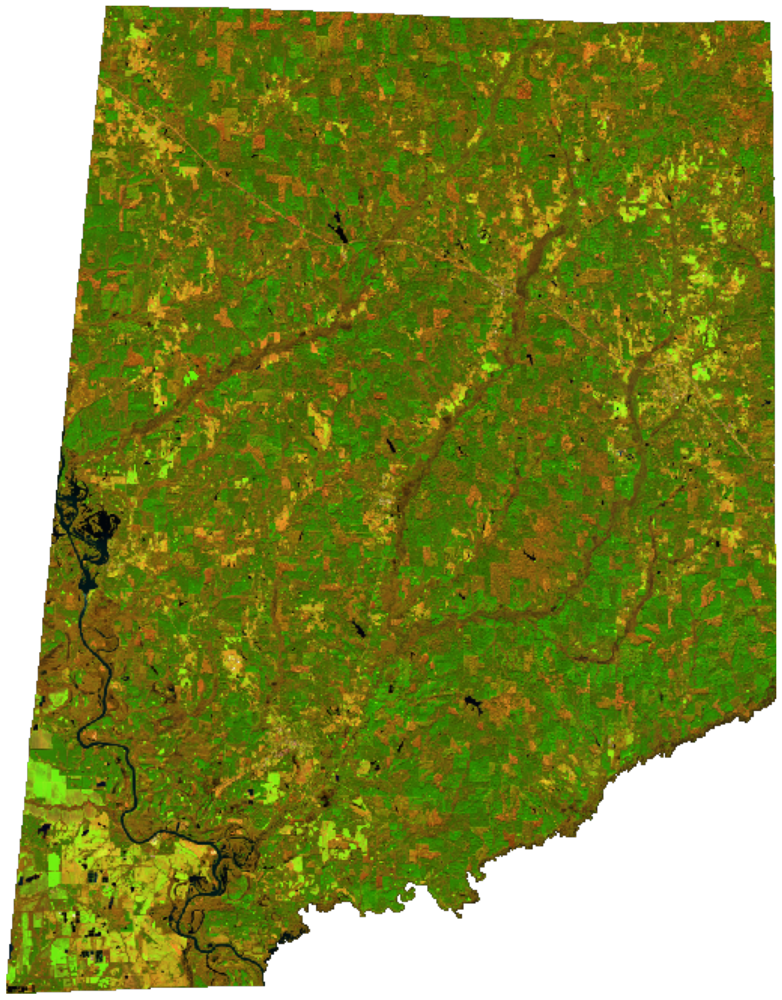

In [176]:
# read the image as numpy array
image_arr = np.array(Image.open(io.BytesIO(response.content)))

# plot the image for visualization
plt.figure(figsize=(16,16))
plt.axis('off')
plt.tight_layout()
plt.imshow(image_arr)